<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# 4. Preprocessing and Modelling

---

In [1]:
# imports
import requests
import numpy as np
import seaborn as sns
import pandas as pd
import time
import re
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pickle

# Prophet import
from prophet import Prophet
from prophet.plot import add_changepoints_to_plot
from prophet.diagnostics import cross_validation as prophet_cross_validation

# Auto ARIMA imports
import pmdarima as pm # to do Auto ARIMA
from pmdarima.arima import ADFTest # to perform ADF test
import pmdarima as pm

# SARIMAX import
from statsmodels.tsa.statespace.sarimax import SARIMAX

# VARMAX import
from statsmodels.tsa.statespace.varmax import VARMAX

# import ACF plot from statsmodels
from statsmodels.graphics.tsaplots import plot_acf

# import DARTS
from darts import TimeSeries
from darts.models import ExponentialSmoothing, VARIMA
from darts.utils.utils import ModelMode, SeasonalityMode
from darts.utils.statistics import check_seasonality

from IPython.display import Image, display

import math
from pydash import get, flatten
import json

# import from functions.py
from functions import plot_null_values_features_of_df
from functions import plot_values_by_symbol
from functions import get_min_max_date_for_stock_list
from functions import plot_min_max_date_for_hist_data
from functions import plot_moving_average_by_symbol, plot_value_difference_between_each_column_against_previous_by_symbol
from functions import create_time_lagged_columns_df
from functions import train_test_split_for_model
from functions import standardise_features
from functions import linear_model
from functions import correlation_matrix_df

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, GridSearchCV, ParameterGrid
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV, Ridge, ElasticNetCV, LogisticRegression
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, accuracy_score, f1_score, precision_score
from sklearn.metrics import recall_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split

%matplotlib inline
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)   # Disable column width restriction
#pd.set_option('display.max_colwidth', 100)

The `LightGBM` module could not be imported. To enable LightGBM support in Darts, follow the detailed instructions in the installation guide: https://github.com/unit8co/darts/blob/master/INSTALL.md
The `CatBoost` module could not be imported. To enable CatBoost support in Darts, follow the detailed instructions in the installation guide: https://github.com/unit8co/darts/blob/master/INSTALL.md


## 4.1 Import datasets

### 4.1.1 Import ticker info dataset

In [2]:
ticker_info_df = pd.read_pickle("./Data/merged_non_datetime_pre_process_df_complete.pkl")

In [3]:
ticker_info_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4654 entries, 0 to 4653
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   symbol       4653 non-null   object
 1   name         3631 non-null   object
 2   sector       3265 non-null   object
 3   industry     3265 non-null   object
 4   description  3276 non-null   object
 5   type         3633 non-null   object
 6   CEO          3136 non-null   object
 7   country      3633 non-null   object
dtypes: object(8)
memory usage: 291.0+ KB


In [4]:
ticker_info_df.head()

,symbol,name,sector,industry,description,type,CEO,country
0,AACG,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AACIW,Armada Acquisition Corp. I,NaN,NaN,NaN,Common Stock,NaN,US
2,AADI,"Aadi Bioscience, Inc.",Healthcare,Biotechnology,"Aadi Bioscience, Inc., a clinical-stage biopha...",Common Stock,Mr. Scott M. Giacobello CPA,US
3,AADR,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AAL,American Airlines Group Inc,Industrials,Airlines,"American Airlines Group Inc., through its subs...",Common Stock,Mr. Robert D. Isom Jr.,US


### 4.1.2 Import ticker income_statement + balance_sheet + cashflow dataset

In [5]:
ticker_financial_df = pd.read_pickle("./Data/ticker_financial_pre_process_df_complete.pkl")

In [6]:
ticker_financial_df.info(verbose=True,show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14754 entries, 0 to 14753
Data columns (total 341 columns):
 #    Column                                                                   Non-Null Count  Dtype  
---   ------                                                                   --------------  -----  
 0    date                                                                     14754 non-null  object 
 1    symbol                                                                   14751 non-null  object 
 2    is_Tax Effect Of Unusual Items                                           14308 non-null  float64
 3    is_Tax Rate For Calcs                                                    14308 non-null  float64
 4    is_Normalized EBITDA                                                     12492 non-null  float64
 5    is_Total Unusual Items                                                   10288 non-null  float64
 6    is_Total Unusual Items Excluding Goodwill                   

In [7]:
ticker_financial_df.head()

,date,symbol,is_Tax Effect Of Unusual Items,is_Tax Rate For Calcs,is_Normalized EBITDA,is_Total Unusual Items,is_Total Unusual Items Excluding Goodwill,is_Net Income From Continuing Operation Net Minority Interest,is_Reconciled Depreciation,is_Reconciled Cost Of Revenue,is_EBIT,is_Net Interest Income,is_Normalized Income,is_Net Income From Continuing And Discontinued Operation,is_Total Expenses,is_Total Operating Income As Reported,is_Diluted Average Shares,is_Basic Average Shares,is_Diluted EPS,is_Basic EPS,is_Diluted NI Availto Com Stockholders,is_Net Income Common Stockholders,is_Net Income,is_Minority Interests,is_Net Income Including Noncontrolling Interests,is_Net Income Discontinuous Operations,is_Net Income Continuous Operations,is_Tax Provision,is_Pretax Income,is_Other Income Expense,is_Special Income Charges,is_Gain On Sale Of Business,is_Write Off,is_Impairment Of Capital Assets,is_Earnings From Equity Interest,is_Gain On Sale Of Security,is_Net Non Operating Interest Income Expense,is_Total Other Finance Cost,is_Operating Income,is_Operating Expense,is_Other Operating Expenses,is_Provision For Doubtful Accounts,is_Research And Development,is_Selling General And Administration,is_Selling And Marketing Expense,is_General And Administrative Expense,is_Other Gand A,is_Gross Profit,is_Cost Of Revenue,is_Total Revenue,is_Operating Revenue,is_Interest Income,is_Interest Income Non Operating,is_Salaries And Wages,is_Interest Expense,is_Preferred Stock Dividends,is_Other Non Operating Income Expenses,is_Other Special Charges,is_Interest Expense Non Operating,is_Rent Expense Supplemental,is_Restructuring And Mergern Acquisition,is_Other Taxes,is_Average Dilution Earnings,is_Gain On Sale Of Ppe,is_Depreciation Amortization Depletion Income Statement,is_Depreciation And Amortization In Income Statement,is_Depreciation Income Statement,is_Insurance And Claims,is_Amortization,is_Amortization Of Intangibles Income Statement,is_Otherunder Preferred Stock Dividend,is_Net Income From Tax Loss Carryforward,is_Excise Taxes,is_Earnings From Equity Interest Net Of Tax,is_Rent And Landing Fees,is_Securities Amortization,is_Net Income Extraordinary,is_Depletion Income Statement,bs_Treasury Shares Number,bs_Ordinary Shares Number,bs_Share Issued,bs_Total Debt,bs_Tangible Book Value,bs_Invested Capital,bs_Working Capital,bs_Net Tangible Assets,bs_Capital Lease Obligations,bs_Common Stock Equity,bs_Total Capitalization,bs_Total Equity Gross Minority Interest,bs_Minority Interest,bs_Stockholders Equity,bs_Gains Losses Not Affecting Retained Earnings,bs_Other Equity Adjustments,bs_Treasury Stock,bs_Retained Earnings,bs_Additional Paid In Capital,bs_Capital Stock,bs_Common Stock,bs_Total Liabilities Net Minority Interest,bs_Total Non Current Liabilities Net Minority Interest,bs_Other Non Current Liabilities,bs_Preferred Securities Outside Stock Equity,bs_Non Current Deferred Liabilities,bs_Non Current Deferred Taxes Liabilities,bs_Long Term Debt And Capital Lease Obligation,bs_Long Term Capital Lease Obligation,bs_Current Liabilities,bs_Other Current Liabilities,bs_Current Deferred Liabilities,bs_Current Deferred Revenue,bs_Current Debt And Capital Lease Obligation,bs_Current Capital Lease Obligation,bs_Current Debt,bs_Other Current Borrowings,bs_Payables And Accrued Expenses,bs_Current Accrued Expenses,bs_Payables,bs_Other Payable,bs_Total Tax Payable,bs_Income Tax Payable,bs_Total Assets,bs_Total Non Current Assets,bs_Other Non Current Assets,bs_Non Current Deferred Assets,bs_Non Current Deferred Taxes Assets,bs_Investments And Advances,bs_Goodwill And Other Intangible Assets,bs_Other Intangible Assets,bs_Goodwill,bs_Net PPE,bs_Accumulated Depreciation,bs_Gross PPE,bs_Leases,bs_Other Properties,bs_Machinery Furniture Equipment,bs_Buildings And Improvements,bs_Properties,bs_Current Assets,bs_Other Current Assets,bs_Prepaid Assets,bs_Receivables,bs_Other Receivables,bs_Duefrom Related Parties Current,bs_Taxes Receivable,bs_Loans Receivable,bs_

### 4.1.3 Import ticker year_end historical dataset

In [8]:
ticker_year_hist_df = pd.read_pickle("./Data/ticker_year_hist_pre_process_df_complete.pkl")

In [9]:
ticker_year_hist_df.info(verbose=True,show_counts=True)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 27610 entries, 2013-12-30 to 2022-12-26
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   open      27610 non-null  float64
 1   high      27610 non-null  float64
 2   low       27610 non-null  float64
 3   close     27610 non-null  float64
 4   volume    27608 non-null  float64
 5   symbol    27610 non-null  object 
 6   currency  27610 non-null  object 
 7   date      27610 non-null  object 
 8   year      27610 non-null  int64  
 9   month     27610 non-null  int64  
 10  day       27610 non-null  int64  
dtypes: float64(5), int64(3), object(3)
memory usage: 2.5+ MB


In [10]:
ticker_year_hist_df.head()

,open,high,low,close,volume,symbol,currency,date,year,month,day
datetime,,,,,,,,,,,
2013-12-30,4.11,4.11,3.93,3.93,35900.0,AACG,USD,2013-12-30,2013,12,30
2013-12-30,27.00,27.20,27.00,27.01,0.0,AACIW,USD,2013-12-30,2013,12,30
2013-12-30,24.87,26.75,24.63,26.54,38834900.0,AAL,USD,2013-12-30,2013,12,30
2013-12-30,4.05,4.13,3.84,4.07,78000.0,AAME,USD,2013-12-30,2013,12,30
2013-12-30,14.85,15.10,14.26,14.35,190900.0,AAOI,USD,2013-12-30,2013,12,30


### 4.1.4 Import ticker month_end historical dataset

In [11]:
ticker_mth_hist_df = pd.read_pickle("./Data/ticker_mth_hist_pre_process_df_complete.pkl")

In [12]:
ticker_mth_hist_df.info(verbose=True,show_counts=True)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 346547 entries, 2013-01-28 to 2023-07-24
Data columns (total 11 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   open      346547 non-null  float64
 1   high      346547 non-null  float64
 2   low       346547 non-null  float64
 3   close     346547 non-null  float64
 4   volume    346513 non-null  float64
 5   symbol    346547 non-null  object 
 6   currency  346547 non-null  object 
 7   date      346547 non-null  object 
 8   year      346547 non-null  int64  
 9   month     346547 non-null  int64  
 10  day       346547 non-null  int64  
dtypes: float64(5), int64(3), object(3)
memory usage: 31.7+ MB


In [13]:
ticker_mth_hist_df.head()

,open,high,low,close,volume,symbol,currency,date,year,month,day
datetime,,,,,,,,,,,
2013-01-28,5.60,5.71,5.40,5.71,5.600000e+03,AACG,USD,2013-01-28,2013,1,28
2013-01-28,15.00,15.31,14.02,14.12,3.156070e+07,AAL,USD,2013-01-28,2013,1,28
2013-01-28,3.22,3.39,3.22,3.35,2.270000e+04,AAME,USD,2013-01-28,2013,1,28
2013-01-28,10.03,10.28,9.96,10.27,7.424040e+05,AAON,USD,2013-01-28,2013,1,28
2013-01-28,15.64,16.52,15.57,16.20,2.632545e+09,AAPL,USD,2013-01-28,2013,1,28


### 4.1.5 Import ticker weekly historical dataset

In [14]:
ticker_week_hist_df = pd.read_pickle("./Data/ticker_week_hist_pre_process_df_complete.pkl")

In [15]:
ticker_week_hist_df.info(verbose=True,show_counts=True)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1498339 entries, 2013-01-07 to 2023-07-24
Data columns (total 11 columns):
 #   Column    Non-Null Count    Dtype  
---  ------    --------------    -----  
 0   open      1498339 non-null  float64
 1   high      1498339 non-null  float64
 2   low       1498339 non-null  float64
 3   close     1498339 non-null  float64
 4   volume    1498199 non-null  float64
 5   symbol    1498339 non-null  object 
 6   currency  1498339 non-null  object 
 7   date      1498339 non-null  object 
 8   year      1498339 non-null  int64  
 9   month     1498339 non-null  int64  
 10  day       1498339 non-null  int64  
dtypes: float64(5), int64(3), object(3)
memory usage: 137.2+ MB


In [16]:
ticker_week_hist_df.head()

,open,high,low,close,volume,symbol,currency,date,year,month,day
datetime,,,,,,,,,,,
2013-01-07,6.05,6.19,5.93,5.93,8300.0,AACG,USD,2013-01-07,2013,1,7
2013-01-14,5.89,5.90,5.52,5.69,12700.0,AACG,USD,2013-01-14,2013,1,14
2013-01-21,5.68,5.81,5.40,5.54,15200.0,AACG,USD,2013-01-21,2013,1,21
2013-01-28,5.60,5.71,5.40,5.71,5600.0,AACG,USD,2013-01-28,2013,1,28
2013-02-04,5.65,5.70,4.72,5.00,28000.0,AACG,USD,2013-02-04,2013,2,4


### 4.1.6 Import ticker categories dataset

In [17]:
# stock less than or equal $1 for all month end closing
penny_stock_month_end_df = pd.read_csv("./Data/penny_stock_list1_df_complete.csv")

In [18]:
# stock less than or equal $1 for all year end closing
penny_stock_year_end_df = pd.read_csv("./Data/penny_stock_list2_df_complete.csv")

In [19]:
# stock less than $5 for all year end closing
low_value_5_stock_year_end_df = pd.read_csv("./Data/low_value_stock_list1_df_complete.csv")

In [20]:
# stock less than $10 for all year end closing
low_value_10_stock_year_end_df = pd.read_csv("./Data/low_value_stock_list2_df_complete.csv")

In [21]:
# stock higher than $100 for all year end closing
high_value_100_stock_month_end_df = pd.read_csv("./Data/high_value_stock_list1_df_complete.csv")

In [22]:
# stock higher than $100 for all year end closing
high_value_100_stock_year_end_df = pd.read_csv("./Data/high_value_stock_list2_df_complete.csv")

In [23]:
penny_stock_month_end_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43 entries, 0 to 42
Data columns (total 1 columns):
 #   Column                                  Non-Null Count  Dtype 
---  ------                                  --------------  ----- 
 0   stock_less_or_equal_1_dollar_month_end  43 non-null     object
dtypes: object(1)
memory usage: 472.0+ bytes


In [24]:
penny_stock_year_end_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197 entries, 0 to 196
Data columns (total 1 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   stock_less_or_equal_1_dollar_year_end  197 non-null    object
dtypes: object(1)
memory usage: 1.7+ KB


In [25]:
low_value_5_stock_year_end_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 428 entries, 0 to 427
Data columns (total 1 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   stock_less_or_equal_5_dollar_year_end  428 non-null    object
dtypes: object(1)
memory usage: 3.5+ KB


In [26]:
low_value_10_stock_year_end_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 774 entries, 0 to 773
Data columns (total 1 columns):
 #   Column                                  Non-Null Count  Dtype 
---  ------                                  --------------  ----- 
 0   stock_less_or_equal_10_dollar_year_end  774 non-null    object
dtypes: object(1)
memory usage: 6.2+ KB


In [27]:
high_value_100_stock_month_end_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 1 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   stock_above_100_dollar_month_end  10 non-null     object
dtypes: object(1)
memory usage: 208.0+ bytes


In [28]:
high_value_100_stock_year_end_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 1 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   stock_above_100_dollar_year_end  30 non-null     object
dtypes: object(1)
memory usage: 368.0+ bytes


# 4.2 Create T-1, T-2 ... T-12 data for modelling

### 4.2.1 Create T-1, T-2 ... T-12 data for ticker_mth_hist_df

In [29]:
create_time_lagged_columns_df(ticker_mth_hist_df, 12, 'close')
create_time_lagged_columns_df(ticker_mth_hist_df, 12, 'open')
create_time_lagged_columns_df(ticker_mth_hist_df, 12, 'high')
create_time_lagged_columns_df(ticker_mth_hist_df, 12, 'low')
create_time_lagged_columns_df(ticker_mth_hist_df, 12, 'volume')

In [30]:
ticker_mth_hist_df.head()

,open,high,low,close,volume,symbol,currency,date,year,month,day,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12
datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-28,5.60,5.71,5.40,5.71,5.600000e+03,AACG,USD,2013-01-28,2013,1,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-28,15.00,15.31,14.02,14.12,3.156070e+07,AAL,USD,2013-01-28,2013,1,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-28,3.22,3.39,3.22,3.35,2.270000e+04,AAME,USD,2013-01-28,2013,1,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-28,10.03,10.28,9.96,10.27,7.424040e+05,AAON,USD,2013-01-28,2013,1,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-28,15.64,16.52,15.57,16.20,2.632545e+09,AAPL,USD,2013-01-28,2013,1,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
ticker_mth_hist_df.dropna(inplace=True)

In [32]:
ticker_mth_hist_df.head()

,open,high,low,close,volume,symbol,currency,date,year,month,day,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12
datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-01-27,3.91,4.03,3.90,4.00,1.540000e+04,AACG,USD,2014-01-27,2014,1,27,3.93,4.09,4.20,4.92,4.53,4.90,4.25,4.33,4.00,4.00,4.05,5.71,4.11,4.20,4.34,4.95,5.10,5.00,4.17,4.71,4.08,4.01,4.03,5.60,4.11,4.22,4.42,5.00,5.12,5.27,4.43,4.71,4.08,4.25,4.23,5.71,3.93,4.01,4.08,4.81,4.48,4.90,4.17,4.07,3.90,3.98,4.00,5.40,3.590000e+04,4.530000e+04,5.510000e+04,2.730000e+04,2.070000e+04,3.620000e+04,1.380000e+04,6.640000e+04,3.400000e+03,6.300000e+03,1.950000e+04,5.600000e+03
2014-01-27,30.40,34.20,28.67,33.55,8.934940e+07,AAL,USD,2014-01-27,2014,1,27,26.54,23.48,22.44,20.53,16.16,18.92,16.42,17.57,17.02,16.97,13.61,14.12,24.87,24.45,22.24,18.34,16.16,19.07,16.06,18.44,16.70,16.92,13.60,15.00,26.75,24.53,22.99,20.75,16.73,19.59,16.64,18.72,17.19,17.09,13.95,15.31,24.63,23.45,21.60,18.04,15.28,18.90,15.59,17.55,16.56,16.33,12.70,14.02,3.883490e+07,3.940630e+07,3.678880e+07,3.192910e+07,2.805810e+07,3.749750e+07,2.432490e+07,1.673620e+07,2.536150e+07,2.915970e+07,3.751630e+07,3.156070e+07
2014-01-27,3.99,4.03,3.90,3.97,3.160000e+04,AAME,USD,2014-01-27,2014,1,27,4.07,4.00,4.05,4.03,3.90,3.87,3.90,3.94,3.55,3.33,3.40,3.35,4.05,4.04,4.03,4.03,3.93,3.78,3.83,3.87,3.52,3.39,3.25,3.22,4.13,4.07,4.07,4.05,3.94,3.90,3.96,3.96,3.62,3.39,3.42,3.39,3.84,4.00,4.00,3.90,3.75,3.63,3.81,3.85,3.32,3.24,3.02,3.22,7.800000e+04,1.520000e+04,1.870000e+04,3.950000e+04,3.480000e+04,1.750000e+04,2.510000e+04,4.760000e+04,5.020000e+04,2.100000e+04,3.950000e+04,2.270000e+04
2014-01-27,21.60,21.87,19.71,19.77,1.203836e+06,AAON,USD,2014-01-27,2014,1,27,21.12,20.51,18.07,17.69,15.55,15.26,14.70,14.77,12.66,12.26,10.87,10.27,21.75,19.55,19.11,17.73,16.40,15.28,13.85,15.20,12.59,12.22,10.85,10.03,22.10,20.70,19.43,18.67,16.74,15.33,15.01,16.04,12.84,12.56,10.95,10.28,20.94,18.47,17.44,17.15,15.43,14.21,13.46,14.67,12.05,11.98,10.56,9.96,7.197250e+05,5.035320e+05,6.652640e+05,8.458650e+05,5.021130e+05,1.363404e+06,9.286780e+05,6.868360e+05,6.093550e+05,7.346670e+05,1.008468e+06,7.424040e+05
2014-01-27,19.65,19.81,17.63,17.88,3.292382e+09,AAPL,USD,2014-01-27,2014,1,27,19.32,19.86,18.57,17.25,17.40,16.52,14.16,16.06,16.07,15.81,15.37,16.20,19.91,18.61,18.89,17.04,17.88,15.74,14.55,16.07,15.02,16.60,16.21,15.64,20.05,19.94,19.26,17.58,18.22,16.53,14.59,16.32,16.19,16.78,16.25,16.52,19.30,18.61,18.38,16.94,17.36,15.72,13.89,15.69,15.00,15.77,15.36,15.57,1.105293e+09,1.312354e+09,2.090998e+09,1.484849e+09,1.574819e+09,1.361853e+09,2.079071e+09,1.454944e+09,2.622571e+09,1.569821e+09,2.336386e+09,2.632545e+09


### 4.2.1.1 Check correlationship of parameters in ticker_mth_hist_df

**Through sampling check using 'TSLA' symbol**

In [33]:
ticker_mth_hist_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 292884 entries, 2014-01-27 to 2023-07-24
Data columns (total 71 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   open               292884 non-null  float64
 1   high               292884 non-null  float64
 2   low                292884 non-null  float64
 3   close              292884 non-null  float64
 4   volume             292884 non-null  float64
 5   symbol             292884 non-null  object 
 6   currency           292884 non-null  object 
 7   date               292884 non-null  object 
 8   year               292884 non-null  int64  
 9   month              292884 non-null  int64  
 10  day                292884 non-null  int64  
 11  close_t_minus_1    292884 non-null  float64
 12  close_t_minus_2    292884 non-null  float64
 13  close_t_minus_3    292884 non-null  float64
 14  close_t_minus_4    292884 non-null  float64
 15  close_t_minus_5    292884 non-null 

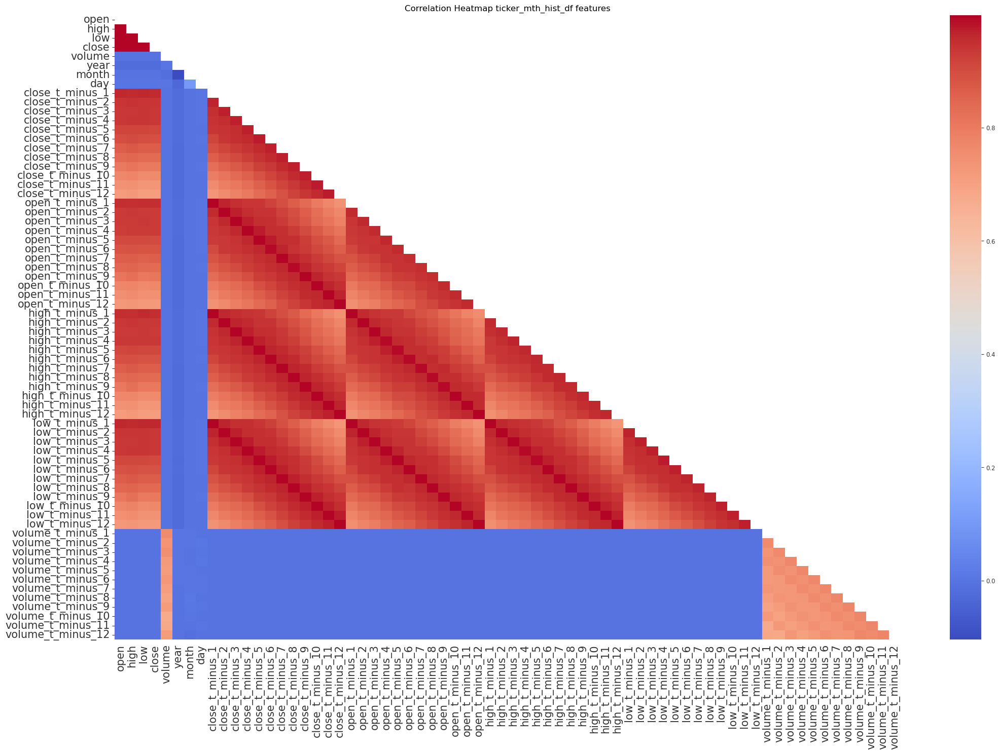

In [34]:
# Select only the numeric columns for calculating correlations
numeric_columns = ticker_mth_hist_df.select_dtypes(include=['float64', 'int64'])

# Return an array of zeros with the same shape and type as the correlation array
mask = np.zeros_like(numeric_columns.corr())

# Return indices of the upper triangle of the array and store value 1 in those arrays. The value 1 indices true mask
mask[np.triu_indices_from(mask)] = True

# Set figure size
plt.figure(figsize=(25, 16))

# Plot heatmap and show the respective corr value for each variable
heatmap = sns.heatmap(numeric_columns.corr(), annot=False, mask=mask, cmap='coolwarm', annot_kws={'size': 15})

# Add title for heatmap
heatmap.set_title("Correlation Heatmap ticker_mth_hist_df features")

# Increase font size of x and y labels
heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=15)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=15)

plt.show()

**Observations:**
- 'open', 'high', 'low', 'close' values of the same day are closely related with each other
- the closer is the time period away from the actual day (e.g. T-1 compared to T-12), the parameters of 'open', 'high', 'low', 'close' have greater correlationship with the 'open', 'high', 'low', 'close' values of T-0.

In [35]:
correlation_matrix_df (ticker_mth_hist_df)

,Correlation_Pair,Correlation_Value
1045,low_t_minus_3 - close_t_minus_3,0.99844
717,high_t_minus_7 - close_t_minus_7,0.99833
571,high_t_minus_3 - close_t_minus_3,0.99832
606,high_t_minus_4 - close_t_minus_4,0.99830
679,high_t_minus_6 - close_t_minus_6,0.99823
999,low_t_minus_2 - close_t_minus_2,0.99815
504,high_t_minus_1 - close_t_minus_1,0.99812
1461,low_t_minus_11 - open_t_minus_11,0.99811
537,high_t_minus_2 - close_t_minus_2,0.99810
1516,low_t_minus_12 - open_t_minus_12,0.99809


**Remarks:**
- The 'open', 'high', 'low' values of the actual day are the top 3 correlated parameters with the target 'close' value

## 4.3 Predict Stock Price

### 4.3.1 Try Linear Regression Model using TSLA

**Explore establishing Linear Regression as base model**

#### 4.3.1.1 Train_test_split Version 1

In [36]:
X, X_train, X_test, y_train, y_test = train_test_split_for_model(ticker_mth_hist_df,'TSLA','close',0.3)

In [37]:
X_train_scaled, X_test_scaled = standardise_features(ticker_mth_hist_df,'TSLA', X_train, X_test)

#### 4.3.1.2 Modelling Version 1

In [38]:
y_pred_train, y_pred_test, rmse_train_lr, rmse_test_lr, lr_score_train, lr_score_test, y_pred_test_df, lr_intercept, lr_coeff = linear_model (X_test, X_train_scaled, X_test_scaled, y_train, y_test)

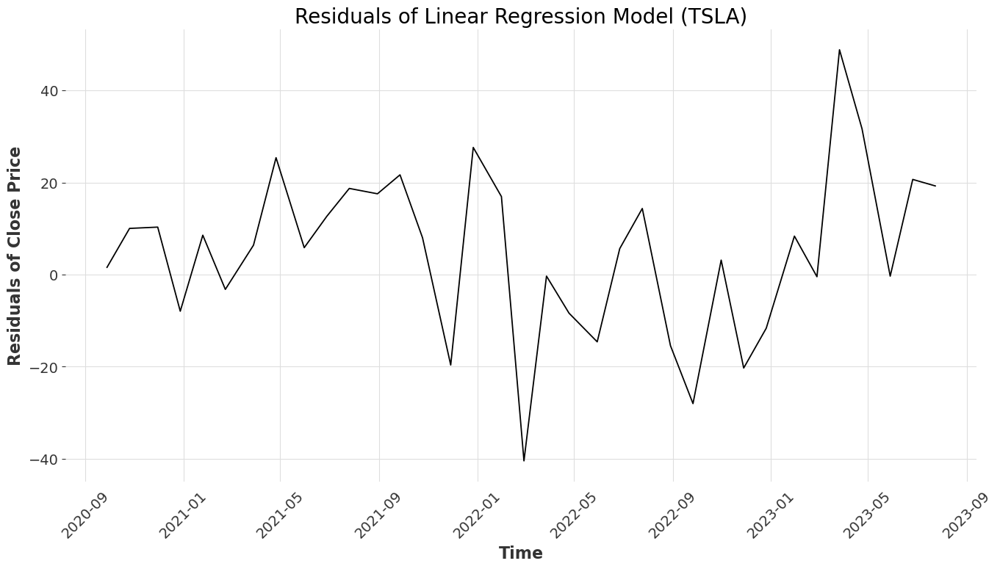

In [39]:
residuals = y_test - y_pred_test

plt.figure(figsize=(16,8))

# Plot the residuals
plt.plot(residuals)
plt.xlabel('Time', fontsize = 16)
plt.ylabel('Residuals of Close Price', fontsize = 16)
plt.title('Residuals of Linear Regression Model (TSLA)', fontsize = 20)
plt.yticks(fontsize = 14)
plt.xticks(rotation=45, fontsize = 14)
plt.show()

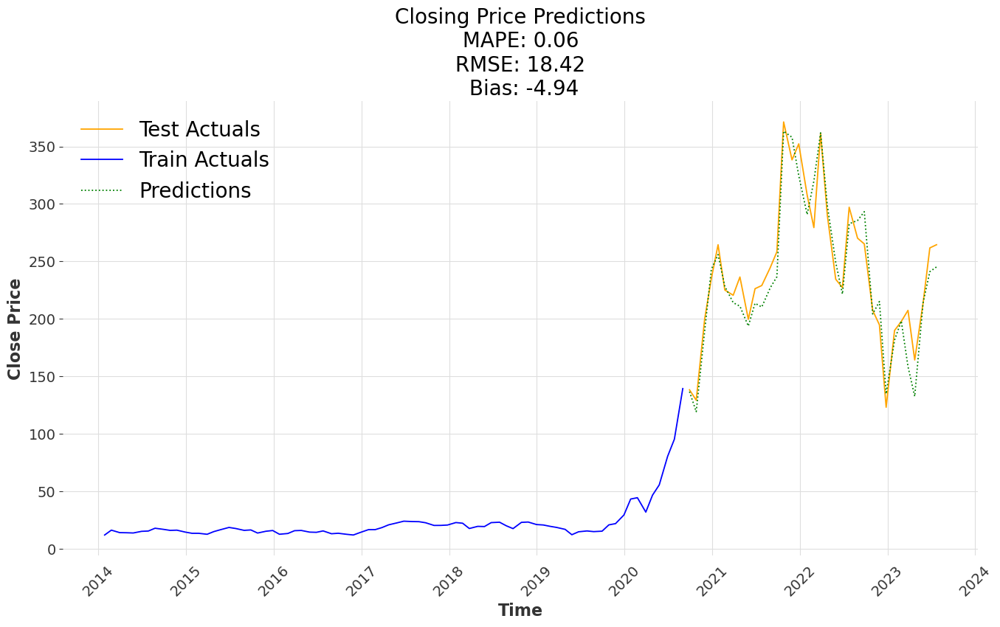

In [40]:
plt.figure(figsize=(16,8))

# Plot the actuals and predictions of model
plt.plot(y_test, label='Test Actuals', color='orange')
plt.plot(y_train, label='Train Actuals', color='blue')
plt.plot(y_pred_test_df['predicted_close'], label='Predictions', color='green', linestyle='dotted')
plt.xlabel('Time', fontsize = 16)
plt.ylabel('Close Price', fontsize = 16)
plt.title('Actuals and Predictions from Linear Regression Model', fontsize = 20)
plt.yticks(fontsize = 14)
plt.xticks(rotation=45, fontsize = 14)

# Find the MAPE (mean abs percentage error) of the predictions
mape = mean_absolute_percentage_error(y_test, y_pred_test) # like all sklearn metrics we've used, pass y_actual, y_pred

# Find the RMSE of the predictions
rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))

# Calculate the bias
bias = (y_pred_test_df['predicted_close'] - y_test.values).mean()

plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)
plt.legend(fontsize = 20, loc = 'upper left'); # for legend to be displayed in our plot
plt.show()

**Observations:**
- Accuracy is high as actual day features are the key features affecting the predictions
- This linear regression model is not practical for prediction of stock price as we would not know the target day's 'high', 'open', 'close' etc ahead of time. Let's remove parameters that are lesser than t_minus_6 in the model and 'high', 'open', 'low' to forecast 6 months ahead.

#### 4.3.1.3 Train_test_split Version 2

In [41]:
# Exclude parameters that are lesser than t_minus_6 (i.e. drop t_minus_1, t_minus_2 until t_minus_5)
X = ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='TSLA'].drop(columns = ['close','symbol','currency','high','open','low','year','month','day','date'])

columns_to_remove = [col for col in X.columns if re.search(r't_minus_(?!1[0-2]$)[1-5]|t_minus_1$', col)]
X.drop(columns=columns_to_remove + ['close', 'symbol', 'currency'], inplace=True, errors='ignore')

y = ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='TSLA']['close']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, shuffle=False)

In [42]:
X_train_scaled, X_test_scaled = standardise_features(ticker_mth_hist_df, 'TSLA', X_train, X_test)

#### 4.3.1.4 Modelling Version 2

In [43]:
y_pred_train, y_pred_test, rmse_train_lr, rmse_test_lr, lr_score_train, lr_score_test, y_pred_test_df, lr_intercept, lr_coeff = linear_model (X_test, X_train_scaled, X_test_scaled, y_train, y_test)

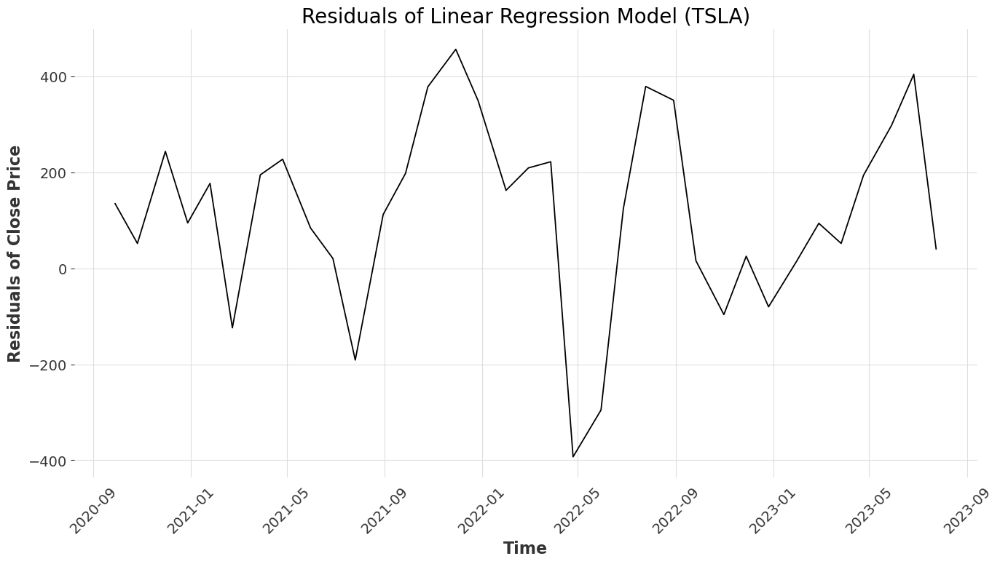

In [44]:
residuals = y_test - y_pred_test

plt.figure(figsize=(16,8))

# Plot the residuals
plt.plot(residuals)
plt.xlabel('Time', fontsize = 16)
plt.ylabel('Residuals of Close Price', fontsize = 16)
plt.title('Residuals of Linear Regression Model (TSLA)', fontsize = 20)
plt.yticks(fontsize = 14)
plt.xticks(rotation=45, fontsize = 14)
plt.show()

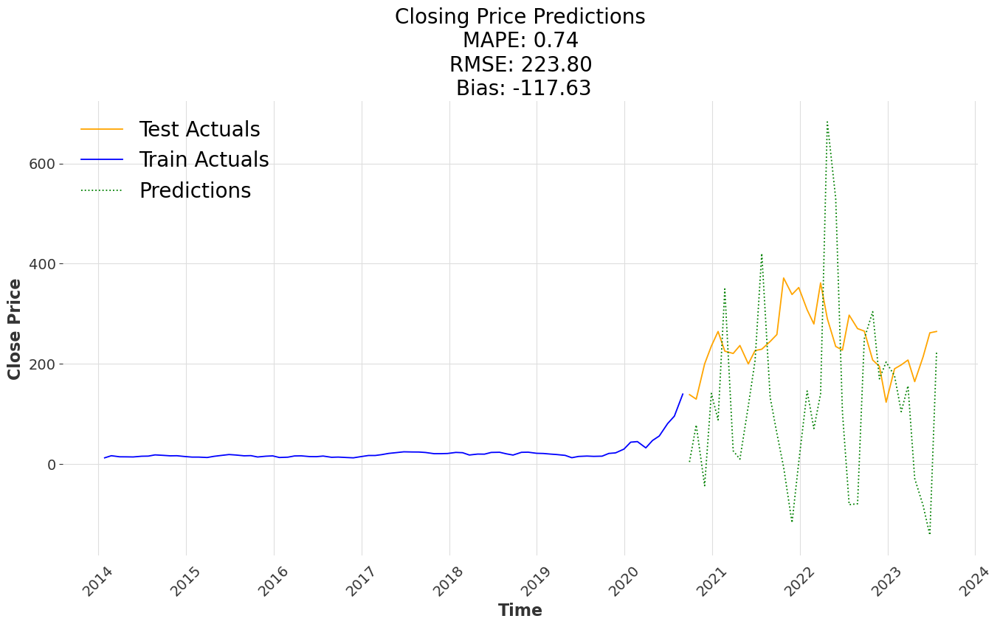

In [45]:
plt.figure(figsize=(16,8))

# Plot the actuals and predictions of model
plt.plot(y_test, label='Test Actuals', color='orange')
plt.plot(y_train, label='Train Actuals', color='blue')
plt.plot(y_pred_test_df['predicted_close'], label='Predictions', color='green', linestyle='dotted')
plt.xlabel('Time', fontsize = 16)
plt.ylabel('Close Price', fontsize = 16)
plt.title('Actuals and Predictions from Linear Regression Model', fontsize = 20)
plt.yticks(fontsize = 14)
plt.xticks(rotation=45, fontsize = 14)

# Find the MAPE (mean abs percentage error) of the predictions
mape = mean_absolute_percentage_error(y_test, y_pred_test) # like all sklearn metrics we've used, pass y_actual, y_pred

# Find the RMSE of the predictions
rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))

# Calculate the bias
bias = (y_pred_test_df['predicted_close'] - y_test.values).mean()

plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)
plt.legend(fontsize = 20, loc = 'upper left'); # for legend to be displayed in our plot
plt.show()

**Observations:**
- Predictions can go below $0 which cannot be possible in reality
- Accuracy is very low now (huge deviation of actuals versus predictions)
- Conclude that linear regression model is not practical. Will explore Time Series next.

|Model No.| Model Tried                                    	 |MAPE   |RMSE    |Bias   |Remarks           |
|---------|--------------------------------------------------|-------|--------|-------|------------------|
|1        | Linear Regression                                |0.74   |223.8   |-117.63|Predictions of close price can go below $0. Model is not practical    |

### 4.3.2 Try Time Series Model (excluding X_train) using TSLA

**Explore establishing Time Series as base model**

ARIMA(p,d,q)(P,D,Q)[s]:

ARIMA(p,d,q):

- p (Autoregressive Order): The autoregressive (AR) order, denoted as "p," represents the number of lagged values of the dependent variable (time series) that are used as predictors for the current value. In this case, p is 0, indicating that there is no autoregressive component in the ARIMA model.

- d (Differencing Order): The differencing order, denoted as "d," represents the number of times the time series needs to be differenced to make it stationary. In this case, d is 0, indicating that the time series is not differenced.

- q (Moving Average Order): The moving average (MA) order, denoted as "q," represents the number of lagged forecast errors that are used as predictors for the current value. In this case, q is 0, indicating that there is no moving average component in the ARIMA model.

(P,D,Q)[s]:

- P (Seasonal Autoregressive Order): The seasonal autoregressive (SAR) order, denoted as "P," represents the number of lagged values at seasonal intervals that are used as predictors for the current value. In this case, P is 2, indicating that the model uses the two previous values at the seasonal interval as predictors.

- D (Seasonal Differencing Order): The seasonal differencing order, denoted as "D," represents the number of times the time series needs to be differenced at the seasonal interval to make it stationary. In this case, D is 1, indicating that the time series has been differenced once at the seasonal interval.

- Q (Seasonal Moving Average Order): The seasonal moving average (SMA) order, denoted as "Q," represents the number of lagged forecast errors at seasonal intervals that are used as predictors for the current value. In this case, Q is 2, indicating that the model uses the two previous forecast errors at the seasonal interval as predictors.

- [s]: The seasonal period, denoted as "s," indicates the length of the seasonal pattern in the data. In this case, s is 3, indicating a seasonal pattern with a period of 3 time steps.

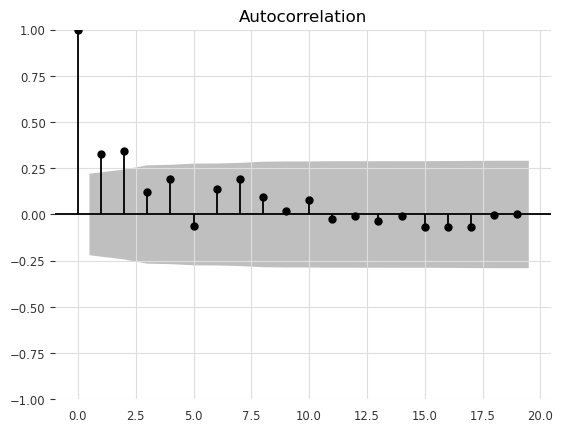

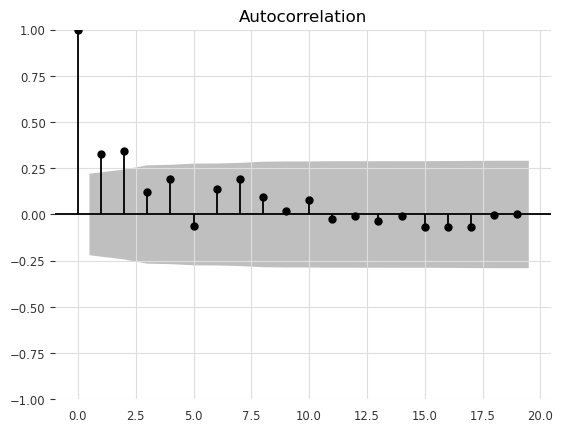

In [46]:
# Generate autocorrelation plot on training data.
# Before running ACF, we need to make the time series "stationary", thus diff()
# diff() will cause 1st row to become NaN, thus dropna() to eliminate that null datapoint before running our analysis
# You can clearly see the peak autocorrelation on every multiple of 3!
plot_acf(y_train.diff().dropna())

**Observations:**
- Every data point's (response variable at a given time stamp) correlation between itself and all previous data points (lags) are checked
- 1st correlation coefficient is `1` signifies the data point's correlation with itself (similar to df.corr(), this is a perfect correlation when some data is compared with itself)
- The points outside the shaded area _(95% confidence interval)_ are considered statistically significant, while those that are within are not
- The points are correlation coefficients of different lags in our data
  - if we took any random data point (response variable at a given time stamp) , and correlated it to a data point `1 step` (or) just before it, the correlation coefficient is approx. `+0.3`
  - if we took any random data point, and correlated it to a data point `2 steps` before it, the correlation coefficient is approx`+0.3`
  - if we took any random data point, and correlated it to a data point `3 steps` before it, the correlation coefficient spikes up to `+0.1`
  - No observable spiking effect --> no indication of seasonality --> seasonality parameter, `S` should be 0

In [47]:
# Augmented Dickey-Fuller test on our original monthly data as that was ambiguous to confirm stationarity
adf_test = ADFTest(alpha = 0.05) # instantiate ADF test with setting the threshold for p-value to accept/reject null hypothesis

# ADF test run using this function to tell should the df.diff() be called or not on the data passed
adf_test.should_diff(ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='TSLA']['close']) 

(0.5965612399424319, True)

**Observations:**

- We NEED to df.diff() on monthly data, $p$-value is `0.59` --> we accept the null hypothesis based on this statistical proof and confirm that our data is not `stationary`.

In [48]:
arima_model = pm.AutoARIMA(start_p=0, max_p=20, 
                           start_d=0, max_d=20,    # find optimum value of d automatically
                           start_q=0, max_q=20,
                           # the commented parameters below will be used in the next lesson (advanced time series)
                           # start_P=0, max_P=10,
                           # D=None,
                           # start_Q=0, max_Q=10,
                           # m=12, # For monthly data since the pattern repeats every 12 months
                           # seasonal=True,
                           trace=True, # Print values in console for each fit in the grid search
                           random=True, # to not perform an exhaustive search & set an internal stop (refer doc)
                           random_state=20, # repeatability of steps in the same order
                           n_fits=50 # max no. of ARIMA models fits, the algorithm MUST stop at the end of 50 fits
                          )

arima_model.fit(y_train) # only fit y_train

Performing stepwise search to minimize aic
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=571.999, Time=0.17 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=523.848, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=507.292, Time=0.08 sec
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=488.725, Time=0.09 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=490.091, Time=0.12 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=488.087, Time=0.13 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=486.655, Time=0.06 sec
 ARIMA(0,3,3)(0,0,0)[0]             : AIC=488.348, Time=0.13 sec
 ARIMA(1,3,3)(0,0,0)[0]             : AIC=483.983, Time=0.18 sec
 ARIMA(2,3,3)(0,0,0)[0]             : AIC=inf, Time=0.43 sec
 ARIMA(1,3,4)(0,0,0)[0]             : AIC=inf, Time=0.47 sec
 ARIMA(0,3,4)(0,0,0)[0]             : AIC=inf, Time=0.43 sec
 ARIMA(2,3,2)(0,0,0)[0]             : AIC=inf, Time=0.38 sec
 ARIMA(2,3,4)(0,0,0)[0]             : AIC=inf, Time=0.55 sec
 ARIMA(1,3,3)(0,0,0)[0] intercept   : AIC=484.509, Time=0.27 sec

B

AutoARIMA(max_d=20, max_p=20, max_q=20, n_fits=50, random=True, random_state=20,
          start_p=0, start_q=0, trace=True)

**Observations:**
- Based on ARIMA documentation, optimization happens based on `information_criterion`, defaults to [AIC](https://towardsdatascience.com/introduction-to-aic-akaike-information-criterion-9c9ba1c96ced) (AIC is used to compare different possible models and determine which one is the best fit for the data)
- `start_p`/`start_d`/`start_q` of 0 simply means starting with no `AR`/`MA` components
- Based on all combinations checked, $ARIMA(1,3,3)$, $p=1$, $d=3$ & $q=3$ was the most optimal
- $p=1$ indicates that the model uses the value from the previous time step as a predictor.
- $d=3$ was reflective from our ADF test, df.diff() is indeed required and that the data is not stationary. It needs to be differenced 3 times to be stationary. A high "d" value like 3 suggests that the original time series had strong seasonality or trends that needed to be removed.
- $q=3$ uses the residuals from the three previous time steps as predictors. This means that the model considers the impact of past forecast errors on the present value.

In [49]:
# we can also print out summary results
arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   80
Model:               SARIMAX(1, 3, 3)   Log Likelihood                -236.991
Date:                Tue, 22 Aug 2023   AIC                            483.983
Time:                        22:06:58   BIC                            495.702
Sample:                    01-27-2014   HQIC                           488.670
                         - 08-24-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9775      0.114     -8.547      0.000      -1.202      -0.753
ma.L1         -0.6183      0.168     -3.675      0.000      -0.948      -0.289
ma.L2         -0.6656      0.227     -2.938      0.003      -1.110      -0.222
ma.L3          0.4465      0.137      3.259      0.001       0.178       0.715
sigma2        26.1770      2.846      9.196      0.000      20.598      31.756
===================================================================================
Ljung-Box (L1) (Q):                   0.07   Jarque-Bera (JB):               151.59
Prob(Q):                              0.79   Prob(JB):                         0.00
Heteroskedasticity (H):              13.56   Skew:                             0.28
Prob(H) (two-sided):                  0.00   Kurtosis:                         9.85
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [50]:
# Generate len(y_test) number of predictions 
y_pred = arima_model.predict(n_periods = len(y_test)) # we want as many future predictions as there are in y_test
y_pred

2020-09-28     166.485845
2020-10-26     208.614851
2020-11-23     243.763760
2020-12-28     293.499859
2021-01-25     336.740587
2021-02-22     394.094674
2021-03-22     445.416571
2021-04-26     510.399055
2021-05-24     569.791946
2021-06-28     642.412774
2021-07-26     709.866935
2021-08-23     790.135613
2021-09-27     865.641752
2021-10-25     953.567362
2021-11-22    1037.116601
2021-12-27    1132.707823
2022-01-24    1224.291677
2022-02-28    1327.556805
2022-03-28    1427.167167
2022-04-25    1538.114125
2022-05-23    1645.743248
2022-06-27    1764.379609
2022-07-25    1880.020092
2022-08-22    2006.353091
2022-09-26    2129.997860
2022-10-24    2264.034412
2022-11-28    2395.676708
2022-12-26    2537.423420
2023-01-23    2677.056784
2023-02-27    2826.519969
2023-03-27    2974.138231
2023-04-24    3131.323922
2023-05-22    3286.921183
2023-06-26    3451.835146
2023-07-24    3615.405771
Freq: WOM-4MON, dtype: float64

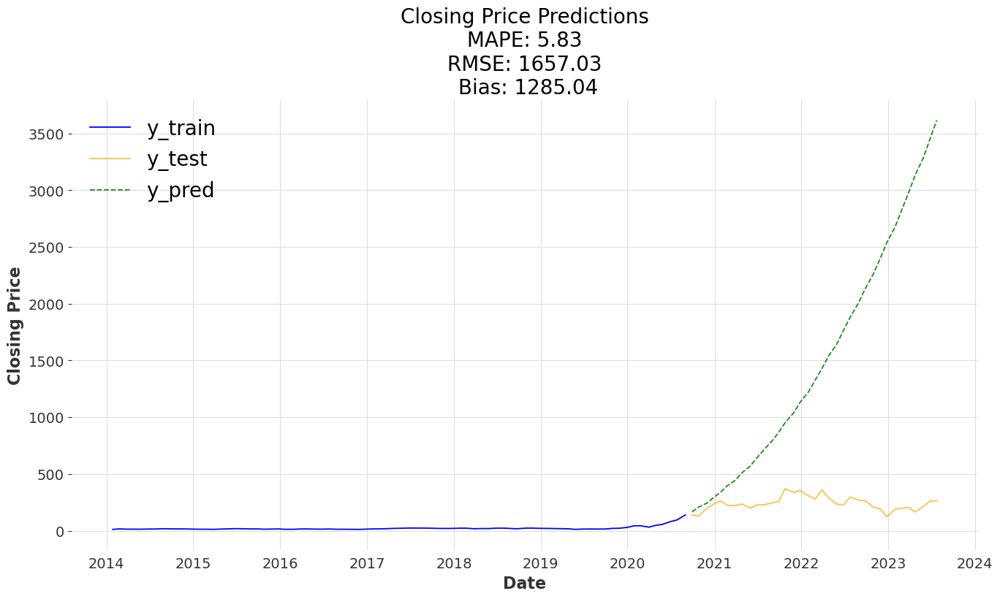

In [51]:
# Plot predictions to compare vs y_test.
plt.figure(figsize=(16,8))

# Plot training data. don't need to explicitly pass x-axis for chart, taken as the date index by matplotlib
plt.plot(y_train, color='blue', label='y_train')

# Plot testing data. don't need to explicitly pass x-axis for chart, taken as the date index by matplotlib.
# This alpha adjust transparency of the line.
plt.plot(y_test, color='orange', label='y_test', alpha = 0.7)

# Plot predicted test values. no index in y_pred as shown above, need to explicitly pass to compare for same timeframe as y_test
plt.plot(y_test.index, y_pred, color='green', label='y_pred', alpha = 0.9, ls = '--')

# Find the MAPE (mean abs percentage error) of the predictions
mape = mean_absolute_percentage_error(y_test, y_pred) # like all sklearn metrics we've used, pass y_actual, y_pred

# Find the RMSE of the predictions
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# Plot labels
plt.xlabel('Date', fontsize=16)
plt.ylabel('Closing Price', fontsize=16)

# Adjust the tick label size on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14) 

# Calculate the bias
bias = (y_pred.values - y_test.values).mean()

plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)

plt.legend(fontsize = 20, loc = 'upper left');

**Observations:**
- Training data is in blue, testing is in orange (behind), while model predictions are in green.
- Test data only starts _where_ train ends, this is achieved based on the parameter `shuffle = False` during train-test split.
- The predicted model has very poor results, with huge deviation from the actual test data, even with the best parameters for p, d, q. MAPE is 5.83.

|Model No.| Model Tried                                    	 |MAPE   |RMSE    |Bias   |Remarks           |
|---------|--------------------------------------------------|-------|--------|-------|------------------|
|1        | Linear Regression                                |0.74   |223.8   |-117.63|Predictions of close price can go below $0. Model is not practical    |
|2        | ARIMA                                            |5.83   |1657.03 |1285.04|p=1, d=3, q=3     |

### 4.3.3 Try Time Series Model with exogenous features using TSLA

In [52]:
arima_model = pm.AutoARIMA(start_p=0, max_p=20, 
                           start_d=0, max_d=20,    # find optimum value of d automatically
                           start_q=0, max_q=20,
                           # the commented parameters below will be used in the next lesson (advanced time series)
                           # start_P=0, max_P=10,
                           # D=None,
                           # start_Q=0, max_Q=10,
                           # m=12, # For monthly data since the pattern repeats every 12 months
                           seasonal=False,
                           trace=True, # Print values in console for each fit in the grid search
                           random=True, # to not perform an exhaustive search & set an internal stop (refer doc)
                           random_state=20, # repeatability of steps in the same order
                           n_fits=50 # max no. of ARIMA models fits, the algorithm MUST stop at the end of 50 fits
                          )

arima_model.fit(y_train, X_train) # fit y_train and X_train

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=884.604, Time=0.59 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=587.829, Time=0.65 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=593.971, Time=0.76 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=589.204, Time=0.77 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=589.293, Time=0.81 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=591.246, Time=0.84 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=589.843, Time=0.64 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 5.074 seconds


AutoARIMA(max_d=20, max_p=20, max_q=20, n_fits=50, random=True, random_state=20,
          seasonal=False, start_p=0, start_q=0, trace=True)

**Observations:**
- Based on ARIMA documentation, optimization happens based on `information_criterion`, defaults to [AIC](https://towardsdatascience.com/introduction-to-aic-akaike-information-criterion-9c9ba1c96ced) (AIC is used to compare different possible models and determine which one is the best fit for the data)
- `start_p`/`start_d`/`start_q` of 0 simply means starting with no `AR`/`MA` components
- Based on all combinations checked, $ARIMA(1,0,0)$, $p=1$, $d=0$ & $q=0$ was the most optimal
- $p=1$ indicates that the model uses the value from the previous time step as a predictor.
- $d=0$ indicates the data is stationary. It needs not be differenced to be stationary
- $q=0$ indicates the residuals from previous time steps are not used as predictors. This means that the model does not consider the impact of past forecast errors on the present value.

In [53]:
# we can also print out summary results
arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   80
Model:               SARIMAX(1, 0, 0)   Log Likelihood                -255.915
Date:                Tue, 22 Aug 2023   AIC                            587.829
Time:                        22:07:04   BIC                            678.346
Sample:                    01-27-2014   HQIC                           624.120
                         - 08-24-2020                                         
Covariance Type:                  opg                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
volume             1.316e-08   2.23e-09      5.899      0.000    8.79e-09    1.75e-08
close_t_minus_6       0.1464   2.12e-17   6.89e+15      0.000       0.146       0.146
close_t_minus_7       2.7137   2.25e-17   1.21e+17      0.000       2.714       2.714
close_t_minus_8      -0.0065   1.86e-17  -3.49e+14      0.000      -0.007      -0.007
close_t_minus_9       0.7259   2.49e-17   2.91e+16      0.000       0.726       0.726
close_t_minus_10     -1.4375    2.7e-17  -5.32e+16      0.000      -1.437      -1.437
close_t_minus_11      2.0450   2.84e-17    7.2e+16      0.000       2.045       2.045
close_t_minus_12     -0.5266   2.47e-17  -2.13e+16      0.000      -0.527      -0.527
open_t_minus_6       -0.3807   2.09e-17  -1.82e+16      0.000      -0.381      -0.381
open_t_minus_7        4.4410   2.33e-17   1.91e+17      0.000       4.441       4.441
open_t_minus_8        1.9682   1.95e-17   1.01e+17      0.000       1.968       1.968
open_t_minus_9       -1.7017   3.19e-17  -5.34e+16      0.000      -1.702      -1.702
open_t_minus_10      -3.4446   2.21e-17  -1.56e+17      0.000      -3.445      -3.445
open_t_minus_11       0.9532   2.71e-17   3.52e+16      0.000       0.953       0.953
open_t_minus_12       1.6656   2.34e-17   7.12e+16      0.000       1.666       1.666
high_t_minus_6        8.2713   1.89e-17   4.37e+17      0.000       8.271       8.271
high_t_minus_7       -5.9383   2.16e-17  -2.75e+17      0.000      -5.938      -5.938
high_t_minus_8       -3.9073   2.21e-17  -1.77e+17      0.000      -3.907      -3.907
high_t_minus_9       -3.2777   2.91e-17  -1.13e+17      0.000      -3.278      -3.278
high_t_minus_10       1.2878   2.79e-17   4.62e+16      0.000       1.288       1.288
high_t_minus_11      -1.2606   2.91e-17  -4.33e+16      0.000      -1.261      -1.261
high_t_minus_12      -2.2784   2.91e-17  -7.83e+16      0.000      -2.278      -2.278
low_t_minus_6        -5.8368   2.25e-17  -2.59e+17      0.000      -5.837      -5.837
low_t_minus_7        -2.2340   2.39e-17  -9.37e+16      0.000      -2.234      -2.234
low_t_minus_8         1.5444   1.64e-17   9.41e+16      0.000       1.544       1.544
low_t_minus_9         3.5887   2.76e-17    1.3e+17      0.000       3.589       3.589
low_t_minus_10        3.2161   2.24e-17   1.43e+17      0.000       3.216       3.216
low_t_minus_11       -1.0759   2.94e-17  -3.66e+16      0.000      -1.076      -1.076
low_t_minus_12        1.6625   1.87e-17   8.87e+16      0.000       1.663       1.663
volume_t_minus_6   -2.01e-08   2.82e-09     -7.124      0.000   -2.56e-08   -1.46e-08
volume_t_minus_7   7.629e-09      3e-09      2.543      0.011    1.75e-09    1.35e-08
volume_t_minus_8   8.716e-09   2.88e-09      3.027      0.002    3.07e-09    1.44e-08
volume_t_minus_9   7.623e-09   3.45e-09      2.211      0.027    8.65e-10    1.44e-08
volume_t_minus_10 -1.871e-09   3.38e-09     -0.554      0.580   -8.49e-09    4.75e-09
volume_t_minus_11 -1.202e-09   3.62e-09     -0.332      0.7

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['start_d']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


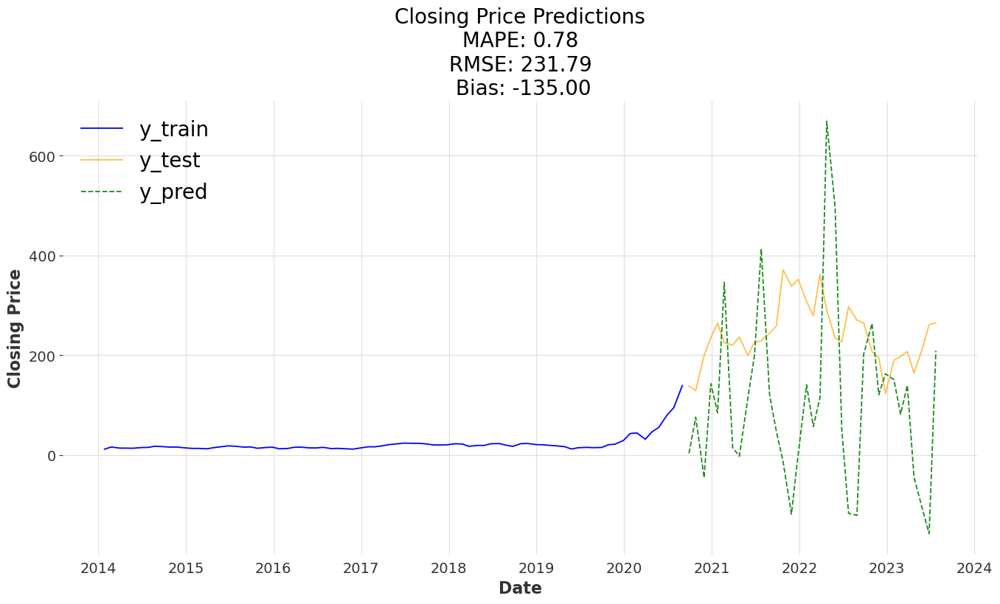

In [54]:
# Generate len(y_test) number of predictions
y_pred = arima_model.predict(n_periods = len(y_test), X=X_test) # we want as many future data point predictions as there are in y_test

# Plot data.
plt.figure(figsize=(16,8))

# Plot training data. don't need to explicitly pass x-axis for chart, taken as the date index by matplotlib
plt.plot(y_train, color='blue', label='y_train')

# Plot testing data. don't need to explicitly pass x-axis for chart, taken as the date index by matplotlib
plt.plot(y_test, color='orange', label='y_test', alpha = 0.7)

# Plot predicted test values. as shared previously, there are no index in y_pred 
# so, we need to explicitly pass the `x-axis` (dates) to compare for same timeframe as y_test and access y_pred vs actual y_test
# we can use y_test.index to get the index of y_test as confirmed earlier in y_test.head()
plt.plot(y_test.index, y_pred, color='green', label='y_pred', alpha = 0.9, ls = '--')
    
# Find the MAPE (mean abs percentage error) of the predictions
mape = mean_absolute_percentage_error(y_test, y_pred) # like all sklearn metrics we've used, pass y_actual, y_pred

# Find the RMSE of the predictions
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# Calculate the bias
bias = (y_pred.values - y_test.values).mean()

# Plot labels
plt.xlabel('Date', fontsize=16)
plt.ylabel('Closing Price', fontsize=16)

# Adjust the tick label size on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14) 

plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)

plt.legend(fontsize = 20, loc = 'upper left'); # for legend to be displayed in our plot

**Observations:**
- Training data is in blue, testing is in orange (behind), while model predictions are in green.
- Test data only starts _where_ train ends, this is achieved based on the parameter `shuffle = False` during train-test split.
- The predicted model has very poor results, with huge deviation from the actual test data, even with the best parameters for p, d, q.
- But the results are better than the previous, MAPE is 0.78.

|Model No.| Model Tried                                    	 |MAPE   |RMSE    |Bias   |Remarks           |
|---------|--------------------------------------------------|-------|--------|-------|------------------|
|1        | Linear Regression                                |0.74   |223.8   |-117.63|Predictions of close price can go below $0. Model is not practical    |
|2        | ARIMA                                            |5.83   |1657.03 |1285.04|p=1, d=3, q=3     |
|3        | ARIMAX (with exogenous features)                 |0.78   |231.79  |-135   |p=1, d=0, q=0     |

### 4.3.4 Try Time Series Model with exogenous features and seasonality using TSLA

In [55]:
arima_model = pm.AutoARIMA(start_p=0, max_p=20, 
                           start_d=0, max_d=20,    # find optimum value of d automatically
                           start_q=0, max_q=20,
                           
                           start_P=0, max_P=10,
                           start_D=0, max_D=10,
                           start_Q=0, max_Q=10,
                           # m=12, # For monthly data since the pattern repeats every 12 months
                           seasonal=True,
                           trace=True, # Print values in console for each fit in the grid search
                           random=True, # to not perform an exhaustive search & set an internal stop (refer doc)
                           random_state=20, # repeatability of steps in the same order
                           n_fits=50 # max no. of ARIMA models fits, the algorithm MUST stop at the end of 50 fits
                          )

arima_model.fit(y_train, X_train) # only fit on the one column that we have, y_train

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=615.036, Time=0.64 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=589.843, Time=0.70 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=595.975, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=884.604, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=591.223, Time=0.82 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=591.314, Time=0.85 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=593.272, Time=0.87 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=587.829, Time=0.59 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=589.204, Time=0.80 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=589.293, Time=0.82 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=593.971, Time=0.75 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=591.246, Time=0.82 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 9.011 seconds


AutoARIMA(max_D=10, max_P=10, max_Q=10, max_d=20, max_p=20, max_q=20, n_fits=50,
          random=True, random_state=20, start_P=0, start_Q=0, start_p=0,
          start_q=0, trace=True)

**Observations:**
- Similar results as #4.5 -> ARIMA(1,0,0)
- There is no seaonality trend

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['start_d', 'start_D']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


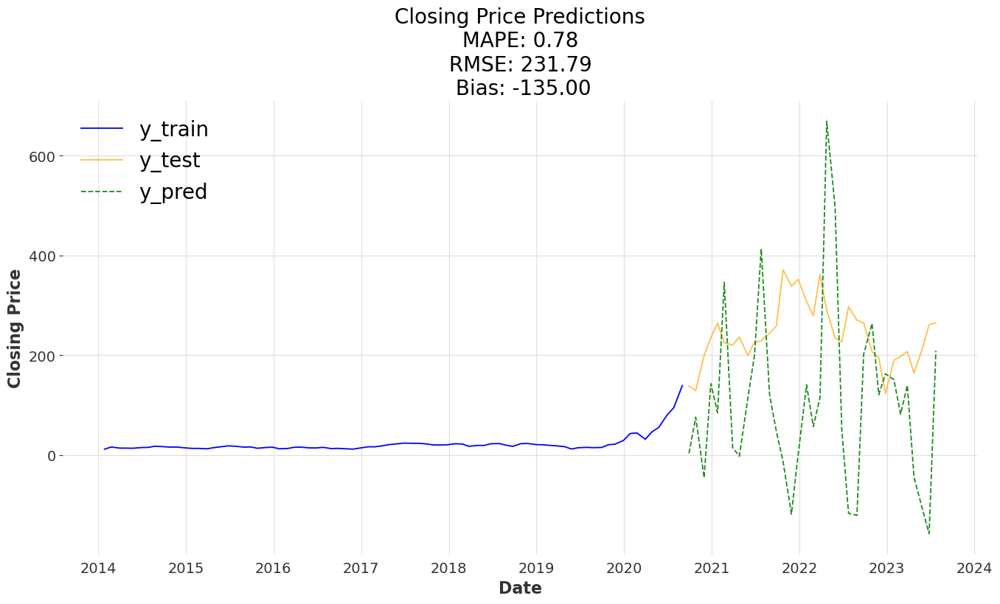

In [56]:
# Generate len(y_test) number of predictions
y_pred = arima_model.predict(n_periods = len(y_test), X=X_test) # we want as many future data point predictions as there are in y_test

# Plot data.
plt.figure(figsize=(16,8))

# Plot training data. don't need to explicitly pass x-axis for chart, taken as the date index by matplotlib
plt.plot(y_train, color='blue', label='y_train')

# Plot testing data. don't need to explicitly pass x-axis for chart, taken as the date index by matplotlib
plt.plot(y_test, color='orange', label='y_test', alpha = 0.7)

# Plot predicted test values. as shared previously, there are no index in y_pred 
# so, we need to explicitly pass the `x-axis` (dates) to compare for same timeframe as y_test and access y_pred vs actual y_test
# we can use y_test.index to get the index of y_test as confirmed earlier in y_test.head()
plt.plot(y_test.index, y_pred, color='green', label='y_pred', alpha = 0.9, ls = '--')
    
# Find the MAPE (mean abs percentage error) of the predictions
mape = mean_absolute_percentage_error(y_test, y_pred) # like all sklearn metrics we've used, pass y_actual, y_pred

# Find the RMSE of the predictions
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# Calculate the bias
bias = (y_pred.values - y_test.values).mean()

# Plot labels
plt.xlabel('Date', fontsize=16)
plt.ylabel('Closing Price', fontsize=16)

# Adjust the tick label size on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14) 

plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)
plt.legend(fontsize = 20, loc = 'upper left'); # for legend to be displayed in our plot

|Model No.| Model Tried                                    	 |MAPE   |RMSE    |Bias   |Remarks           |
|---------|--------------------------------------------------|-------|--------|-------|------------------|
|1        | Linear Regression                                |0.74   |223.8   |-117.63|Predictions of close price can go below $0. Model is not practical    |
|2        | ARIMA                                            |5.83   |1657.03 |1285.04|p=1, d=3, q=3     |
|3        | ARIMAX (with exogenous features)                 |0.78   |231.79  |-135   |p=1, d=0, q=0     |
|4        | SARIMAX (with exogenous features & seasonality)  |0.78   |231.79  |-135   |p=1, d=0, q=0     |

### 4.3.5 Try Simple Exponential Smoothing using TSLA

In [57]:
# Exclude parameters that are lesser than t_minus_6 (i.e. drop t_minus_1, t_minus_2 until t_minus_5)
ticker_mth_hist_df_v2 = ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='TSLA'].drop(columns = ['symbol','currency','high','open','low'])

columns_to_remove = [col for col in ticker_mth_hist_df_v2.columns if re.search(r't_minus_(?!1[0-2]$)[1-5]|t_minus_1$', col)]
ticker_mth_hist_df_v2.drop(columns=columns_to_remove + ['symbol', 'currency'], inplace=True, errors='ignore')

In [58]:
ticker_mth_hist_df_v2.index = ticker_mth_hist_df_v2.index.to_period('M').to_timestamp('M')
ticker_mth_hist_df_v2['date'] = ticker_mth_hist_df_v2.index

In [59]:
ticker_mth_hist_df_v2.columns

Index(['close', 'volume', 'date', 'year', 'month', 'day', 'close_t_minus_6',
       'close_t_minus_7', 'close_t_minus_8', 'close_t_minus_9',
       'close_t_minus_10', 'close_t_minus_11', 'close_t_minus_12',
       'open_t_minus_6', 'open_t_minus_7', 'open_t_minus_8', 'open_t_minus_9',
       'open_t_minus_10', 'open_t_minus_11', 'open_t_minus_12',
       'high_t_minus_6', 'high_t_minus_7', 'high_t_minus_8', 'high_t_minus_9',
       'high_t_minus_10', 'high_t_minus_11', 'high_t_minus_12',
       'low_t_minus_6', 'low_t_minus_7', 'low_t_minus_8', 'low_t_minus_9',
       'low_t_minus_10', 'low_t_minus_11', 'low_t_minus_12',
       'volume_t_minus_6', 'volume_t_minus_7', 'volume_t_minus_8',
       'volume_t_minus_9', 'volume_t_minus_10', 'volume_t_minus_11',
       'volume_t_minus_12'],
      dtype='object')

In [60]:
# Convert the DataFrame to a Darts TimeSeries with explicit frequency, training data to exclude most recent 3 years i.e. 36 months
time_series = TimeSeries.from_dataframe(ticker_mth_hist_df_v2[:-35], time_col= 'date', value_cols='close',freq = 'M')

# Create an ExponentialSmoothing model
model = ExponentialSmoothing()

# Fit the model to your time series data
model.fit(time_series)

# Perform forecasting for the next 36 months
y_pred = model.predict(n=36)

# Print the forecast
print(y_pred)

<TimeSeries (DataArray) (date: 36, component: 1, sample: 1)>
array([[[ 167.60944445]],

       [[ 202.20288123]],

       [[ 236.13648574]],

       [[ 270.36025628]],

       [[ 305.2013157 ]],

       [[ 337.69599405]],

       [[ 366.81080971]],

       [[ 400.81862448]],

       [[ 432.47514838]],

       [[ 468.02752807]],

...

       [[1038.38274533]],

       [[1072.60651587]],

       [[1107.44757529]],

       [[1139.94225364]],

       [[1169.0570693 ]],

       [[1203.06488407]],

       [[1234.72140797]],

       [[1270.27378766]],

       [[1302.69972205]],

       [[1337.99181023]]])
Coordinates:
  * date       (date) datetime64[ns] 2020-09-30 2020-10-31 ... 2023-08-31
  * component  (component) object 'close'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None


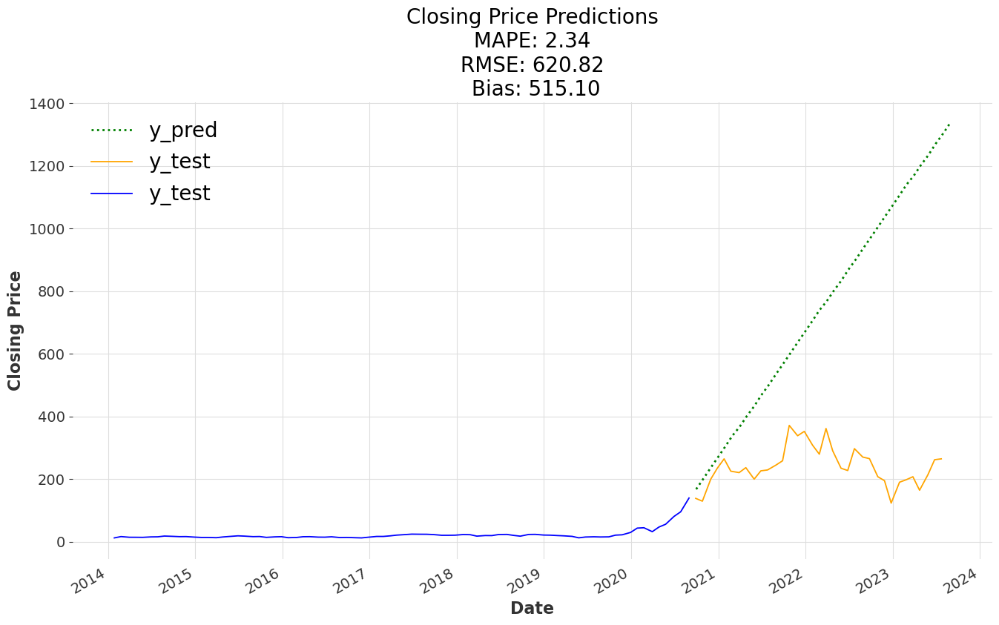

In [61]:
# Plot data.
plt.figure(figsize=(16,8))

y_pred.plot(label="y_pred", color = 'green', linestyle='dotted')
plt.plot(y_test, label = 'y_test', color ='orange')
plt.plot(y_train, label = 'y_test', color ='blue')
plt.legend()

# Find the MAPE (mean abs percentage error) of the predictions
mape = mean_absolute_percentage_error(ticker_mth_hist_df_v2[-36:]['close'].values, y_pred.values()) # like all sklearn metrics we've used, pass y_actual, y_pred

# Find the RMSE of the predictions
rmse = np.sqrt(mean_squared_error(ticker_mth_hist_df_v2[-36:]['close'].values, y_pred.values()))

# Calculate the bias
bias = (y_pred.values() - ticker_mth_hist_df_v2[-36:]['close'].values).mean()

# Plot labels
plt.xlabel('Date', fontsize=16)
plt.ylabel('Closing Price', fontsize=16)

# Adjust the tick label size on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14) 

plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)
plt.legend(fontsize = 20, loc = 'upper left'); # for legend to be displayed in our plot

**Observations:**
- Exponential smoothing gives very bad MAPE

|Model No.| Model Tried                                    	 |MAPE   |RMSE    |Bias   |Remarks           |
|---------|--------------------------------------------------|-------|--------|-------|------------------|
|1        | Linear Regression                                |0.74   |223.8   |-117.63|Predictions of close price can go below $0. Model is not practical    |
|2        | ARIMA                                            |5.83   |1657.03 |1285.04|p=1, d=3, q=3     |
|3        | ARIMAX (with exogenous features)                 |0.78   |231.79  |-135   |p=1, d=0, q=0     |
|4        | SARIMAX (with exogenous features & seasonality)  |0.78   |231.79  |-135   |p=1, d=0, q=0     |
|5        | Simple Exponential Smoothing                     |2.34   |620.82  |515.1  |Almost a linear prediction, not practical                  |

### 4.3.6 Try Prophet Linear Model using TSLA

In [62]:
ticker_mth_hist_df_v3 = ticker_mth_hist_df_v2

In [63]:
# Create a new DataFrame with 'ds' and 'y' columns
ticker_mth_hist_df_v3.rename(columns={'close':'y'},inplace=True)

# Copy index to 'ds' column
ticker_mth_hist_df_v3['ds'] = ticker_mth_hist_df_v2.index

In [64]:
train = ticker_mth_hist_df_v3[:-35]

In [65]:
train.tail()

,y,volume,date,year,month,day,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12,ds
datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-04-30,46.7500,1.696847e+09,2020-04-30,2020,4,27,20.89,15.43,15.04,15.62,14.90,12.34,17.00,21.84,16.20,14.24,15.14,14.88,12.75,15.72,22.72,16.40,15.50,16.45,15.15,13.00,17.11,20.65,14.95,14.10,15.07,14.49,12.27,15.43,7.897095e+08,6.233698e+08,423370104.0,614348872.0,504467664.0,609221784.0,1.181245e+09,2020-04-30
2020-05-31,55.6700,5.809135e+08,2020-05-31,2020,5,25,22.00,20.89,15.43,15.04,15.62,14.90,12.34,22.95,21.84,16.20,14.24,15.14,14.88,12.75,22.97,22.72,16.40,15.50,16.45,15.15,13.00,21.81,20.65,14.95,14.10,15.07,14.49,12.27,4.249668e+08,7.897095e+08,623369752.0,423370104.0,614348872.0,504467664.0,6.092218e+08,2020-05-31
2020-06-30,80.5800,8.478296e+08,2020-06-30,2020,6,29,29.53,22.00,20.89,15.43,15.04,15.62,14.90,28.59,22.95,21.84,16.20,14.24,15.14,14.88,30.27,22.97,22.72,16.40,15.50,16.45,15.15,26.81,21.81,20.65,14.95,14.10,15.07,14.49,7.537028e+08,4.249668e+08,789709496.0,623369752.0,423370104.0,614348872.0,5.044677e+08,2020-06-30
2020-07-31,95.3839,9.172860e+08,2020-07-31,2020,7,27,43.37,29.53,22.00,20.89,15.43,15.04,15.62,36.13,28.59,22.95,21.84,16.20,14.24,15.14,43.53,30.27,22.97,22.72,16.40,15.50,16.45,35.95,26.81,21.81,20.65,14.95,14.10,15.07,1.325074e+09,7.537028e+08,424966800.0,789709496.0,623369752.0,423370104.0,6.143489e+08,2020-07-31
2020-08-31,139.4399,1.507767e+09,2020-08-31,2020,8,31,44.53,43.37,29.53,22.00,20.89,15.43,15.04,55.93,36.13,28.59,22.95,21.84,16.20,14.24,57.57,43.53,30.27,22.97,22.72,16.40,15.50,40.77,35.95,26.81,21.81,20.65,14.95,14.10,1.432169e+09,1.325074e+09,753702816.0,424966800.0,789709496.0,623369752.0,4.233701e+08,2020-08-31


In [66]:
ticker_mth_hist_df_v3[-35:].head()

,y,volume,date,year,month,day,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12,ds
datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-30,138.36320,811134992.0,2020-09-30,2020,9,28,32.0000,44.53,43.37,29.53,22.00,20.89,15.43,34.02,55.93,36.13,28.59,22.95,21.84,16.20,36.20,57.57,43.53,30.27,22.97,22.72,16.40,29.76,40.77,35.95,26.81,21.81,20.65,14.95,1.283150e+09,1.432169e+09,1.325074e+09,7.537028e+08,4.249668e+08,7.897095e+08,6.233698e+08,2020-09-30
2020-10-31,129.34650,424861000.0,2020-10-31,2020,10,26,46.7500,32.00,44.53,43.37,29.53,22.00,20.89,49.17,34.02,55.93,36.13,28.59,22.95,21.84,57.99,36.20,57.57,43.53,30.27,22.97,22.72,45.54,29.76,40.77,35.95,26.81,21.81,20.65,1.696847e+09,1.283150e+09,1.432169e+09,1.325074e+09,7.537028e+08,4.249668e+08,7.897095e+08,2020-10-31
2020-11-30,199.67979,669345000.0,2020-11-30,2020,11,30,55.6700,46.75,32.00,44.53,43.37,29.53,22.00,55.63,49.17,34.02,55.93,36.13,28.59,22.95,55.67,57.99,36.20,57.57,43.53,30.27,22.97,52.33,45.54,29.76,40.77,35.95,26.81,21.81,5.809135e+08,1.696847e+09,1.283150e+09,1.432169e+09,1.325074e+09,7.537028e+08,4.249668e+08,2020-11-30
2020-12-31,235.22310,443057000.0,2020-12-31,2020,12,28,80.5800,55.67,46.75,32.00,44.53,43.37,29.53,64.60,55.63,49.17,34.02,55.93,36.13,28.59,81.87,55.67,57.99,36.20,57.57,43.53,30.27,63.23,52.33,45.54,29.76,40.77,35.95,26.81,8.478296e+08,5.809135e+08,1.696847e+09,1.283150e+09,1.432169e+09,1.325074e+09,7.537028e+08,2020-12-31
2021-01-31,264.50970,459023000.0,2021-01-31,2021,1,25,95.3839,80.58,55.67,46.75,32.00,44.53,43.37,95.67,64.60,55.63,49.17,34.02,55.93,36.13,104.31,81.87,55.67,57.99,36.20,57.57,43.53,94.20,63.23,52.33,45.54,29.76,40.77,35.95,9.172860e+08,8.478296e+08,5.809135e+08,1.696847e+09,1.283150e+09,1.432169e+09,1.325074e+09,2021-01-31


In [67]:
m = Prophet(growth = 'linear', #default value
           yearly_seasonality = 'auto', #default value
           weekly_seasonality = 'auto', #default value
           daily_seasonality = 'auto', #default value
           seasonality_prior_scale = 10, #higher value results in a stronger regularization, which dampens the amplitude of the seasonal patterns
           changepoint_prior_scale = 0.05) #default value
m.add_regressor('close_t_minus_6')
m.add_regressor('close_t_minus_7')
m.add_regressor('close_t_minus_8')
m.add_regressor('close_t_minus_9')
m.add_regressor('close_t_minus_10')
m.add_regressor('close_t_minus_11')
m.add_regressor('close_t_minus_12')

m.add_regressor('open_t_minus_6')
m.add_regressor('open_t_minus_7')
m.add_regressor('open_t_minus_8')
m.add_regressor('open_t_minus_9')
m.add_regressor('open_t_minus_10')
m.add_regressor('open_t_minus_11')
m.add_regressor('open_t_minus_12')

m.add_regressor('high_t_minus_6')
m.add_regressor('high_t_minus_7')
m.add_regressor('high_t_minus_8')
m.add_regressor('high_t_minus_9')
m.add_regressor('high_t_minus_10')
m.add_regressor('high_t_minus_11')
m.add_regressor('high_t_minus_12')

m.add_regressor('low_t_minus_6')
m.add_regressor('low_t_minus_7')
m.add_regressor('low_t_minus_8')
m.add_regressor('low_t_minus_9')
m.add_regressor('low_t_minus_10')
m.add_regressor('low_t_minus_11')
m.add_regressor('low_t_minus_12')

m.add_regressor('volume_t_minus_6')
m.add_regressor('volume_t_minus_7')
m.add_regressor('volume_t_minus_8')
m.add_regressor('volume_t_minus_9')
m.add_regressor('volume_t_minus_10')
m.add_regressor('volume_t_minus_11')
m.add_regressor('volume_t_minus_12')

m.fit(train)

22:07:18 - cmdstanpy - INFO - Chain [1] start processing
22:07:21 - cmdstanpy - INFO - Chain [1] done processing


In [68]:
# Create a DataFrame for future prediction dates
future = m.make_future_dataframe(periods=len(ticker_mth_hist_df_v3[-35:]), freq = '1M')

# Merge regressors (additional predictor variables)
# Select the last 35 rows from the 'ticker_mth_hist_df_v3' DataFrame
# Drop specific columns that are not needed ('y', 'volume', 'year', 'month', 'day')
# Perform an inner merge based on the 'ds' column
future = pd.merge(future, ticker_mth_hist_df_v3[-35:].drop(columns=['y','volume','year','month','day']),on='ds', how='inner')

# Set a saturating maximum so that the prediction will not go be more than 2 times the historical data
future['cap'] = (ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='TSLA']['close'].max())*2

# Set a saturating minimum so that the prediction will not go below $0
future['floor'] = 0

In [69]:
future.head()

,ds,date,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12,cap,floor
0,2020-09-30,2020-09-30,32.0000,44.53,43.37,29.53,22.00,20.89,15.43,34.02,55.93,36.13,28.59,22.95,21.84,16.20,36.20,57.57,43.53,30.27,22.97,22.72,16.40,29.76,40.77,35.95,26.81,21.81,20.65,14.95,1.283150e+09,1.432169e+09,1.325074e+09,7.537028e+08,4.249668e+08,7.897095e+08,6.233698e+08,742.66602,0
1,2020-10-31,2020-10-31,46.7500,32.00,44.53,43.37,29.53,22.00,20.89,49.17,34.02,55.93,36.13,28.59,22.95,21.84,57.99,36.20,57.57,43.53,30.27,22.97,22.72,45.54,29.76,40.77,35.95,26.81,21.81,20.65,1.696847e+09,1.283150e+09,1.432169e+09,1.325074e+09,7.537028e+08,4.249668e+08,7.897095e+08,742.66602,0
2,2020-11-30,2020-11-30,55.6700,46.75,32.00,44.53,43.37,29.53,22.00,55.63,49.17,34.02,55.93,36.13,28.59,22.95,55.67,57.99,36.20,57.57,43.53,30.27,22.97,52.33,45.54,29.76,40.77,35.95,26.81,21.81,5.809135e+08,1.696847e+09,1.283150e+09,1.432169e+09,1.325074e+09,7.537028e+08,4.249668e+08,742.66602,0
3,2020-12-31,2020-12-31,80.5800,55.67,46.75,32.00,44.53,43.37,29.53,64.60,55.63,49.17,34.02,55.93,36.13,28.59,81.87,55.67,57.99,36.20,57.57,43.53,30.27,63.23,52.33,45.54,29.76,40.77,35.95,26.81,8.478296e+08,5.809135e+08,1.696847e+09,1.283150e+09,1.432169e+09,1.325074e+09,7.537028e+08,742.66602,0
4,2021-01-31,2021-01-31,95.3839,80.58,55.67,46.75,32.00,44.53,43.37,95.67,64.60,55.63,49.17,34.02,55.93,36.13,104.31,81.87,55.67,57.99,36.20,57.57,43.53,94.20,63.23,52.33,45.54,29.76,40.77,35.95,9.172860e+08,8.478296e+08,5.809135e+08,1.696847e+09,1.283150e+09,1.432169e+09,1.325074e+09,742.66602,0


In [70]:
y_pred = m.predict(future)

In [71]:
y_pred.head(3)

,ds,trend,cap,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,close_t_minus_10,close_t_minus_10_lower,close_t_minus_10_upper,close_t_minus_11,close_t_minus_11_lower,close_t_minus_11_upper,close_t_minus_12,close_t_minus_12_lower,close_t_minus_12_upper,close_t_minus_6,close_t_minus_6_lower,close_t_minus_6_upper,close_t_minus_7,close_t_minus_7_lower,close_t_minus_7_upper,close_t_minus_8,close_t_minus_8_lower,close_t_minus_8_upper,close_t_minus_9,close_t_minus_9_lower,close_t_minus_9_upper,extra_regressors_additive,extra_regressors_additive_lower,extra_regressors_additive_upper,high_t_minus_10,high_t_minus_10_lower,high_t_minus_10_upper,high_t_minus_11,high_t_minus_11_lower,high_t_minus_11_upper,high_t_minus_12,high_t_minus_12_lower,high_t_minus_12_upper,high_t_minus_6,high_t_minus_6_lower,high_t_minus_6_upper,high_t_minus_7,high_t_minus_7_lower,high_t_minus_7_upper,high_t_minus_8,high_t_minus_8_lower,high_t_minus_8_upper,high_t_minus_9,high_t_minus_9_lower,high_t_minus_9_upper,low_t_minus_10,low_t_minus_10_lower,low_t_minus_10_upper,low_t_minus_11,low_t_minus_11_lower,low_t_minus_11_upper,low_t_minus_12,low_t_minus_12_lower,low_t_minus_12_upper,low_t_minus_6,low_t_minus_6_lower,low_t_minus_6_upper,low_t_minus_7,low_t_minus_7_lower,low_t_minus_7_upper,low_t_minus_8,low_t_minus_8_lower,low_t_minus_8_upper,low_t_minus_9,low_t_minus_9_lower,low_t_minus_9_upper,open_t_minus_10,open_t_minus_10_lower,open_t_minus_10_upper,open_t_minus_11,open_t_minus_11_lower,open_t_minus_11_upper,open_t_minus_12,open_t_minus_12_lower,open_t_minus_12_upper,open_t_minus_6,open_t_minus_6_lower,open_t_minus_6_upper,open_t_minus_7,open_t_minus_7_lower,open_t_minus_7_upper,open_t_minus_8,open_t_minus_8_lower,open_t_minus_8_upper,open_t_minus_9,open_t_minus_9_lower,open_t_minus_9_upper,volume_t_minus_10,volume_t_minus_10_lower,volume_t_minus_10_upper,volume_t_minus_11,volume_t_minus_11_lower,volume_t_minus_11_upper,volume_t_minus_12,volume_t_minus_12_lower,volume_t_minus_12_upper,volume_t_minus_6,volume_t_minus_6_lower,volume_t_minus_6_upper,volume_t_minus_7,volume_t_minus_7_lower,volume_t_minus_7_upper,volume_t_minus_8,volume_t_minus_8_lower,volume_t_minus_8_upper,volume_t_minus_9,volume_t_minus_9_lower,volume_t_minus_9_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-09-30,56.238537,742.66602,65.659101,74.250938,56.217224,56.253949,13.754705,13.754705,13.754705,-3.931068,-3.931068,-3.931068,-2.202353,-2.202353,-2.202353,-0.069539,-0.069539,-0.069539,-25.375916,-25.375916,-25.375916,7.116996,7.116996,7.116996,33.515292,33.515292,33.515292,10.330398,10.330398,10.330398,17.433852,17.433852,17.433852,19.113022,19.113022,19.113022,7.993145,7.993145,7.993145,0.178292,0.178292,0.178292,129.655392,129.655392,129.655392,-44.142835,-44.142835,-44.142835,-141.004990,-141.004990,-141.004990,-64.340034,-64.340034,-64.340034,-8.640781,-8.640781,-8.640781,-3.723266,-3.723266,-3.723266,-0.099621,-0.099621,-0.099621,-43.517988,-43.517988,-43.517988,-92.931529,-92.931529,-92.931529,35.161479,35.161479,35.161479,31.225813,31.225813,31.225813,-6.867491,-6.867491,-6.867491,-3.018953,-3.018953,-3.018953,2.242223,2.242223,2.242223,-10.626513,-10.626513,-10.626513,141.967323,141.967323,141.967323,37.007494,37.007494,37.007494,15.526649,15.526649,15.526649,0.330916,0.330916,0.330916,-2.179203,-2.179203,-2.179203,1.088704,1.088704,1.088704,-13.349499,-13.349499,-13.349499,1.485245,1.485245,1.485245,7.380633,7.380633,7.380633,2.136412,2.136412,2.136412,-3.679146,-3.679146,-3.679146,0.0,0.0,0.0,69.993242
1,2020-10-31,58.383000,742.66602,74.894796,83.001005,58.308633,58.455296,20.532254,20.532254,20.532254,-9.022389,-9.022389,-9.022389,-2.697590,-2.697590,-2.697590,0.977134,0.977134,0.977134,-51.515188,-51.515188,-51.515188,3.852435,3.852435,3.852435,34.975928,34.975928,34.975928,21.243825,21.243825,21.243825,25.080811,25.080811,25.080811,41.935941,41.9359

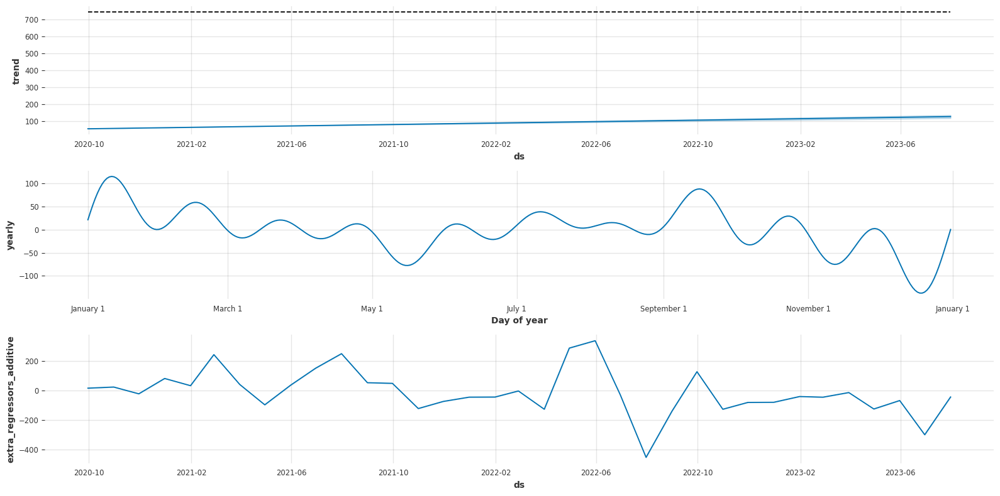

In [72]:
m.plot_components(y_pred, figsize=(16,8));

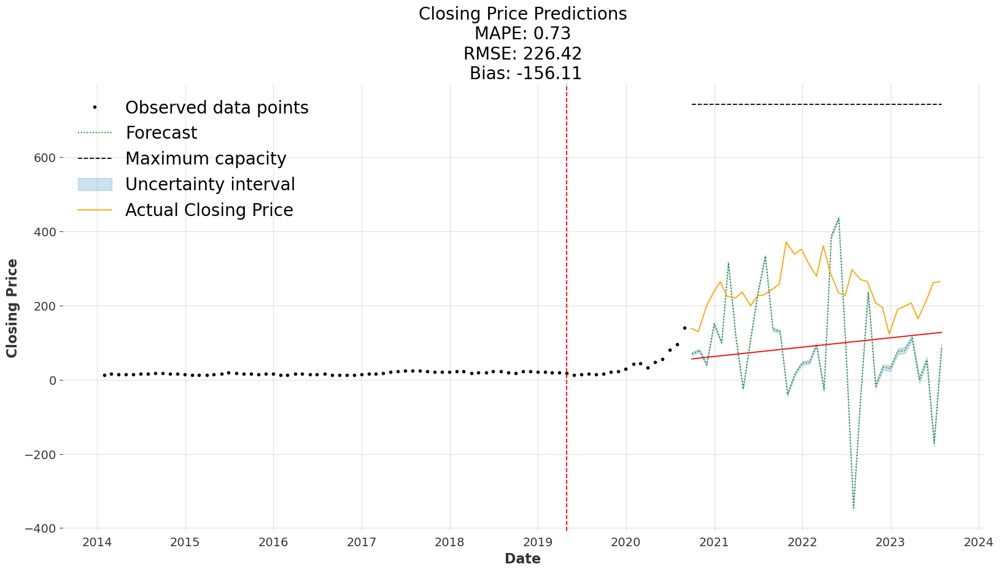

In [73]:
# Plotting forecasted data with changepoints
fig = m.plot(y_pred, figsize=(16,8))
a = add_changepoints_to_plot(fig.gca(), m, y_pred)

# Customize the forecasted line color to black
forecast_color = 'green'
forecast_line = fig.gca().lines[1]  # Get the first line from the Prophet plot
forecast_line.set_color(forecast_color)  # Set the color

# Set the linestyle of the forecasted line to dotted
forecast_line.set_linestyle('dotted')  # Set the linestyle

# Calculate MAPE and RMSE
mape = mean_absolute_percentage_error(ticker_mth_hist_df_v3[-35:]['y'].values, y_pred['yhat'].values)
rmse = np.sqrt(mean_squared_error(ticker_mth_hist_df_v3[-35:]['y'].values, y_pred['yhat'].values))

# Calculate the bias
bias = (y_pred['yhat'].values - ticker_mth_hist_df_v2[-35:]['y'].values).mean()

# Plot labels
plt.xlabel('Date', fontsize=16)
plt.ylabel('Closing Price', fontsize=16)

# Adjust the tick label size on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14) 

# Set title and labels
plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)


# Plotting the actual 'y_test' data
plt.plot(y_test.index, y_test, label='Actual Closing Price', color='orange')

# Display legend
plt.legend(fontsize = 20, loc = 'upper left'); # for legend to be displayed in our plot

# Show the plot
plt.show()

**Observations:**
- Prophet linear default model MAPE is by far the best but still not ideal
- There are predictions that go below \$0 despite specifying the prediction floor
- The red dotted line represents the detected changepoints in the time series data. These changepoints can be points where the trend shifts from increasing to decreasing or vice versa, indicating potential shifts in the behavior of the time series. TSLA stock price is quite stable and the trend start to shift from near mid 2019 onwards

|Model No.| Model Tried                                    	 |MAPE   |RMSE    |Bias   |Remarks           |
|---------|--------------------------------------------------|-------|--------|-------|------------------|
|1        | Linear Regression                                |0.74   |223.8   |-117.63|Predictions of close price can go below $0. Model is not practical    |
|2        | ARIMA                                            |5.83   |1657.03 |1285.04|p=1, d=3, q=3     |
|3        | ARIMAX (with exogenous features)                 |0.78   |231.79  |-135   |p=1, d=0, q=0     |
|4        | SARIMAX (with exogenous features & seasonality)  |0.78   |231.79  |-135   |p=1, d=0, q=0     |
|5        | Simple Exponential Smoothing                     |2.34   |620.82  |515.1  |Almost a linear prediction, not practical                  |
|6        | Prophet Linear Model                             |0.73   |226.42  |-156.11|Predictions of close price can go below \$0. Model is not practical|

### 4.3.7 Try Prophet Logistic Model using TSLA

In [74]:
m = Prophet(growth = 'logistic', #default value
           yearly_seasonality = 'auto', #default value
           weekly_seasonality = 'auto', #default value
           daily_seasonality = 'auto', #default value
           seasonality_prior_scale = 10, #higher value results in a stronger regularization, which dampens the amplitude of the seasonal patterns
           changepoint_prior_scale = 0.05) #default value
m.add_regressor('close_t_minus_6')
m.add_regressor('close_t_minus_7')
m.add_regressor('close_t_minus_8')
m.add_regressor('close_t_minus_9')
m.add_regressor('close_t_minus_10')
m.add_regressor('close_t_minus_11')
m.add_regressor('close_t_minus_12')

m.add_regressor('open_t_minus_6')
m.add_regressor('open_t_minus_7')
m.add_regressor('open_t_minus_8')
m.add_regressor('open_t_minus_9')
m.add_regressor('open_t_minus_10')
m.add_regressor('open_t_minus_11')
m.add_regressor('open_t_minus_12')

m.add_regressor('high_t_minus_6')
m.add_regressor('high_t_minus_7')
m.add_regressor('high_t_minus_8')
m.add_regressor('high_t_minus_9')
m.add_regressor('high_t_minus_10')
m.add_regressor('high_t_minus_11')
m.add_regressor('high_t_minus_12')

m.add_regressor('low_t_minus_6')
m.add_regressor('low_t_minus_7')
m.add_regressor('low_t_minus_8')
m.add_regressor('low_t_minus_9')
m.add_regressor('low_t_minus_10')
m.add_regressor('low_t_minus_11')
m.add_regressor('low_t_minus_12')

m.add_regressor('volume_t_minus_6')
m.add_regressor('volume_t_minus_7')
m.add_regressor('volume_t_minus_8')
m.add_regressor('volume_t_minus_9')
m.add_regressor('volume_t_minus_10')
m.add_regressor('volume_t_minus_11')
m.add_regressor('volume_t_minus_12')

# Set a saturating maximum so that the prediction will not go be more than 2 times the historical data
train['cap'] = (ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='TSLA']['close'].max())*2

# Set a saturating minimum so that the prediction will not go below $0
train['floor'] = 0

m.fit(train)

C:\Users\simyu\AppData\Local\Temp\ipykernel_5916\1052641894.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['cap'] = (ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='TSLA']['close'].max())*2
C:\Users\simyu\AppData\Local\Temp\ipykernel_5916\1052641894.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['floor'] = 0
22:07:31 - cmdstanpy - INFO - Chain [1] start processing
22:07:32 - cmdstanpy - INFO - Chain [1] done processing


In [75]:
# Create a DataFrame for future prediction dates
future = m.make_future_dataframe(periods=len(ticker_mth_hist_df_v3[-35:]), freq = '1M')

# Merge regressors (additional predictor variables)
# Select the last 35 rows from the 'ticker_mth_hist_df_v3' DataFrame
# Drop specific columns that are not needed ('y', 'volume', 'year', 'month', 'day')
# Perform an inner merge based on the 'ds' column
future = pd.merge(future, ticker_mth_hist_df_v3[-35:].drop(columns=['y','volume','year','month','day']),on='ds', how='inner')

# Set a saturating maximum so that the prediction will not go be more than 2 times the historical data
future['cap'] = (ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='TSLA']['close'].max())*2

# Set a saturating minimum so that the prediction will not go below $0
future['floor'] = 0

In [76]:
future.head()

,ds,date,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12,cap,floor
0,2020-09-30,2020-09-30,32.0000,44.53,43.37,29.53,22.00,20.89,15.43,34.02,55.93,36.13,28.59,22.95,21.84,16.20,36.20,57.57,43.53,30.27,22.97,22.72,16.40,29.76,40.77,35.95,26.81,21.81,20.65,14.95,1.283150e+09,1.432169e+09,1.325074e+09,7.537028e+08,4.249668e+08,7.897095e+08,6.233698e+08,742.66602,0
1,2020-10-31,2020-10-31,46.7500,32.00,44.53,43.37,29.53,22.00,20.89,49.17,34.02,55.93,36.13,28.59,22.95,21.84,57.99,36.20,57.57,43.53,30.27,22.97,22.72,45.54,29.76,40.77,35.95,26.81,21.81,20.65,1.696847e+09,1.283150e+09,1.432169e+09,1.325074e+09,7.537028e+08,4.249668e+08,7.897095e+08,742.66602,0
2,2020-11-30,2020-11-30,55.6700,46.75,32.00,44.53,43.37,29.53,22.00,55.63,49.17,34.02,55.93,36.13,28.59,22.95,55.67,57.99,36.20,57.57,43.53,30.27,22.97,52.33,45.54,29.76,40.77,35.95,26.81,21.81,5.809135e+08,1.696847e+09,1.283150e+09,1.432169e+09,1.325074e+09,7.537028e+08,4.249668e+08,742.66602,0
3,2020-12-31,2020-12-31,80.5800,55.67,46.75,32.00,44.53,43.37,29.53,64.60,55.63,49.17,34.02,55.93,36.13,28.59,81.87,55.67,57.99,36.20,57.57,43.53,30.27,63.23,52.33,45.54,29.76,40.77,35.95,26.81,8.478296e+08,5.809135e+08,1.696847e+09,1.283150e+09,1.432169e+09,1.325074e+09,7.537028e+08,742.66602,0
4,2021-01-31,2021-01-31,95.3839,80.58,55.67,46.75,32.00,44.53,43.37,95.67,64.60,55.63,49.17,34.02,55.93,36.13,104.31,81.87,55.67,57.99,36.20,57.57,43.53,94.20,63.23,52.33,45.54,29.76,40.77,35.95,9.172860e+08,8.478296e+08,5.809135e+08,1.696847e+09,1.283150e+09,1.432169e+09,1.325074e+09,742.66602,0


In [77]:
y_pred = m.predict(future)

In [78]:
y_pred.head(3)

,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,close_t_minus_10,close_t_minus_10_lower,close_t_minus_10_upper,close_t_minus_11,close_t_minus_11_lower,close_t_minus_11_upper,close_t_minus_12,close_t_minus_12_lower,close_t_minus_12_upper,close_t_minus_6,close_t_minus_6_lower,close_t_minus_6_upper,close_t_minus_7,close_t_minus_7_lower,close_t_minus_7_upper,close_t_minus_8,close_t_minus_8_lower,close_t_minus_8_upper,close_t_minus_9,close_t_minus_9_lower,close_t_minus_9_upper,extra_regressors_additive,extra_regressors_additive_lower,extra_regressors_additive_upper,high_t_minus_10,high_t_minus_10_lower,high_t_minus_10_upper,high_t_minus_11,high_t_minus_11_lower,high_t_minus_11_upper,high_t_minus_12,high_t_minus_12_lower,high_t_minus_12_upper,high_t_minus_6,high_t_minus_6_lower,high_t_minus_6_upper,high_t_minus_7,high_t_minus_7_lower,high_t_minus_7_upper,high_t_minus_8,high_t_minus_8_lower,high_t_minus_8_upper,high_t_minus_9,high_t_minus_9_lower,high_t_minus_9_upper,low_t_minus_10,low_t_minus_10_lower,low_t_minus_10_upper,low_t_minus_11,low_t_minus_11_lower,low_t_minus_11_upper,low_t_minus_12,low_t_minus_12_lower,low_t_minus_12_upper,low_t_minus_6,low_t_minus_6_lower,low_t_minus_6_upper,low_t_minus_7,low_t_minus_7_lower,low_t_minus_7_upper,low_t_minus_8,low_t_minus_8_lower,low_t_minus_8_upper,low_t_minus_9,low_t_minus_9_lower,low_t_minus_9_upper,open_t_minus_10,open_t_minus_10_lower,open_t_minus_10_upper,open_t_minus_11,open_t_minus_11_lower,open_t_minus_11_upper,open_t_minus_12,open_t_minus_12_lower,open_t_minus_12_upper,open_t_minus_6,open_t_minus_6_lower,open_t_minus_6_upper,open_t_minus_7,open_t_minus_7_lower,open_t_minus_7_upper,open_t_minus_8,open_t_minus_8_lower,open_t_minus_8_upper,open_t_minus_9,open_t_minus_9_lower,open_t_minus_9_upper,volume_t_minus_10,volume_t_minus_10_lower,volume_t_minus_10_upper,volume_t_minus_11,volume_t_minus_11_lower,volume_t_minus_11_upper,volume_t_minus_12,volume_t_minus_12_lower,volume_t_minus_12_upper,volume_t_minus_6,volume_t_minus_6_lower,volume_t_minus_6_upper,volume_t_minus_7,volume_t_minus_7_lower,volume_t_minus_7_upper,volume_t_minus_8,volume_t_minus_8_lower,volume_t_minus_8_upper,volume_t_minus_9,volume_t_minus_9_lower,volume_t_minus_9_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-09-30,51.859647,742.66602,0,29.010805,40.709915,51.859647,51.859647,-16.921881,-16.921881,-16.921881,-2.960337,-2.960337,-2.960337,-2.535078,-2.535078,-2.535078,-0.605102,-0.605102,-0.605102,-16.473385,-16.473385,-16.473385,79.238459,79.238459,79.238459,66.326472,66.326472,66.326472,40.851223,40.851223,40.851223,-12.881252,-12.881252,-12.881252,22.008282,22.008282,22.008282,11.760330,11.760330,11.760330,0.307806,0.307806,0.307806,153.666271,153.666271,153.666271,-145.685978,-145.685978,-145.685978,-188.243201,-188.243201,-188.243201,-91.007967,-91.007967,-91.007967,-5.753299,-5.753299,-5.753299,-1.168110,-1.168110,-1.168110,-0.237009,-0.237009,-0.237009,-73.230099,-73.230099,-73.230099,-124.286225,-124.286225,-124.286225,53.971858,53.971858,53.971858,24.117779,24.117779,24.117779,-18.871605,-18.871605,-18.871605,-8.354714,-8.354714,-8.354714,2.556451,2.556451,2.556451,-8.449613,-8.449613,-8.449613,183.635969,183.635969,183.635969,20.629020,20.629020,20.629020,26.130355,26.130355,26.130355,0.369294,0.369294,0.369294,-2.522095,-2.522095,-2.522095,2.546927,2.546927,2.546927,-20.352318,-20.352318,-20.352318,1.598790,1.598790,1.598790,6.555930,6.555930,6.555930,1.583664,1.583664,1.583664,-4.040629,-4.040629,-4.040629,0.0,0.0,0.0,34.937766
1,2020-10-31,53.367924,742.66602,0,15.152852,26.270569,53.367924,53.367924,-32.501654,-32.501654,-32.501654,-6.794416,-6.794416,-6.794416,-3.105134,-3.105134,-3.105134,8.502698,8.502698,8.502698,-33.442321,-33.442321,-33.442321,42.891840,42.891840,42.891840,69.217057,69.217057,69.217057,84.008014,84.008014,84.008014,-28.991287,-2

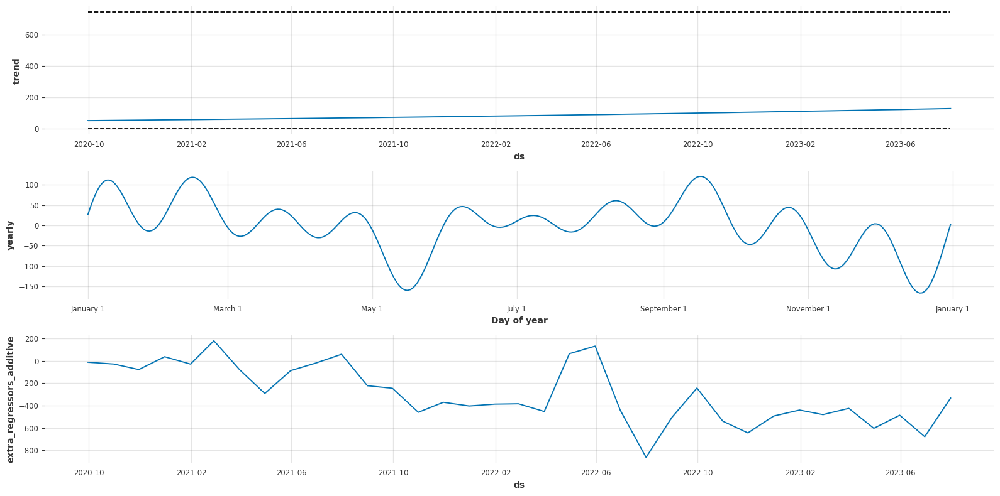

In [79]:
m.plot_components(y_pred, figsize=(16,8));

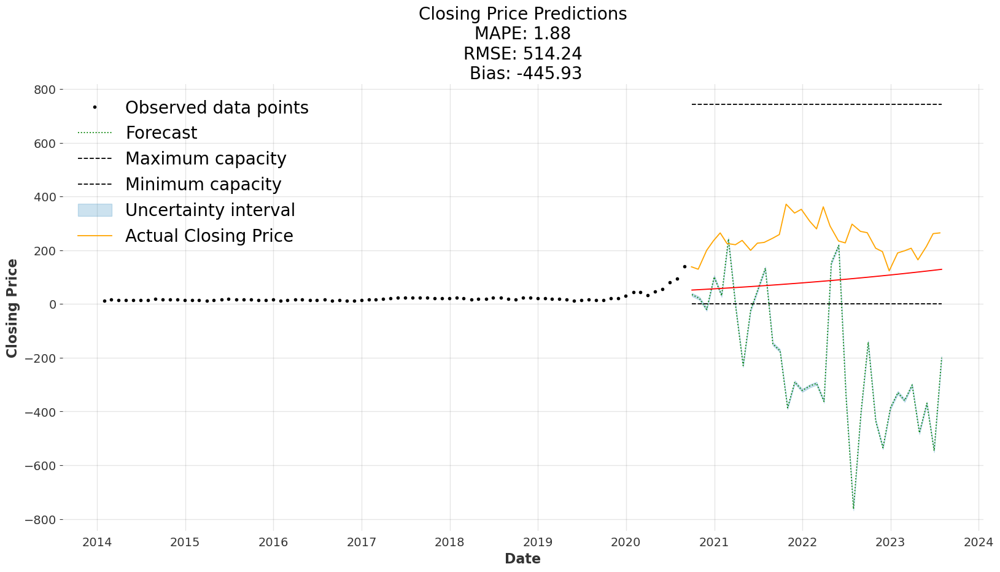

In [80]:
# Plotting forecasted data with changepoints
fig = m.plot(y_pred, figsize=(16,8))
a = add_changepoints_to_plot(fig.gca(), m, y_pred)

# Customize the forecasted line color to black
forecast_color = 'green'
forecast_line = fig.gca().lines[1]  # Get the first line from the Prophet plot
forecast_line.set_color(forecast_color)  # Set the color

# Set the linestyle of the forecasted line to dotted
forecast_line.set_linestyle('dotted')  # Set the linestyle

# Calculate MAPE and RMSE
mape = mean_absolute_percentage_error(ticker_mth_hist_df_v3[-35:]['y'].values, y_pred['yhat'].values)
rmse = np.sqrt(mean_squared_error(ticker_mth_hist_df_v3[-35:]['y'].values, y_pred['yhat'].values))

# Calculate the bias
bias = (y_pred['yhat'].values - ticker_mth_hist_df_v2[-35:]['y'].values).mean()

# Plot labels
plt.xlabel('Date', fontsize=16)
plt.ylabel('Closing Price', fontsize=16)

# Adjust the tick label size on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14) 

# Set title and labels
plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)


# Plotting the actual 'y_test' data
plt.plot(y_test.index, y_test, label='Actual Closing Price', color='orange')

# Display legend
plt.legend(fontsize = 20, loc = 'upper left'); # for legend to be displayed in our plot

# Show the plot
plt.show()

**Observations:**
- Prophet logistic default model is worse than Prophet linear default model
- There are more predictions that go below \$0 despite specifying the prediction floor

|Model No.| Model Tried                                    	 |MAPE   |RMSE    |Bias   |Remarks           |
|---------|--------------------------------------------------|-------|--------|-------|------------------|
|1        | Linear Regression                                |0.74   |223.8   |-117.63|Predictions of close price can go below $0. Model is not practical    |
|2        | ARIMA                                            |5.83   |1657.03 |1285.04|p=1, d=3, q=3     |
|3        | ARIMAX (with exogenous features)                 |0.78   |231.79  |-135   |p=1, d=0, q=0     |
|4        | SARIMAX (with exogenous features & seasonality)  |0.78   |231.79  |-135   |p=1, d=0, q=0     |
|5        | Simple Exponential Smoothing                     |2.34   |620.82  |515.1  |Almost a linear prediction, not practical                  |
|6        | Prophet Linear Model                             |0.73   |226.42  |-156.11|Predictions of close price can go below \$0. Model is not practical|
|7        | Prophet Logistic Model                           |1.88   |514.24  |-445.93|Predictions of close price can go below \$0. Model is not practical|

### 4.3.8 Try VARIMA using TSLA

In [81]:
# Exclude parameters that are lesser than t_minus_6 (i.e. drop t_minus_1, t_minus_2 until t_minus_5)
ticker_mth_hist_df_v2 = ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='TSLA'].drop(columns = ['symbol','currency','high','open','low'])

columns_to_remove = [col for col in ticker_mth_hist_df_v2.columns if re.search(r't_minus_(?!1[0-2]$)[1-5]|t_minus_1$', col)]
ticker_mth_hist_df_v2.drop(columns=columns_to_remove + ['symbol', 'currency'], inplace=True, errors='ignore')

In [82]:
ticker_mth_hist_df_v2.index = ticker_mth_hist_df_v2.index.to_period('M').to_timestamp('M')
ticker_mth_hist_df_v2['date'] = ticker_mth_hist_df_v2.index

In [83]:
# Convert the DataFrame to a Darts TimeSeries with explicit frequency, training data to exclude most recent 3 years i.e. 36 months
# VARIMA only support multivariate parameters, minimally need to have 2 parameters as input
time_series = TimeSeries.from_dataframe(ticker_mth_hist_df_v2[:-35], time_col= 'date', value_cols=['close',
                                                                                                   'close_t_minus_6',
                                                                                                    ],freq = 'M')

# Fit a VARIMA(1,1) model
model = VARIMA(p=1, d=1, trend='c', add_encoders=None)
model.fit(time_series)

# Print model summary
#print(results.summary())

# Forecast the next 36 time steps
forecast = model.predict(36, series=None, future_covariates=None, num_samples=1)

# num_samples parameter determines how many Monte Carlo samples are drawn from the model's predictive distribution

print("Forecast:")
print(forecast)

Forecast:
<TimeSeries (DataArray) (date: 36, component: 2, sample: 1)>
array([[[159.65678287],
        [ 52.32239998]],

       [[175.96973191],
        [ 56.63968494]],

       [[187.48789285],
        [ 60.00106557]],

       [[196.13467623],
        [ 62.46930015]],

       [[202.76975475],
        [ 64.37547406]],

       [[208.05343807],
        [ 65.89326538]],

       [[212.41945221],
        [ 67.14923777]],
...
       [[272.56001775],
        [ 84.52640258]],

       [[274.99894329],
        [ 85.23167599]],

       [[277.43781439],
        [ 85.93693384]],

       [[279.8766486 ],
        [ 86.64218115]],

       [[282.31545782],
        [ 87.34742132]],

       [[284.75425011],
        [ 88.05265666]],

       [[287.19303092],
        [ 88.75788871]]])
Coordinates:
  * date       (date) datetime64[ns] 2020-09-30 2020-10-31 ... 2023-08-31
  * component  (component) object 'close' 'close_t_minus_6'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None

In [84]:
forecast.time_index

DatetimeIndex(['2020-09-30', '2020-10-31', '2020-11-30', '2020-12-31',
               '2021-01-31', '2021-02-28', '2021-03-31', '2021-04-30',
               '2021-05-31', '2021-06-30', '2021-07-31', '2021-08-31',
               '2021-09-30', '2021-10-31', '2021-11-30', '2021-12-31',
               '2022-01-31', '2022-02-28', '2022-03-31', '2022-04-30',
               '2022-05-31', '2022-06-30', '2022-07-31', '2022-08-31',
               '2022-09-30', '2022-10-31', '2022-11-30', '2022-12-31',
               '2023-01-31', '2023-02-28', '2023-03-31', '2023-04-30',
               '2023-05-31', '2023-06-30', '2023-07-31', '2023-08-31'],
              dtype='datetime64[ns]', name='date', freq='M')

In [85]:
forecast.columns

Index(['close', 'close_t_minus_6'], dtype='object', name='component')

In [86]:
forecast.values()

array([[159.65678287,  52.32239998],
       [175.96973191,  56.63968494],
       [187.48789285,  60.00106557],
       [196.13467623,  62.46930015],
       [202.76975475,  64.37547406],
       [208.05343807,  65.89326538],
       [212.41945221,  67.14923777],
       [216.16406343,  68.22758344],
       [219.48758421,  69.18562014],
       [222.52580885,  70.0621351 ],
       [225.37073098,  70.88341676],
       [228.08468254,  71.66727524],
       [230.70989577,  72.42577791],
       [233.27498491,  73.16710092],
       [235.79933736,  73.89678394],
       [238.29608892,  74.61858038],
       [240.77413967,  75.3350333 ],
       [243.23951981,  76.04786577],
       [245.69631506,  76.75824521],
       [248.14729366,  77.46696262],
       [250.59433124,  78.17455394],
       [253.03869859,  78.88138228],
       [255.48125676,  79.58769366],
       [257.92258913,  80.29365479],
       [260.36309095,  80.9993786 ],
       [262.80303006,  81.70494162],
       [265.24258789,  82.4103957 ],
 

In [87]:
data = {
    'Datetime': forecast.time_index,
    'Close': forecast.values()[:, 0],
    'close_t_minus_6': forecast.values()[:, 1]
}

forecast_varima_df = pd.DataFrame(data)

In [88]:
forecast_varima_df.head()

,Datetime,Close,close_t_minus_6
0,2020-09-30,159.656783,52.322400
1,2020-10-31,175.969732,56.639685
2,2020-11-30,187.487893,60.001066
3,2020-12-31,196.134676,62.469300
4,2021-01-31,202.769755,64.375474


In [89]:
# Copy the 'Date' column to index
forecast_varima_df.set_index('Datetime', inplace=True)

In [90]:
ticker_mth_hist_df_v2[-36:]['close'].values

array([139.4399 , 138.3632 , 129.3465 , 199.67979, 235.2231 , 264.5097 ,
       225.1664 , 220.5831 , 236.4798 , 199.68311, 226.2998 , 229.06641,
       244.5231 , 258.4064 , 371.33301, 338.323  , 352.25961, 307.77301,
       279.42969, 361.5296 , 290.25299, 234.5164 , 227.26311, 297.14969,
       270.20999, 265.25   , 207.47   , 194.86   , 123.18   , 189.98   ,
       197.78999, 207.46001, 164.31   , 213.97   , 261.76999, 264.54999])

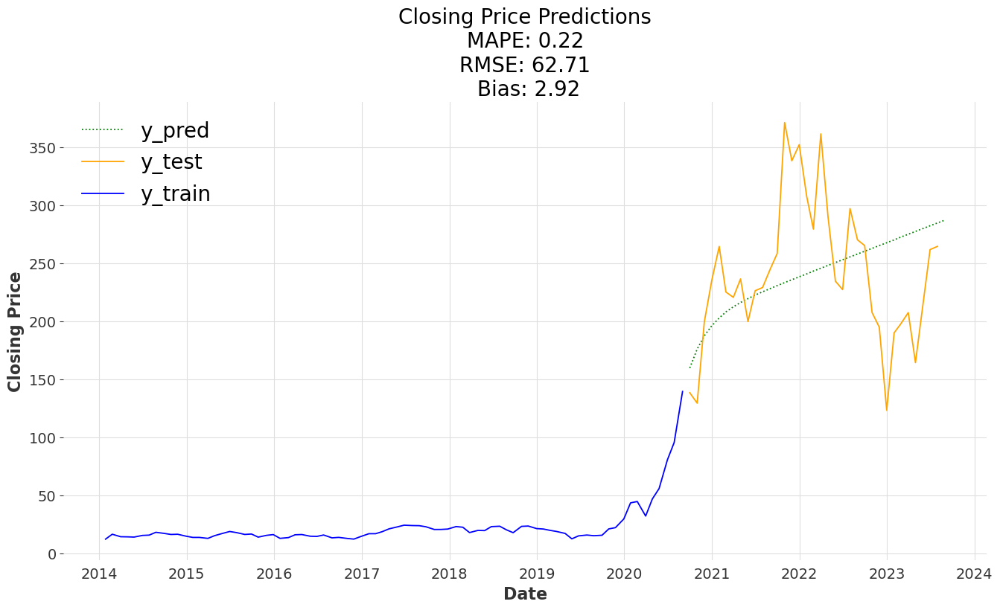

In [91]:
# Plot data.
plt.figure(figsize=(16,8))

plt.plot(forecast_varima_df['Close'], label="y_pred", linestyle ='dotted', color='green')
plt.plot(ticker_mth_hist_df_v2[-35:]['close'], label = 'y_test', color ='orange')
plt.plot(y_train, label = 'y_train', color='blue')

# Find the MAPE (mean abs percentage error) of the predictions
mape = mean_absolute_percentage_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]) # like all sklearn metrics we've used, pass y_actual, y_pred

# Find the RMSE of the predictions
rmse = np.sqrt(mean_squared_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]))

# Calculate the bias
bias = (forecast.values()[:, 0] - ticker_mth_hist_df_v2[-36:]['close'].values).mean()

# Plot labels
plt.xlabel('Date', fontsize=16)
plt.ylabel('Closing Price', fontsize=16)

# Adjust the tick label size on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14) 

plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)
plt.legend(fontsize = 20, loc = 'upper left'); # for legend to be displayed in our plot

|Model No.| Model Tried                                    	 |MAPE   |RMSE    |Bias   |Remarks           |
|---------|--------------------------------------------------|-------|--------|-------|------------------|
|1        | Linear Regression                                |0.74   |223.8   |-117.63|Predictions of close price can go below $0. Model is not practical    |
|2        | ARIMA                                            |5.83   |1657.03 |1285.04|p=1, d=3, q=3     |
|3        | ARIMAX (with exogenous features)                 |0.78   |231.79  |-135   |p=1, d=0, q=0     |
|4        | SARIMAX (with exogenous features & seasonality)  |0.78   |231.79  |-135   |p=1, d=0, q=0     |
|5        | Simple Exponential Smoothing                     |2.34   |620.82  |515.1  |Almost a linear prediction, not practical                  |
|6        | Prophet Linear Model                             |0.73   |226.42  |-156.11|Predictions of close price can go below \$0. Model is not practical|
|7        | Prophet Logistic Model                           |1.88   |514.24  |-445.93|Predictions of close price can go below \$0. Model is not practical|
|8        | VARIMA (Vector Autoregressive Integrated Moving Average)|0.22   |62.71  |2.92 |Best model so far           |

## 4.4 Finetune VARIMA model (best model)

### 4.4.1 1st try

In [212]:
# Exclude parameters that are lesser than t_minus_6 (i.e. drop t_minus_1, t_minus_2 until t_minus_5)
ticker_mth_hist_df_v2 = ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='TSLA'].drop(columns = ['symbol','currency','high','open','low'])

columns_to_remove = [col for col in ticker_mth_hist_df_v2.columns if re.search(r't_minus_(?!1[0-2]$)[1-5]|t_minus_1$', col)]
ticker_mth_hist_df_v2.drop(columns=columns_to_remove + ['symbol', 'currency'], inplace=True, errors='ignore')

In [213]:
ticker_mth_hist_df_v2.index = ticker_mth_hist_df_v2.index.to_period('M').to_timestamp('M')
ticker_mth_hist_df_v2['date'] = ticker_mth_hist_df_v2.index

In [94]:
# Do grid search to fine tune parameters

# Replace this with your actual data loading code
time_series = TimeSeries.from_dataframe(ticker_mth_hist_df_v2[:-35], time_col='date', value_cols=['close', 'close_t_minus_6'], freq='M')

# Define the range of hyperparameters and num_samples you want to search over
p_range = [1, 2, 3]          # Order of the autoregressive (AR) component
d_range = [0, 1]             # Order of differencing (I)
q_range = [0, 1, 2, 3]       # Order of the moving average (MA) component
num_samples_range = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]  # Number of samples

# Initialize variables to store the best hyperparameters and lowest metric
best_p = None
best_d = None
best_q = None
best_num_samples = None
best_metric = np.inf

# Perform grid search
for p in p_range:
    for d in d_range:
        for q in q_range:
            for num_sample in num_samples_range:
                # Skip if differencing order is too high
                if d > 1 and check_seasonality(time_series):
                    continue
                
                # Create the VARIMA model with current hyperparameters
                model = VARIMA(p=p, d=d, q=q, trend='c', add_encoders=None)
                
                # Fit the model to the data
                model.fit(time_series)
                
                # Forecast using the model
                forecast = model.predict(36, series=None, future_covariates=None, num_samples=num_sample)
                
                # Calculate the MAPE
                actual_values = ticker_mth_hist_df_v2[-36:]['close'].values
                forecast_values = forecast.values()[:, 0]
                mape = np.mean(np.abs((actual_values - forecast_values) / actual_values)) * 100
                
                # Check if the current model has the lowest MAPE
                if mape < best_metric:
                    best_p = p
                    best_d = d
                    best_q = q
                    best_num_samples = num_sample
                    best_metric = mape

# Print the best hyperparameters and metric
print("Best Hyperparameters:")
print("p:", best_p)
print("d:", best_d)
print("q:", best_q)
print("Best num_samples:", best_num_samples)
print("Best MAPE:", best_metric)

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood opt

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_ret

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic foreca

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Trends are not w

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Pyt

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to 

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to 

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

Best Hyperparameters:
p: 3
d: 1
q: 3
Best num_samples: 3
Best MAPE: 17.454280505161947


**Try VARIMAX model again with 1st try's 'Best Hyperparameters'**

In [95]:
# Exclude parameters that are lesser than t_minus_6 (i.e. drop t_minus_1, t_minus_2 until t_minus_5)
ticker_mth_hist_df_v2 = ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='TSLA'].drop(columns = ['symbol','currency','high','open','low'])

columns_to_remove = [col for col in ticker_mth_hist_df_v2.columns if re.search(r't_minus_(?!1[0-2]$)[1-5]|t_minus_1$', col)]
ticker_mth_hist_df_v2.drop(columns=columns_to_remove + ['symbol', 'currency'], inplace=True, errors='ignore')

In [96]:
ticker_mth_hist_df_v2.index = ticker_mth_hist_df_v2.index.to_period('M').to_timestamp('M')
ticker_mth_hist_df_v2['date'] = ticker_mth_hist_df_v2.index

In [214]:
# Convert the DataFrame to a Darts TimeSeries with explicit frequency, training data to exclude most recent 3 years i.e. 36 months
# VARIMA only support multivariate parameters, minimally need to have 2 parameters as input
time_series = TimeSeries.from_dataframe(ticker_mth_hist_df_v2[:-35], time_col= 'date', value_cols=['close',
                                                                                                   'close_t_minus_6',
                                                                                                    ],freq = 'M')

# Fit a VARIMA(1,1) model
model = VARIMA(p=3, d=1, q=3, trend='c', add_encoders=None)
model.fit(time_series)

# Print model summary
#print(results.summary())

# Forecast the next 36 time steps
forecast = model.predict(36, series=None, future_covariates=None, num_samples=3)

# num_samples parameter determines how many Monte Carlo samples are drawn from the model's predictive distribution

print("Forecast:")
print(forecast)

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.


Forecast:
<TimeSeries (DataArray) (date: 36, component: 2, sample: 3)>
array([[[152.90250822, 152.90250822, 152.90250822],
        [ 43.63937759,  43.63937759,  43.63937759]],

       [[178.39427746, 189.56214724, 190.18418979],
        [ 55.08436075,  59.23890809,  58.83658042]],

       [[177.64950263, 201.42343257, 204.60119282],
        [ 56.99856473,  68.46834162,  66.36457071]],

       [[192.83303602, 242.71667274, 232.24259576],
        [ 50.1004978 ,  68.124004  ,  66.05101856]],

       [[184.56778372, 249.44650189, 229.7886523 ],
        [ 45.82120059,  70.029068  ,  69.15975799]],

       [[195.91666232, 280.11064387, 261.07646685],
        [ 50.0142513 ,  77.74601669,  79.7920991 ]],

       [[181.80738818, 275.04531229, 280.2979277 ],
        [ 46.99896922,  76.73427142,  78.19534685]],
...
       [[155.94819281, 305.87392594, 419.38197863],
        [ 38.32051026,  86.5583422 , 111.1694993 ]],

       [[154.92091875, 312.64830315, 431.89439482],
        [ 38.71790984,  89

In [215]:
data = {
    'Datetime': forecast.time_index,
    'Close': forecast.values()[:, 0],
    'close_t_minus_6': forecast.values()[:, 1]
}

forecast_varima_df = pd.DataFrame(data)

In [216]:
forecast_varima_df.head()

,Datetime,Close,close_t_minus_6
0,2020-09-30,152.902508,43.639378
1,2020-10-31,178.394277,55.084361
2,2020-11-30,177.649503,56.998565
3,2020-12-31,192.833036,50.100498
4,2021-01-31,184.567784,45.821201


In [217]:
# Copy the 'Date' column to index
forecast_varima_df.set_index('Datetime', inplace=True)

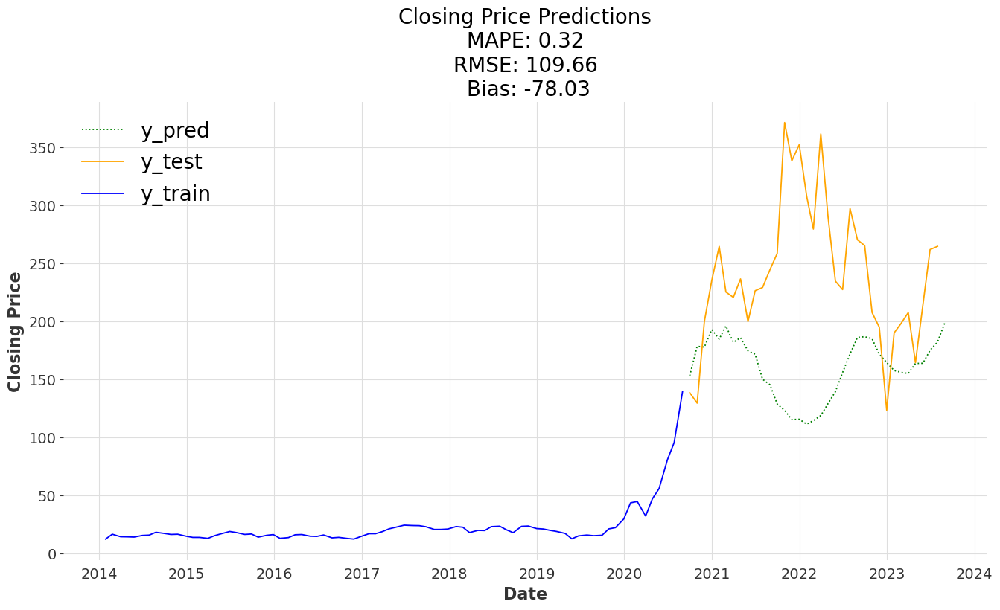

In [218]:
# Plot data.
plt.figure(figsize=(16,8))

plt.plot(forecast_varima_df['Close'], label="y_pred", linestyle ='dotted', color='green')
plt.plot(ticker_mth_hist_df_v2[-35:]['close'], label = 'y_test', color ='orange')
plt.plot(y_train, label = 'y_train', color='blue')

# Find the MAPE (mean abs percentage error) of the predictions
mape = mean_absolute_percentage_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]) # like all sklearn metrics we've used, pass y_actual, y_pred

# Find the RMSE of the predictions
rmse = np.sqrt(mean_squared_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]))

# Calculate the bias
bias = (forecast.values()[:, 0] - ticker_mth_hist_df_v2[-36:]['close'].values).mean()

# Plot labels
plt.xlabel('Date', fontsize=16)
plt.ylabel('Closing Price', fontsize=16)

# Adjust the tick label size on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14) 

plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)
plt.legend(fontsize = 20, loc = 'upper left'); # for legend to be displayed in our plot

**Observations:**
- fine tuned hyperparameters has different parameters from original VARIMA model (Model No. 8)
- the fine tuned hyperparameters yield worse result than original VARIMA model (Model No. 8)

|Model No.| Model Tried                                    	 |MAPE   |RMSE    |Bias   |Remarks           |
|---------|--------------------------------------------------|-------|--------|-------|------------------|
|1        | Linear Regression                                |1.82   |495.81  |-429.38|Predictions of close price can go below $0. Model is not practical    |
|2        | ARIMA                                            |5.83   |1657.03 |1285.04|p=1, d=3, q=3     |
|3        | ARIMAX (with exogenous features)                 |0.75   |224.51  |-120.9 |p=1, d=0, q=0     |
|4        | SARIMAX (with exogenous features & seasonality)  |0.75   |224.51  |-120.9 |p=1, d=0, q=0     |
|5        | Simple Exponential Smoothing                     |2.34   |620.82  |515.1  |Almost a linear prediction, not practical                  |
|6        | Prophet Linear Model                             |0.73   |226.42  |-156.11|Predictions of close price can go below \$0. Model is not practical|
|7        | Prophet Logistic Model                           |1.88   |514.24  |-445.93|Predictions of close price can go below \$0. Model is not practical|
|8        | VARIMA (Vector Autoregressive Integrated Moving Average)|0.22   |62.71  |2.92 |p=1, d=1, q=0, num_samples=1      |
|9        | VARIMA (Vector Autoregressive Integrated Moving Average)|0.32   |109.66  |-78.03 |p=3, d=1, q=3, num_samples=3|

### 4.4.1 2nd try

**Try VARIMAX model again with 2nd try's 'Best Hyperparameters'**

In [102]:
# Do grid search to fine tune parameters

# Replace this with your actual data loading code
time_series = TimeSeries.from_dataframe(ticker_mth_hist_df_v2[:-35], time_col='date', value_cols=['close', 'close_t_minus_6'], freq='M')

# Define the range of hyperparameters and num_samples you want to search over
p_range = [1, 2, 3]          # Order of the autoregressive (AR) component
d_range = [0, 1]             # Order of differencing (I)
q_range = [0, 1, 2, 3]       # Order of the moving average (MA) component
num_samples_range = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]  # Number of samples

# Initialize variables to store the best hyperparameters and lowest metric
best_p = None
best_d = None
best_q = None
best_num_samples = None
best_metric = np.inf

# Perform grid search
for p in p_range:
    for d in d_range:
        for q in q_range:
            for num_sample in num_samples_range:
                # Skip if differencing order is too high
                if d > 1 and check_seasonality(time_series):
                    continue
                
                # Create the VARIMA model with current hyperparameters
                model = VARIMA(p=p, d=d, q=q, trend='c', add_encoders=None)
                
                # Fit the model to the data
                model.fit(time_series)
                
                # Forecast using the model
                forecast = model.predict(36, series=None, future_covariates=None, num_samples=num_sample)
                
                # Calculate the MAPE
                actual_values = ticker_mth_hist_df_v2[-36:]['close'].values
                forecast_values = forecast.values()[:, 0]
                mape = np.mean(np.abs((actual_values - forecast_values) / actual_values)) * 100
                
                # Check if the current model has the lowest MAPE
                if mape < best_metric:
                    best_p = p
                    best_d = d
                    best_q = q
                    best_num_samples = num_sample
                    best_metric = mape

# Print the best hyperparameters and metric
print("Best Hyperparameters:")
print("p:", best_p)
print("d:", best_d)
print("q:", best_q)
print("Best num_samples:", best_num_samples)
print("Best MAPE:", best_metric)

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood opt

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_ret

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic foreca

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Trends are not w

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Pyt

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to 

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to 

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

Best Hyperparameters:
p: 1
d: 1
q: 3
Best num_samples: 10
Best MAPE: 16.26006330582104


**Try VARIMAX model again with 2nd 'Best Hyperparameters'**

In [219]:
# Exclude parameters that are lesser than t_minus_6 (i.e. drop t_minus_1, t_minus_2 until t_minus_5)
ticker_mth_hist_df_v2 = ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='TSLA'].drop(columns = ['symbol','currency','high','open','low'])

columns_to_remove = [col for col in ticker_mth_hist_df_v2.columns if re.search(r't_minus_(?!1[0-2]$)[1-5]|t_minus_1$', col)]
ticker_mth_hist_df_v2.drop(columns=columns_to_remove + ['symbol', 'currency'], inplace=True, errors='ignore')

In [220]:
ticker_mth_hist_df_v2.index = ticker_mth_hist_df_v2.index.to_period('M').to_timestamp('M')
ticker_mth_hist_df_v2['date'] = ticker_mth_hist_df_v2.index

In [221]:
# Convert the DataFrame to a Darts TimeSeries with explicit frequency, training data to exclude most recent 3 years i.e. 36 months
# VARIMA only support multivariate parameters, minimally need to have 2 parameters as input
time_series = TimeSeries.from_dataframe(ticker_mth_hist_df_v2[:-35], time_col= 'date', value_cols=['close',
                                                                                                   'close_t_minus_6',
                                                                                                    ],freq = 'M')

# Fit a VARIMA(1,1) model
model = VARIMA(p=1, d=1, q=3, trend='c', add_encoders=None)
model.fit(time_series)

# Print model summary
#print(results.summary())

# Forecast the next 36 time steps
forecast = model.predict(36, series=None, future_covariates=None, num_samples=10)

# num_samples parameter determines how many Monte Carlo samples are drawn from the model's predictive distribution

print("Forecast:")
print(forecast)

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.


Forecast:
<TimeSeries (DataArray) (date: 36, component: 2, sample: 10)>
array([[[152.96858573, 152.96858573, 152.96858573, 152.96858573,
         152.96858573, 152.96858573, 152.96858573, 152.96858573,
         152.96858573, 152.96858573],
        [ 41.12581561,  41.12581561,  41.12581561,  41.12581561,
          41.12581561,  41.12581561,  41.12581561,  41.12581561,
          41.12581561,  41.12581561]],

       [[169.67006539, 178.16150847, 173.04757418, 169.83131878,
         175.11515738, 178.03564057, 178.94172551, 174.62869761,
         181.10828706, 174.9554027 ],
        [ 44.28709807,  44.09662442,  45.00247963,  43.50180835,
          45.24826341,  45.29901316,  43.3052834 ,  44.78256938,
          43.42958725,  43.56990871]],

       [[170.73646334, 180.76372882, 182.1851775 , 171.89398087,
         181.66018929, 188.27987692, 183.95951138, 185.7050518 ,
         190.44321961, 183.11082626],
        [ 51.27616025,  51.07847024,  51.65052684,  47.18205427,
          51.493382

In [222]:
data = {
    'Datetime': forecast.time_index,
    'Close': forecast.values()[:, 0],
    'close_t_minus_6': forecast.values()[:, 1]
}

forecast_varima_df = pd.DataFrame(data)

In [223]:
forecast_varima_df.head()

,Datetime,Close,close_t_minus_6
0,2020-09-30,152.968586,41.125816
1,2020-10-31,169.670065,44.287098
2,2020-11-30,170.736463,51.276160
3,2020-12-31,169.135948,43.073627
4,2021-01-31,164.064925,41.414799


In [224]:
# Copy the 'Date' column to index
forecast_varima_df.set_index('Datetime', inplace=True)

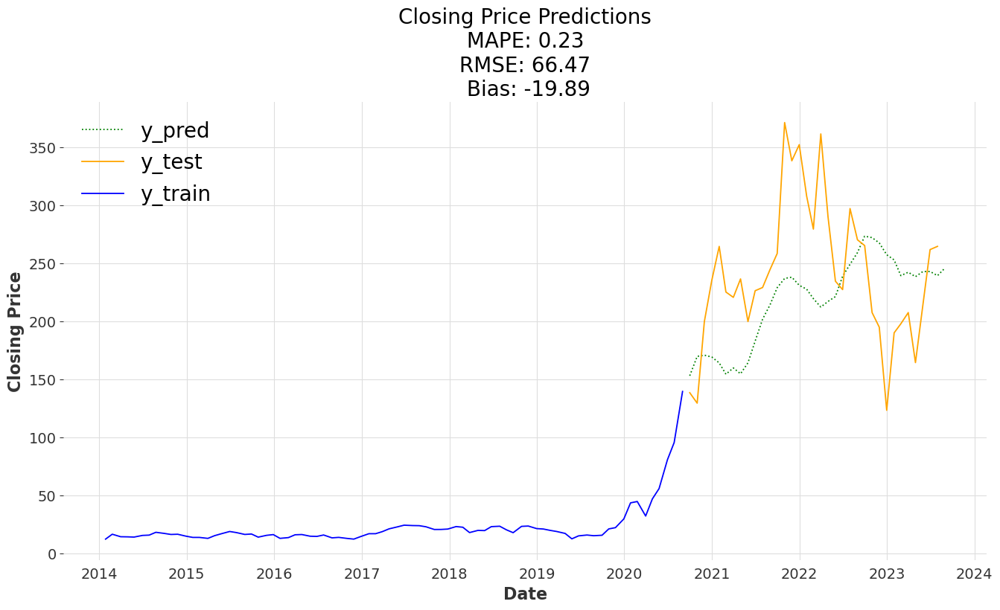

In [225]:
# Plot data.
plt.figure(figsize=(16,8))

plt.plot(forecast_varima_df['Close'], label="y_pred", linestyle ='dotted', color='green')
plt.plot(ticker_mth_hist_df_v2[-35:]['close'], label = 'y_test', color ='orange')
plt.plot(y_train, label = 'y_train', color='blue')

# Find the MAPE (mean abs percentage error) of the predictions
mape = mean_absolute_percentage_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]) # like all sklearn metrics we've used, pass y_actual, y_pred

# Find the RMSE of the predictions
rmse = np.sqrt(mean_squared_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]))

# Calculate the bias
bias = (forecast.values()[:, 0] - ticker_mth_hist_df_v2[-36:]['close'].values).mean()

# Plot labels
plt.xlabel('Date', fontsize=16)
plt.ylabel('Closing Price', fontsize=16)

# Adjust the tick label size on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14) 

plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)
plt.legend(fontsize = 20, loc = 'upper left'); # for legend to be displayed in our plot

**Observations:**
- fine tuned hyperparameters has different parameters from original VARIMA model (Model No. 8)
- the fine tuned hyperparameters yield worse result than original VARIMA model (Model No. 8)

|Model No.| Model Tried                                    	 |MAPE   |RMSE    |Bias   |Remarks           |
|---------|--------------------------------------------------|-------|--------|-------|------------------|
|1        | Linear Regression                                |1.82   |495.81  |-429.38|Predictions of close price can go below $0. Model is not practical    |
|2        | ARIMA                                            |5.83   |1657.03 |1285.04|p=1, d=3, q=3     |
|3        | ARIMAX (with exogenous features)                 |0.75   |224.51  |-120.9 |p=1, d=0, q=0     |
|4        | SARIMAX (with exogenous features & seasonality)  |0.75   |224.51  |-120.9 |p=1, d=0, q=0     |
|5        | Simple Exponential Smoothing                     |2.34   |620.82  |515.1  |Almost a linear prediction, not practical                  |
|6        | Prophet Linear Model                             |0.73   |226.42  |-156.11|Predictions of close price can go below \$0. Model is not practical|
|7        | Prophet Logistic Model                           |1.88   |514.24  |-445.93|Predictions of close price can go below \$0. Model is not practical|
|8        | VARIMA (Vector Autoregressive Integrated Moving Average)|0.22   |62.71  |2.92 |p=1, d=1, q=0, num_samples=1      |
|9        | VARIMA (Vector Autoregressive Integrated Moving Average)|0.32   |109.66  |-78.03 |p=3, d=1, q=3, num_samples=3|
|10       | VARIMA (Vector Autoregressive Integrated Moving Average)|0.23   |66.47 |-19.89 |p=1, d=1, q=3, num_samples=10|

### 4.4.1 3rd try

**Try VARIMAX model again with 3rd try's 'Best Hyperparameters'**

In [110]:
# Do grid search to fine tune parameters

# Replace this with your actual data loading code
time_series = TimeSeries.from_dataframe(ticker_mth_hist_df_v2[:-35], time_col='date', value_cols=['close', 'close_t_minus_6'], freq='M')

# Define the range of hyperparameters and num_samples you want to search over
p_range = [1, 2, 3]          # Order of the autoregressive (AR) component
d_range = [0, 1]             # Order of differencing (I)
q_range = [0, 1, 2, 3]       # Order of the moving average (MA) component
num_samples_range = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]  # Number of samples

# Initialize variables to store the best hyperparameters and lowest metric
best_p = None
best_d = None
best_q = None
best_num_samples = None
best_metric = np.inf

# Perform grid search
for p in p_range:
    for d in d_range:
        for q in q_range:
            for num_sample in num_samples_range:
                # Skip if differencing order is too high
                if d > 1 and check_seasonality(time_series):
                    continue
                
                # Create the VARIMA model with current hyperparameters
                model = VARIMA(p=p, d=d, q=q, trend='c', add_encoders=None)
                
                # Fit the model to the data
                model.fit(time_series)
                
                # Forecast using the model
                forecast = model.predict(36, series=None, future_covariates=None, num_samples=num_sample)
                
                # Calculate the MAPE
                actual_values = ticker_mth_hist_df_v2[-36:]['close'].values
                forecast_values = forecast.values()[:, 0]
                mape = np.mean(np.abs((actual_values - forecast_values) / actual_values)) * 100
                
                # Check if the current model has the lowest MAPE
                if mape < best_metric:
                    best_p = p
                    best_d = d
                    best_q = q
                    best_num_samples = num_sample
                    best_metric = mape

# Print the best hyperparameters and metric
print("Best Hyperparameters:")
print("p:", best_p)
print("d:", best_d)
print("q:", best_q)
print("Best num_samples:", best_num_samples)
print("Best MAPE:", best_metric)

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood opt

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_ret

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic foreca

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Trends are not w

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Pyt

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to 

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to 

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\simyu\AppD

Best Hyperparameters:
p: 1
d: 1
q: 2
Best num_samples: 3
Best MAPE: 16.92505997290478


**Try VARIMAX model again with 3rd 'Best Hyperparameters'**

In [226]:
# Exclude parameters that are lesser than t_minus_6 (i.e. drop t_minus_1, t_minus_2 until t_minus_5)
ticker_mth_hist_df_v2 = ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='TSLA'].drop(columns = ['symbol','currency','high','open','low'])

columns_to_remove = [col for col in ticker_mth_hist_df_v2.columns if re.search(r't_minus_(?!1[0-2]$)[1-5]|t_minus_1$', col)]
ticker_mth_hist_df_v2.drop(columns=columns_to_remove + ['symbol', 'currency'], inplace=True, errors='ignore')

In [227]:
ticker_mth_hist_df_v2.index = ticker_mth_hist_df_v2.index.to_period('M').to_timestamp('M')
ticker_mth_hist_df_v2['date'] = ticker_mth_hist_df_v2.index

In [233]:
# Convert the DataFrame to a Darts TimeSeries with explicit frequency, training data to exclude most recent 3 years i.e. 36 months
# VARIMA only support multivariate parameters, minimally need to have 2 parameters as input
time_series = TimeSeries.from_dataframe(ticker_mth_hist_df_v2[:-35], time_col= 'date', value_cols=['close',
                                                                                                   'close_t_minus_6',
                                                                                                    ],freq = 'M')

# Fit a VARIMA(1,1) model
model = VARIMA(p=1, d=1, q=2, trend='c', add_encoders=None)
model.fit(time_series)

# Print model summary
#print(results.summary())

# Forecast the next 36 time steps
forecast = model.predict(36, series=None, future_covariates=None, num_samples=3)

# num_samples parameter determines how many Monte Carlo samples are drawn from the model's predictive distribution

print("Forecast:")
print(forecast)

C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
Trends are not well supported yet for getting probabilistic forecasts with ARIMA.If you run into issues, try calling fit() with num_samples=1 or removing the trend fromyour model.


Forecast:
<TimeSeries (DataArray) (date: 36, component: 2, sample: 3)>
array([[[147.09952809, 147.09952809, 147.09952809],
        [ 51.47260282,  51.47260282,  51.47260282]],

       [[164.73127456, 165.51605639, 168.56665372],
        [ 53.3078737 ,  51.24662681,  52.25478488]],

       [[179.80609071, 175.12993141, 166.14854538],
        [ 61.95295615,  58.22540586,  54.17780811]],

       [[198.90125647, 198.90774269, 181.95848835],
        [ 66.10389965,  64.64128091,  53.20359908]],

       [[206.26563093, 208.41300183, 183.24018597],
        [ 67.076314  ,  65.79107677,  56.62040275]],

       [[208.6856252 , 225.99099704, 195.51812313],
        [ 69.98139437,  72.25813992,  62.24179622]],

       [[215.64524307, 239.85354495, 197.75349257],
        [ 68.47998275,  78.25267811,  67.48398338]],
...
       [[507.40966064, 613.39685714, 417.61560627],
        [164.68937992, 179.47749942, 136.93966355]],

       [[503.12718866, 635.37481587, 435.1869191 ],
        [164.91104886, 183

In [234]:
data = {
    'Datetime': forecast.time_index,
    'Close': forecast.values()[:, 0],
    'close_t_minus_6': forecast.values()[:, 1]
}

forecast_varima_df = pd.DataFrame(data)

In [235]:
forecast_varima_df.head()

,Datetime,Close,close_t_minus_6
0,2020-09-30,147.099528,51.472603
1,2020-10-31,164.731275,53.307874
2,2020-11-30,179.806091,61.952956
3,2020-12-31,198.901256,66.103900
4,2021-01-31,206.265631,67.076314


In [236]:
# Copy the 'Date' column to index
forecast_varima_df.set_index('Datetime', inplace=True)

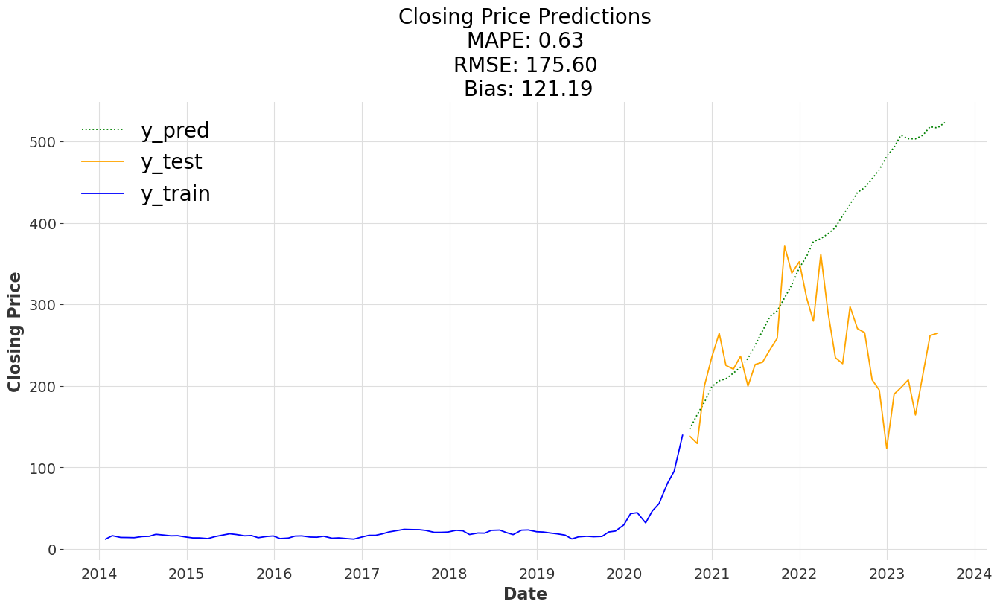

In [237]:
# Plot data.
plt.figure(figsize=(16,8))

plt.plot(forecast_varima_df['Close'], label="y_pred", linestyle ='dotted', color='green')
plt.plot(ticker_mth_hist_df_v2[-35:]['close'], label = 'y_test', color ='orange')
plt.plot(y_train, label = 'y_train', color='blue')

# Find the MAPE (mean abs percentage error) of the predictions
mape = mean_absolute_percentage_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]) # like all sklearn metrics we've used, pass y_actual, y_pred

# Find the RMSE of the predictions
rmse = np.sqrt(mean_squared_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]))

# Calculate the bias
bias = (forecast.values()[:, 0] - ticker_mth_hist_df_v2[-36:]['close'].values).mean()

# Plot labels
plt.xlabel('Date', fontsize=16)
plt.ylabel('Closing Price', fontsize=16)

# Adjust the tick label size on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14) 

plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)
plt.legend(fontsize = 20, loc = 'upper left'); # for legend to be displayed in our plot

**Observations:**
- fine tuned hyperparameters has different parameters from original VARIMA model (Model No. 8)
- the fine tuned hyperparameters yield worse result than original VARIMA model (Model No. 8)

|Model No.| Model Tried                                    	 |MAPE   |RMSE    |Bias   |Remarks           |
|---------|--------------------------------------------------|-------|--------|-------|------------------|
|1        | Linear Regression                                |1.82   |495.81  |-429.38|Predictions of close price can go below $0. Model is not practical    |
|2        | ARIMA                                            |5.83   |1657.03 |1285.04|p=1, d=3, q=3     |
|3        | ARIMAX (with exogenous features)                 |0.75   |224.51  |-120.9 |p=1, d=0, q=0     |
|4        | SARIMAX (with exogenous features & seasonality)  |0.75   |224.51  |-120.9 |p=1, d=0, q=0     |
|5        | Simple Exponential Smoothing                     |2.34   |620.82  |515.1  |Almost a linear prediction, not practical                  |
|6        | Prophet Linear Model                             |0.73   |226.42  |-156.11|Predictions of close price can go below \$0. Model is not practical|
|7        | Prophet Logistic Model                           |1.88   |514.24  |-445.93|Predictions of close price can go below \$0. Model is not practical|
|8        | VARIMA (Vector Autoregressive Integrated Moving Average)|0.22   |62.71  |2.92 |p=1, d=1, q=0, num_samples=1      |
|9        | VARIMA (Vector Autoregressive Integrated Moving Average)|0.32   |109.66  |-78.03 |p=3, d=1, q=3, num_samples=3|
|10       | VARIMA (Vector Autoregressive Integrated Moving Average)|0.23   |66.47 |-19.89 |p=1, d=1, q=3, num_samples=10|
|11       | VARIMA (Vector Autoregressive Integrated Moving Average)|0.63   |175.60 |121.19 |p=1, d=1, q=2, num_samples=3|

**All the grid search tuned hyperparameters have convergence issue and yield less accurate results than the original Model No. 8. VARIMA with p=1, d=1, num_samples=1 is the best model**

## 4.5 Test the best model (VARIMA Model No. 8) on a few other symbols (e.g. APPL, GOOG)

### 4.5.1 VARIMA on 'AAPL'

In [118]:
# Exclude parameters that are lesser than t_minus_6 (i.e. drop t_minus_1, t_minus_2 until t_minus_5)
ticker_mth_hist_df_v2 = ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='AAPL'].drop(columns = ['symbol','currency','high','open','low'])

columns_to_remove = [col for col in ticker_mth_hist_df_v2.columns if re.search(r't_minus_(?!1[0-2]$)[1-5]|t_minus_1$', col)]
ticker_mth_hist_df_v2.drop(columns=columns_to_remove + ['symbol', 'currency'], inplace=True, errors='ignore')

In [119]:
ticker_mth_hist_df_v2.index = ticker_mth_hist_df_v2.index.to_period('M').to_timestamp('M')
ticker_mth_hist_df_v2['date'] = ticker_mth_hist_df_v2.index

In [120]:
# Convert the DataFrame to a Darts TimeSeries with explicit frequency, training data to exclude most recent 3 years i.e. 36 months
# VARIMA only support multivariate parameters, minimally need to have 2 parameters as input
time_series = TimeSeries.from_dataframe(ticker_mth_hist_df_v2[:-35], time_col= 'date', value_cols=['close',
                                                                                                   'close_t_minus_6',
                                                                                                    ],freq = 'M')

# Fit a VARIMA(1,1) model
model = VARIMA(p=1, d=1, trend='c', add_encoders=None)
model.fit(time_series)

# Print model summary
#print(results.summary())

# Forecast the next 36 time steps
forecast = model.predict(36, series=None, future_covariates=None, num_samples=1)
# num_samples parameter determines how many Monte Carlo samples are drawn from the model's predictive distribution

print("Forecast:")
print(forecast)

Forecast:
<TimeSeries (DataArray) (date: 36, component: 2, sample: 1)>
array([[[125.84579257],
        [ 66.7777418 ]],

       [[128.17633922],
        [ 66.84844018]],

       [[129.80982012],
        [ 67.32010678]],

       [[131.24863909],
        [ 67.89772792]],

       [[132.63248771],
        [ 68.50447403]],

       [[134.00073281],
        [ 69.11938341]],

       [[135.36453828],
        [ 69.73660195]],
...
       [[166.69209084],
        [ 83.9533562 ]],

       [[168.05412769],
        [ 84.57149183]],

       [[169.41616454],
        [ 85.18962746]],

       [[170.77820139],
        [ 85.80776308]],

       [[172.14023824],
        [ 86.42589871]],

       [[173.50227509],
        [ 87.04403434]],

       [[174.86431194],
        [ 87.66216996]]])
Coordinates:
  * date       (date) datetime64[ns] 2020-09-30 2020-10-31 ... 2023-08-31
  * component  (component) object 'close' 'close_t_minus_6'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None

In [121]:
forecast.time_index

DatetimeIndex(['2020-09-30', '2020-10-31', '2020-11-30', '2020-12-31',
               '2021-01-31', '2021-02-28', '2021-03-31', '2021-04-30',
               '2021-05-31', '2021-06-30', '2021-07-31', '2021-08-31',
               '2021-09-30', '2021-10-31', '2021-11-30', '2021-12-31',
               '2022-01-31', '2022-02-28', '2022-03-31', '2022-04-30',
               '2022-05-31', '2022-06-30', '2022-07-31', '2022-08-31',
               '2022-09-30', '2022-10-31', '2022-11-30', '2022-12-31',
               '2023-01-31', '2023-02-28', '2023-03-31', '2023-04-30',
               '2023-05-31', '2023-06-30', '2023-07-31', '2023-08-31'],
              dtype='datetime64[ns]', name='date', freq='M')

In [122]:
forecast.columns

Index(['close', 'close_t_minus_6'], dtype='object', name='component')

In [123]:
forecast.values()

array([[125.84579257,  66.7777418 ],
       [128.17633922,  66.84844018],
       [129.80982012,  67.32010678],
       [131.24863909,  67.89772792],
       [132.63248771,  68.50447403],
       [134.00073281,  69.11938341],
       [135.36453828,  69.73660195],
       [136.72707917,  70.35447647],
       [138.0892597 ,  70.9725377 ],
       [139.45133751,  71.59065212],
       [140.81338604,  72.20878171],
       [142.17542622,  72.82691561],
       [143.53746402,  73.44505075],
       [144.89950114,  74.06318623],
       [146.26153806,  74.68132182],
       [147.62357494,  75.29945743],
       [148.98561179,  75.91759306],
       [150.34764864,  76.53572868],
       [151.70968549,  77.15386431],
       [153.07172234,  77.77199994],
       [154.43375919,  78.39013556],
       [155.79579604,  79.00827119],
       [157.15783289,  79.62640682],
       [158.51986974,  80.24454244],
       [159.88190659,  80.86267807],
       [161.24394344,  81.4808137 ],
       [162.60598029,  82.09894932],
 

In [124]:
data = {
    'Datetime': forecast.time_index,
    'Close': forecast.values()[:, 0],
    'close_t_minus_6': forecast.values()[:, 1]
}

forecast_varima_df = pd.DataFrame(data)

In [125]:
forecast_varima_df.head()

,Datetime,Close,close_t_minus_6
0,2020-09-30,125.845793,66.777742
1,2020-10-31,128.176339,66.848440
2,2020-11-30,129.809820,67.320107
3,2020-12-31,131.248639,67.897728
4,2021-01-31,132.632488,68.504474


In [126]:
# Copy the 'Date' column to index
forecast_varima_df.set_index('Datetime', inplace=True)

In [127]:
ticker_mth_hist_df_v2[-36:]['close'].values

array([120.96   , 113.02   , 108.86   , 122.25   , 132.69   , 131.96001,
       121.26   , 123.     , 131.46001, 125.89   , 139.96001, 145.86   ,
       154.3    , 142.64999, 149.8    , 161.84   , 177.57001, 172.39   ,
       163.17   , 174.31   , 157.64999, 145.38   , 138.92999, 162.50999,
       155.81   , 138.2    , 138.38   , 147.81   , 129.92999, 154.5    ,
       151.03   , 164.89999, 169.67999, 180.95   , 193.97   , 193.52   ])

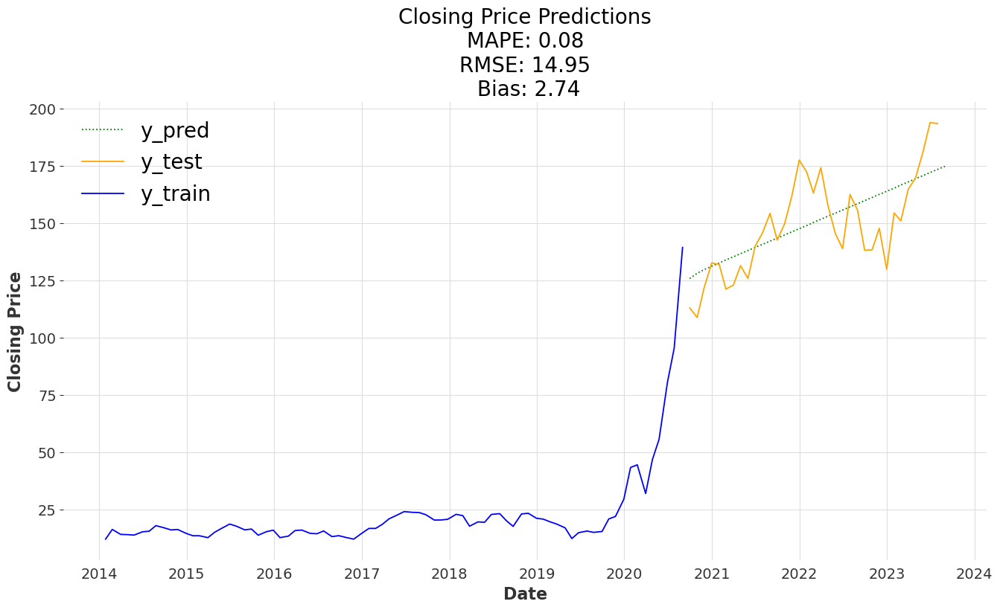

In [128]:
# Plot data.
plt.figure(figsize=(16,8))

plt.plot(forecast_varima_df['Close'], label="y_pred", linestyle ='dotted', color='green')
plt.plot(ticker_mth_hist_df_v2[-35:]['close'], label = 'y_test', color ='orange')
plt.plot(y_train, label = 'y_train', color='blue')

# Find the MAPE (mean abs percentage error) of the predictions
mape = mean_absolute_percentage_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]) # like all sklearn metrics we've used, pass y_actual, y_pred

# Find the RMSE of the predictions
rmse = np.sqrt(mean_squared_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]))

# Calculate the bias
bias = (forecast.values()[:, 0] - ticker_mth_hist_df_v2[-36:]['close'].values).mean()

# Plot labels
plt.xlabel('Date', fontsize=16)
plt.ylabel('Closing Price', fontsize=16)

# Adjust the tick label size on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14) 

plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)
plt.legend(fontsize = 20, loc = 'upper left'); # for legend to be displayed in our plot

### 4.5.2 VARIMA on 'GOOG'

In [129]:
# Exclude parameters that are lesser than t_minus_6 (i.e. drop t_minus_1, t_minus_2 until t_minus_5)
ticker_mth_hist_df_v2 = ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='GOOG'].drop(columns = ['symbol','currency','high','open','low'])

columns_to_remove = [col for col in ticker_mth_hist_df_v2.columns if re.search(r't_minus_(?!1[0-2]$)[1-5]|t_minus_1$', col)]
ticker_mth_hist_df_v2.drop(columns=columns_to_remove + ['symbol', 'currency'], inplace=True, errors='ignore')

In [130]:
ticker_mth_hist_df_v2.index = ticker_mth_hist_df_v2.index.to_period('M').to_timestamp('M')
ticker_mth_hist_df_v2['date'] = ticker_mth_hist_df_v2.index

In [131]:
# Convert the DataFrame to a Darts TimeSeries with explicit frequency, training data to exclude most recent 3 years i.e. 36 months
# VARIMA only support multivariate parameters, minimally need to have 2 parameters as input
time_series = TimeSeries.from_dataframe(ticker_mth_hist_df_v2[:-35], time_col= 'date', value_cols=['close',
                                                                                                   'close_t_minus_6',
                                                                                                    ],freq = 'M')

# Fit a VARIMA(1,1) model
model = VARIMA(p=1, d=1, trend='c', add_encoders=None)
model.fit(time_series)

# Print model summary
#print(results.summary())

# Forecast the next 36 time steps
forecast = model.predict(36, series=None, future_covariates=None, num_samples=1)
# num_samples parameter determines how many Monte Carlo samples are drawn from the model's predictive distribution

print("Forecast:")
print(forecast)

Forecast:
<TimeSeries (DataArray) (date: 36, component: 2, sample: 1)>
array([[[ 79.1897528 ],
        [ 67.43061685]],

       [[ 79.86871249],
        [ 68.10054415]],

       [[ 80.50531949],
        [ 68.6520078 ]],

       [[ 81.12974936],
        [ 69.21603049]],

       [[ 81.75657402],
        [ 69.7803856 ]],

       [[ 82.38328212],
        [ 70.34447826]],

       [[ 83.00996475],
        [ 70.90860101]],
...
       [[ 97.42378388],
        [ 83.88342293]],

       [[ 98.05047165],
        [ 84.4475456 ]],

       [[ 98.67715942],
        [ 85.01166828]],

       [[ 99.30384719],
        [ 85.57579095]],

       [[ 99.93053496],
        [ 86.13991362]],

       [[100.55722274],
        [ 86.70403629]],

       [[101.18391051],
        [ 87.26815897]]])
Coordinates:
  * date       (date) datetime64[ns] 2020-09-30 2020-10-31 ... 2023-08-31
  * component  (component) object 'close' 'close_t_minus_6'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None

In [132]:
forecast.time_index

DatetimeIndex(['2020-09-30', '2020-10-31', '2020-11-30', '2020-12-31',
               '2021-01-31', '2021-02-28', '2021-03-31', '2021-04-30',
               '2021-05-31', '2021-06-30', '2021-07-31', '2021-08-31',
               '2021-09-30', '2021-10-31', '2021-11-30', '2021-12-31',
               '2022-01-31', '2022-02-28', '2022-03-31', '2022-04-30',
               '2022-05-31', '2022-06-30', '2022-07-31', '2022-08-31',
               '2022-09-30', '2022-10-31', '2022-11-30', '2022-12-31',
               '2023-01-31', '2023-02-28', '2023-03-31', '2023-04-30',
               '2023-05-31', '2023-06-30', '2023-07-31', '2023-08-31'],
              dtype='datetime64[ns]', name='date', freq='M')

In [133]:
forecast.columns

Index(['close', 'close_t_minus_6'], dtype='object', name='component')

In [134]:
forecast.values()

array([[ 79.1897528 ,  67.43061685],
       [ 79.86871249,  68.10054415],
       [ 80.50531949,  68.6520078 ],
       [ 81.12974936,  69.21603049],
       [ 81.75657402,  69.7803856 ],
       [ 82.38328212,  70.34447826],
       [ 83.00996475,  70.90860101],
       [ 83.63665287,  71.47272419],
       [ 84.26334069,  72.03684679],
       [ 84.89002845,  72.60096947],
       [ 85.51671622,  73.16509214],
       [ 86.14340399,  73.72921482],
       [ 86.77009176,  74.29333749],
       [ 87.39677953,  74.85746016],
       [ 88.0234673 ,  75.42158283],
       [ 88.65015508,  75.98570551],
       [ 89.27684285,  76.54982818],
       [ 89.90353062,  77.11395085],
       [ 90.53021839,  77.67807353],
       [ 91.15690616,  78.2421962 ],
       [ 91.78359393,  78.80631887],
       [ 92.41028171,  79.37044155],
       [ 93.03696948,  79.93456422],
       [ 93.66365725,  80.49868689],
       [ 94.29034502,  81.06280956],
       [ 94.91703279,  81.62693224],
       [ 95.54372056,  82.19105491],
 

In [135]:
data = {
    'Datetime': forecast.time_index,
    'Close': forecast.values()[:, 0],
    'close_t_minus_6': forecast.values()[:, 1]
}

forecast_varima_df = pd.DataFrame(data)

In [136]:
forecast_varima_df.head()

,Datetime,Close,close_t_minus_6
0,2020-09-30,79.189753,67.430617
1,2020-10-31,79.868712,68.100544
2,2020-11-30,80.505319,68.652008
3,2020-12-31,81.129749,69.216030
4,2021-01-31,81.756574,69.780386


In [137]:
# Copy the 'Date' column to index
forecast_varima_df.set_index('Datetime', inplace=True)

In [138]:
ticker_mth_hist_df_v2[-36:]['close'].values

array([ 79.55   ,  72.92   ,  81.05   ,  91.4    ,  87.59   ,  91.79   ,
       101.84   , 106.89   , 120.51   , 122.59   , 128.72   , 135.22   ,
       144.78   , 136.46001, 148.27   , 142.52   , 144.67999, 143.02   ,
       132.12   , 140.7    , 114.97   , 114.56   , 109.08   , 116.64   ,
       108.68   ,  96.15   ,  86.7    , 100.83   ,  88.73   , 105.22   ,
        94.02   , 104.     , 108.22   , 125.23   , 120.97   , 129.50011])

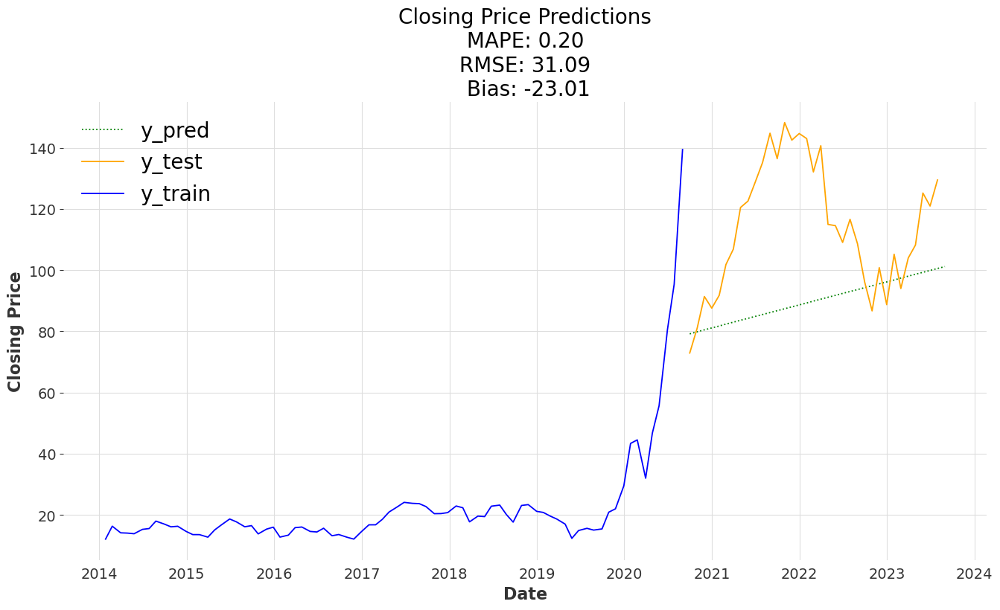

In [139]:
# Plot data.
plt.figure(figsize=(16,8))

plt.plot(forecast_varima_df['Close'], label="y_pred", linestyle ='dotted', color='green')
plt.plot(ticker_mth_hist_df_v2[-35:]['close'], label = 'y_test', color ='orange')
plt.plot(y_train, label = 'y_train', color='blue')

# Find the MAPE (mean abs percentage error) of the predictions
mape = mean_absolute_percentage_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]) # like all sklearn metrics we've used, pass y_actual, y_pred

# Find the RMSE of the predictions
rmse = np.sqrt(mean_squared_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]))

# Calculate the bias
bias = (forecast.values()[:, 0] - ticker_mth_hist_df_v2[-36:]['close'].values).mean()

# Plot labels
plt.xlabel('Date', fontsize=16)
plt.ylabel('Closing Price', fontsize=16)

# Adjust the tick label size on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14) 

plt.title(label = f'Closing Price Predictions\n MAPE: {mape:.2f} \n RMSE: {rmse:.2f} \n Bias: {bias:.2f}', fontsize=20)
plt.legend(fontsize = 20, loc = 'upper left'); # for legend to be displayed in our plot

|Symbol   |MAPE   |RMSE    |Bias   |
|---------|-------|--------|-------|
|TSLA     |0.22   |62.71   |2.92   |
|AAPL     |0.08   |14.95   |2.74   |
|GOOG     |0.20   |31.09   |-23.01 |

**Observations:**
- VARIMA model on APPL yield better overall result than TSLA, with super low MAPE
- VARIMA model GOOG yield similar result as TSLA but has quite a negative forecast bias which means that the predicted price tends to be much lower than actual price

## 4.6 Generate forecast for all NASDAQ stocks

In [140]:
# Initialize DataFrames to store forecasts and skipped symbols
all_forecasts = pd.DataFrame()
skipped_symbols = []

# Convert the index to datetime format
ticker_mth_hist_df.index = pd.to_datetime(ticker_mth_hist_df.index)

# Loop through unique symbols
for symbol in ticker_mth_hist_df['symbol'].unique():
    # Extract data for the current symbol
    ticker_mth_hist_df_v2 = ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol'] == symbol]
    
    # Exclude columns related to t_minus_1 to t_minus_5
    ticker_mth_hist_df_v2 = ticker_mth_hist_df_v2.drop(columns = ['symbol','currency','high','open','low'])
    columns_to_remove = [col for col in ticker_mth_hist_df_v2.columns if re.search(r't_minus_(?!1[0-2]$)[1-5]|t_minus_1$', col)]
    ticker_mth_hist_df_v2.drop(columns=columns_to_remove + ['symbol', 'currency'], inplace=True, errors='ignore')
    
    # Set the index and create a 'date' column
    ticker_mth_hist_df_v2.index = ticker_mth_hist_df_v2.index.to_period('M').to_timestamp('M')
    ticker_mth_hist_df_v2['date'] = ticker_mth_hist_df_v2.index
    
    # Convert the DataFrame to a Darts TimeSeries with explicit frequency
    # Training data to exclude most recent 3 years i.e. 36 months
    # VARIMA only support multivariate parameters, minimally need to have 2 parameters as input
    time_series = TimeSeries.from_dataframe(ticker_mth_hist_df_v2[:-35], time_col='date', value_cols=['close', 'close_t_minus_6'], fill_missing_dates=True, freq='M')
    
    # Fit the VARIMA model with earlier finetuned hyperparameters
    model = VARIMA(p=1, d=1, trend='c', add_encoders=None)
    try: 
        model.fit(time_series)
        # Forecast the next 36 time steps
        # num_samples parameter determines how many Monte Carlo samples are drawn from the model's predictive distribution
        forecast = model.predict(36, series=None, future_covariates=None, num_samples=1)
        
        # Find the MAPE (mean abs percentage error) of the predictions
        mape = mean_absolute_percentage_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]) # like all sklearn metrics we've used, pass y_actual, y_pred

        # Find the RMSE of the predictions
        rmse = np.sqrt(mean_squared_error(ticker_mth_hist_df_v2[-36:]['close'].values, forecast.values()[:, 0]))

        # Calculate the bias
        bias = (forecast.values()[:, 0] - ticker_mth_hist_df_v2[-36:]['close'].values).mean()

        # Store the forecast and metrics in the all_forecasts DataFrame
        forecast_df = forecast.pd_dataframe()
        forecast_df['symbol'] = symbol
        forecast_df['date'] = forecast_df.index
        forecast_df['mape'] = mape
        forecast_df['rmse'] = rmse
        forecast_df['bias'] = bias
        
        # Reset index to create a new default integer index
        forecast_df.reset_index(drop=True, inplace=True)
        all_forecasts = pd.concat([all_forecasts, forecast_df],axis=0)
    
    except Exception as e:
        skipped_symbols.append(symbol)

# Create a DataFrame of skipped symbols
skipped_symbols_df = pd.DataFrame({'symbol': skipped_symbols})

ValueError: The time index of the provided DataArray is missing the freq attribute, and the frequency could not be directly inferred. This probably comes from inconsistent date frequencies with missing dates. If you know the actual frequency, try setting `fill_missing_dates=True, freq=actual_frequency`. If not, try setting `fill_missing_dates=True, freq=None` to see if a frequency can be inferred.
ValueError: The time index of the provided DataArray is missing the freq attribute, and the frequency could not be directly inferred. This probably comes from inconsistent date frequencies with missing dates. If you know the actual frequency, try setting `fill_missing_dates=True, freq=actual_frequency`. If not, try setting `fill_missing_dates=True, freq=None` to see if a frequency can be inferred.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn(

ValueError: The time index of the provided DataArray is missing the freq attribute, and the frequency could not be directly inferred. This probably comes from inconsistent date frequencies with missing dates. If you know the actual frequency, try setting `fill_missing_dates=True, freq=actual_frequency`. If not, try setting `fill_missing_dates=True, freq=None` to see if a frequency can be inferred.
ValueError: The time index of the provided DataArray is missing the freq attribute, and the frequency could not be directly inferred. This probably comes from inconsistent date frequencies with missing dates. If you know the actual frequency, try setting `fill_missing_dates=True, freq=actual_frequency`. If not, try setting `fill_missing_dates=True, freq=None` to see if a frequency can be inferred.
ValueError: The time index of the provided DataArray is missing the freq attribute, and the frequency could not be directly inferred. This probably comes from inconsistent date frequencies with miss

ValueError: The time index of the provided DataArray is missing the freq attribute, and the frequency could not be directly inferred. This probably comes from inconsistent date frequencies with missing dates. If you know the actual frequency, try setting `fill_missing_dates=True, freq=actual_frequency`. If not, try setting `fill_missing_dates=True, freq=None` to see if a frequency can be inferred.
ValueError: The time index of the provided DataArray is missing the freq attribute, and the frequency could not be directly inferred. This probably comes from inconsistent date frequencies with missing dates. If you know the actual frequency, try setting `fill_missing_dates=True, freq=actual_frequency`. If not, try setting `fill_missing_dates=True, freq=None` to see if a frequency can be inferred.
ValueError: The time index of the provided DataArray is missing the freq attribute, and the frequency could not be directly inferred. This probably comes from inconsistent date frequencies with miss

ValueError: The time index of the provided DataArray is missing the freq attribute, and the frequency could not be directly inferred. This probably comes from inconsistent date frequencies with missing dates. If you know the actual frequency, try setting `fill_missing_dates=True, freq=actual_frequency`. If not, try setting `fill_missing_dates=True, freq=None` to see if a frequency can be inferred.
ValueError: Train series only contains 1 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: The time index of the provided DataArray is missing the freq attribute, and the frequency could not be directly inferred. This probably comes from inconsistent date frequencies with missing dates. If you know the actual frequency, try setting `fill_missing_dates=True, freq=actual_frequency`. If not, try setting `fill_missing_dates=True, freq=None` to see if a frequency can be inferred.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:6

ValueError: The time index of the provided DataArray is missing the freq attribute, and the frequency could not be directly inferred. This probably comes from inconsistent date frequencies with missing dates. If you know the actual frequency, try setting `fill_missing_dates=True, freq=actual_frequency`. If not, try setting `fill_missing_dates=True, freq=None` to see if a frequency can be inferred.
C:\Users\simyu\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
ValueError: The time index of the provided DataArray is missing the freq attribute, and the frequency could not be directly inferred. This probably comes from inconsistent date frequencies with missing dates. If you know the actual frequency, try setting `fill_missing_dates=True, freq=actual_frequency`. If not, try setting `fill_missing_dates=True, freq=

ValueError: Train series only contains 28 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 28 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 28 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 28 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 28 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 28 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 28 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 28 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 27 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
V

ValueError: Train series only contains 24 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 24 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 24 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 24 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 23 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 23 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 23 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 23 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 23 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
V

ValueError: Train series only contains 20 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 20 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 20 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 20 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 17 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 0 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 20 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 15 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 19 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
Va

ValueError: Train series only contains 16 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 16 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 16 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 16 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 16 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 16 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 16 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 16 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 16 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
V

ValueError: Train series only contains 13 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 13 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 13 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 13 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 13 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 13 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 12 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 12 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 12 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
V

ValueError: Train series only contains 8 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 8 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 8 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 8 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 8 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 8 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 7 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 7 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 7 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError

ValueError: Train series only contains 4 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 4 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 4 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 4 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 4 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 4 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 4 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 3 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError: Train series only contains 3 elements but VARIMA(d=1, trend=c) model requires at least 30 entries
ValueError

In [141]:
all_forecasts.head(3)

component,close,close_t_minus_6,symbol,date,mape,rmse,bias
0,1.094805,0.979898,AACG,2020-09-30,0.711724,1.6785,-1.413959
1,1.063757,0.933919,AACG,2020-10-31,0.711724,1.6785,-1.413959
2,1.027139,0.884608,AACG,2020-11-30,0.711724,1.6785,-1.413959


**Observations:**
- **forecast starts from 2020-09-30**

In [142]:
# check number of unique symbols forecasted
all_forecasts['symbol'].nunique()

2220

In [143]:
# check number of unique symbols in the monthly historical data
ticker_mth_hist_df['symbol'].nunique()

4330

In [144]:
# number of unique symbols not forecasted
len(skipped_symbols_df)

2110

In [145]:
skipped_symbols_df.head(3)

,symbol
0,ABST
1,ABVC
2,AIMD


In [146]:
# To sample check if there is missing date for symbol that was skipped in the VARIMA modelling
ticker_mth_hist_df.loc[ticker_mth_hist_df['symbol']=='ABST']

,open,high,low,close,volume,symbol,currency,date,year,month,day,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12
datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-01-27,6.52000,6.60000,6.36000,6.36000,22600.0,ABST,USD,2014-01-27,2014,1,27,6.45000,6.58000,6.97000,7.24000,6.55000,7.06000,6.50000,6.90000,6.67000,5.30000,5.18000,5.46000,6.43000,6.63000,7.33000,7.00000,6.84000,6.84000,6.44000,6.86000,6.57000,5.30000,5.27000,5.54000,6.50000,6.67000,7.33000,7.24000,6.84000,7.10000,6.50000,7.00000,7.01000,5.35000,5.27000,5.54000,6.42000,6.55000,6.97000,7.00000,6.55000,6.81000,6.44000,6.86000,6.50000,5.27000,5.18000,5.46000,8100.0,29800.0,4400.0,28000.0,36400.0,104500.0,600.0,5200.0,33800.0,8800.0,100.0,3800.0
2014-02-24,6.22000,6.27000,6.19000,6.26000,16700.0,ABST,USD,2014-02-24,2014,2,24,6.36000,6.45000,6.58000,6.97000,7.24000,6.55000,7.06000,6.50000,6.90000,6.67000,5.30000,5.18000,6.52000,6.43000,6.63000,7.33000,7.00000,6.84000,6.84000,6.44000,6.86000,6.57000,5.30000,5.27000,6.60000,6.50000,6.67000,7.33000,7.24000,6.84000,7.10000,6.50000,7.00000,7.01000,5.35000,5.27000,6.36000,6.42000,6.55000,6.97000,7.00000,6.55000,6.81000,6.44000,6.86000,6.50000,5.27000,5.18000,22600.0,8100.0,29800.0,4400.0,28000.0,36400.0,104500.0,600.0,5200.0,33800.0,8800.0,100.0
2014-03-31,6.35000,6.35000,6.35000,6.35000,200.0,ABST,USD,2014-03-31,2014,3,31,6.26000,6.36000,6.45000,6.58000,6.97000,7.24000,6.55000,7.06000,6.50000,6.90000,6.67000,5.30000,6.22000,6.52000,6.43000,6.63000,7.33000,7.00000,6.84000,6.84000,6.44000,6.86000,6.57000,5.30000,6.27000,6.60000,6.50000,6.67000,7.33000,7.24000,6.84000,7.10000,6.50000,7.00000,7.01000,5.35000,6.19000,6.36000,6.42000,6.55000,6.97000,7.00000,6.55000,6.81000,6.44000,6.86000,6.50000,5.27000,16700.0,22600.0,8100.0,29800.0,4400.0,28000.0,36400.0,104500.0,600.0,5200.0,33800.0,8800.0
2014-04-28,6.30000,6.30000,6.13000,6.13000,1600.0,ABST,USD,2014-04-28,2014,4,28,6.35000,6.26000,6.36000,6.45000,6.58000,6.97000,7.24000,6.55000,7.06000,6.50000,6.90000,6.67000,6.35000,6.22000,6.52000,6.43000,6.63000,7.33000,7.00000,6.84000,6.84000,6.44000,6.86000,6.57000,6.35000,6.27000,6.60000,6.50000,6.67000,7.33000,7.24000,6.84000,7.10000,6.50000,7.00000,7.01000,6.35000,6.19000,6.36000,6.42000,6.55000,6.97000,7.00000,6.55000,6.81000,6.44000,6.86000,6.50000,200.0,16700.0,22600.0,8100.0,29800.0,4400.0,28000.0,36400.0,104500.0,600.0,5200.0,33800.0
2014-05-26,6.22000,6.22000,5.99000,6.01000,2700.0,ABST,USD,2014-05-26,2014,5,26,6.13000,6.35000,6.26000,6.36000,6.45000,6.58000,6.97000,7.24000,6.55000,7.06000,6.50000,6.90000,6.30000,6.35000,6.22000,6.52000,6.43000,6.63000,7.33000,7.00000,6.84000,6.84000,6.44000,6.86000,6.30000,6.35000,6.27000,6.60000,6.50000,6.67000,7.33000,7.24000,6.84000,7.10000,6.50000,7.00000,6.13000,6.35000,6.19000,6.36000,6.42000,6.55000,6.97000,7.00000,6.55000,6.81000,6.44000,6.86000,1600.0,200.0,16700.0,22600.0,8100.0,29800.0,4400.0,28000.0,36400.0,104500.0,600.0,5200.0
2014-06-30,6.45000,6.60000,6.42000,6.60000,34800.0,ABST,USD,2014-06-30,2014,6,30,6.01000,6.13000,6.35000,6.26000,6.36000,6.45000,6.58000,6.97000,7.24

**Observations:**
- 2220 symbols fit the VARIMA model while the other 2110 stocks have missing dates (e.g. symbol 'ABST' is missing Jan 2019 data) and hence result in error when fitting
- This means that with the current data, we can only proceed to predict whether to 'buy' for the 2220 symbols that fit the VARIMA model successfully

**Proceed with classification model for the 2220 symbols**

## 4.7 Prepare for forecast analysis

### 4.7.1 Combine the 'all_forecasts' prediction dataframe with actual 'ticker_mth_hist_df'

In [147]:
# Drop 'close_t_minus_6' column
all_forecasts.drop(columns=['close_t_minus_6'], inplace=True)

In [148]:
# Rename this predicted close price column header to avoid confusion with actual close price
all_forecasts.rename(columns={'close': 'close_pred'}, inplace=True)
all_forecasts.head(3)

component,close_pred,symbol,date,mape,rmse,bias
0,1.094805,AACG,2020-09-30,0.711724,1.6785,-1.413959
1,1.063757,AACG,2020-10-31,0.711724,1.6785,-1.413959
2,1.027139,AACG,2020-11-30,0.711724,1.6785,-1.413959


In [149]:
# As the VARIMA modelling uses end of month's date as inputs, the dates was previously adjusted to month end for modelling.
# These month-end dates will not be able to align with the actual last date of close price in the 'ticker_mth_hist__df'
# Hence, need to create 'year' and 'month' columns for concatenation of dataframes subsequently
all_forecasts['year'] = all_forecasts['date'].dt.year
all_forecasts['month'] = all_forecasts['date'].dt.month

# Drop 'close_t_minus_6' column because forecast for this is not needed as the actual close price is already known
all_forecasts.drop(columns=['date'], inplace=True)
all_forecasts.head(3)

component,close_pred,symbol,mape,rmse,bias,year,month
0,1.094805,AACG,0.711724,1.6785,-1.413959,2020,9
1,1.063757,AACG,0.711724,1.6785,-1.413959,2020,10
2,1.027139,AACG,0.711724,1.6785,-1.413959,2020,11


In [150]:
# Concatenate the DataFrames based on 'year', 'month' and 'symbol' columns
ticker_mth_hist_pred_df = pd.concat([all_forecasts.set_index(['year', 'month', 'symbol']),
                       ticker_mth_hist_df.set_index(['year', 'month', 'symbol'])],
                      axis=1, join='outer').reset_index()

In [151]:
ticker_mth_hist_pred_df.head(3)

,year,month,symbol,close_pred,mape,rmse,bias,open,high,low,close,volume,currency,date,day,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12
0,2020,9,AACG,1.094805,0.711724,1.6785,-1.413959,1.15,1.21,1.08,1.10,358400.0,USD,2020-09-28,28.0,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.68,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.67,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.69,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,1.46,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0,56400.0
1,2020,10,AACG,1.063757,0.711724,1.6785,-1.413959,1.23,1.23,1.08,1.09,188100.0,USD,2020-10-26,26.0,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0
2,2020,11,AACG,1.027139,0.711724,1.6785,-1.413959,1.24,1.24,1.15,1.18,188300.0,USD,2020-11-30,30.0,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0


In [152]:
# check for null values in date before using date as the index of dataframe
ticker_mth_hist_pred_df[ticker_mth_hist_pred_df['date'].isna()]

,year,month,symbol,close_pred,mape,rmse,bias,open,high,low,close,volume,currency,date,day,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12
35,2023,8,AACG,-1.791312e-01,7.117243e-01,1.678500e+00,-1.413959e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
71,2023,8,AAL,4.128384e+00,4.791193e-01,8.868020e+00,-8.121659e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
107,2023,8,AAME,1.097361e+00,4.420183e-01,1.601101e+00,-1.397156e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
143,2023,8,AAON,7.395537e+01,1.458556e-01,1.310703e+01,-4.534353e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
179,2023,8,AAPL,1.748643e+02,8.403879e-02,1.495216e+01,2.744616e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
215,2023,8,ABCB,2.699508e+01,3.886776e-01,1.983197e+01,-1.813109e+01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
251,2023,8,ABEO,-1.321720e+02,1.436345e+01,7.506939e+01,-6.553389e+01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
287,2023,8,ABIO,-1.050937e+02,2.375690e+01,6.281727e+01,-5.473966e+01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
323,2023,8,ABUS,-2.949988e+00,1.153222e+00,3.511277e+00,-3.237336e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [153]:
# create a new column for updating the date that are NaN
ticker_mth_hist_pred_df['year-month'] = ticker_mth_hist_pred_df['year'].astype(str) + '-' + ticker_mth_hist_pred_df['month'].astype(str).str.zfill(2) + '-01'

In [154]:
# Fill NaN values in 'date' with values from 'year-month'
ticker_mth_hist_pred_df['date'].fillna(ticker_mth_hist_pred_df['year-month'], inplace=True)

In [155]:
# check for NaN values in 'date'
ticker_mth_hist_pred_df[ticker_mth_hist_pred_df['date'].isna()]

,year,month,symbol,close_pred,mape,rmse,bias,open,high,low,close,volume,currency,date,day,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12,year-month


**Observations:**
- no more NaN in 'date' column

In [156]:
# Set original month-end transaction date as the index
ticker_mth_hist_pred_df.set_index('date', inplace=True)

# Convert the index to datetime
ticker_mth_hist_pred_df.index = pd.to_datetime(ticker_mth_hist_pred_df.index)

ticker_mth_hist_pred_df.head(3)

,year,month,symbol,close_pred,mape,rmse,bias,open,high,low,close,volume,currency,day,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12,year-month
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-28,2020,9,AACG,1.094805,0.711724,1.6785,-1.413959,1.15,1.21,1.08,1.10,358400.0,USD,28.0,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.68,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.67,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.69,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,1.46,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0,56400.0,2020-09-01
2020-10-26,2020,10,AACG,1.063757,0.711724,1.6785,-1.413959,1.23,1.23,1.08,1.09,188100.0,USD,26.0,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0,2020-10-01
2020-11-30,2020,11,AACG,1.027139,0.711724,1.6785,-1.413959,1.24,1.24,1.15,1.18,188300.0,USD,30.0,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,2020-11-01


In [157]:
ticker_mth_hist_df['date'].unique()

array(['2014-01-27', '2014-02-24', '2014-03-31', '2014-04-28',
       '2014-05-26', '2014-06-30', '2014-07-28', '2014-08-25',
       '2014-09-29', '2014-10-27', '2014-11-24', '2014-12-29',
       '2015-01-26', '2015-02-23', '2015-03-30', '2015-04-27',
       '2015-05-25', '2015-06-29', '2015-07-27', '2015-08-31',
       '2015-09-28', '2015-10-26', '2015-11-30', '2015-12-28',
       '2016-01-25', '2016-02-29', '2016-03-28', '2016-04-25',
       '2016-05-30', '2016-06-27', '2016-07-25', '2016-08-29',
       '2016-09-26', '2016-10-31', '2016-11-28', '2016-12-26',
       '2017-01-30', '2017-02-27', '2017-03-27', '2017-04-24',
       '2017-05-29', '2017-06-26', '2017-07-31', '2017-08-28',
       '2017-09-25', '2017-10-30', '2017-11-27', '2017-12-25',
       '2018-01-29', '2018-02-26', '2018-03-26', '2018-04-30',
       '2018-05-28', '2018-06-25', '2018-07-30', '2018-08-27',
       '2018-09-24', '2018-10-29', '2018-11-26', '2018-12-31',
       '2019-01-28', '2019-02-25', '2019-03-25', '2019-

In [158]:
ticker_mth_hist_pred_df.index.unique()

DatetimeIndex(['2020-09-28', '2020-10-26', '2020-11-30', '2020-12-28',
               '2021-01-25', '2021-02-22', '2021-03-29', '2021-04-26',
               '2021-05-31', '2021-06-28',
               ...
               '2016-04-25', '2016-05-30', '2016-06-27', '2016-07-25',
               '2016-08-29', '2016-09-26', '2016-10-31', '2016-11-28',
               '2016-12-26', '2017-01-30'],
              dtype='datetime64[ns]', name='date', length=169, freq=None)

**Remarks:**
- Using data from 2014-01-27 to 2020-08-31, we predicted the closing price for 2020-09-28 onwards

In [159]:
# drop unwanted columns
ticker_mth_hist_pred_df.drop(columns=['year-month','year','month','day'], inplace=True)

In [160]:
ticker_mth_hist_pred_df.head()

,symbol,close_pred,mape,rmse,bias,open,high,low,close,volume,currency,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-28,AACG,1.094805,0.711724,1.6785,-1.413959,1.15,1.21,1.08,1.10,358400.0,USD,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.68,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.67,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.69,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,1.46,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0,56400.0
2020-10-26,AACG,1.063757,0.711724,1.6785,-1.413959,1.23,1.23,1.08,1.09,188100.0,USD,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0
2020-11-30,AACG,1.027139,0.711724,1.6785,-1.413959,1.24,1.24,1.15,1.18,188300.0,USD,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0
2020-12-28,AACG,0.990255,0.711724,1.6785,-1.413959,1.28,1.28,1.16,1.19,243300.0,USD,1.18,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.24,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.24,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.15,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,188300.0,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0
2021-01-25,AACG,0.953611,0.711724,1.6785,-1.413959,1.44,1.46,1.26,1.31,257900.0,USD,1.19,1.18,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.28,1.24,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.28,1.24,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.16,1.15,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,243300.0,188300.0,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0


### 4.7.2 Create column to reflect the close price on or before 2020-08-31

In [161]:
# Create the list of symbols from ticker_mth_hist_pred_df
symbols_list = ticker_mth_hist_pred_df['symbol'].unique()

# Filter for the desired symbols
filtered_df = ticker_mth_hist_df[ticker_mth_hist_df['symbol'].isin(symbols_list)]

# Filter for dates not beyond 2020-08-31
filtered_df = filtered_df[filtered_df['date'] <= '2020-08-31']

# Sort by date in descending order
filtered_df = filtered_df.sort_values(by='date', ascending=False)

# Get the latest 'close' value and date for each symbol
latest_close_values = filtered_df.groupby('symbol').first()[['date', 'close']]

In [162]:
latest_close_values.tail()

,date,close
symbol,,
ZUMZ,2020-08-31,27.29000
ZVRA,2020-08-31,11.28000
ZYME,2020-08-31,31.70000
ZYNE,2020-08-31,3.63000
ZYXI,2020-08-31,13.18182


In [163]:
latest_close_values['date'].unique()

array(['2020-08-31', '2020-06-29', '2018-08-27', '2019-12-30',
       '2020-07-27', '2020-05-25', '2019-10-28', '2017-12-25',
       '2020-01-27', '2020-04-27', '2019-03-25', '2020-02-24',
       '2017-09-25'], dtype=object)

In [164]:
for date in latest_close_values['date'].unique():
    print(f" count of {date} : {len(latest_close_values.loc[latest_close_values['date']==date])} ")

 count of 2020-08-31 : 2828 
 count of 2020-06-29 : 3 
 count of 2018-08-27 : 1 
 count of 2019-12-30 : 2 
 count of 2020-07-27 : 5 
 count of 2020-05-25 : 4 
 count of 2019-10-28 : 1 
 count of 2017-12-25 : 1 
 count of 2020-01-27 : 1 
 count of 2020-04-27 : 3 
 count of 2019-03-25 : 1 
 count of 2020-02-24 : 2 
 count of 2017-09-25 : 1 


**Observations:**
- there are some symbols that only have 'close price' way before 2020-08-31. Not sure why is it so, hence shall drop these outliers in subsequent classification modelling

In [165]:
latest_close_values.loc[latest_close_values['date'] != '2020-08-31']

,date,close
symbol,,
ATMCW,2020-06-29,71.0000
BAERW,2018-08-27,0.8600
BBLG,2019-12-30,300.0000
BEATW,2020-07-27,16.0000
BLDEW,2020-05-25,37.9300
CHK,2020-05-25,13.0100
CMAXW,2019-12-30,30.0500
CMND,2019-10-28,1.1920
CMRAW,2020-05-25,109.5000


In [166]:
latest_close_values.loc[latest_close_values['date'] != '2020-08-31'].index

Index(['ATMCW', 'BAERW', 'BBLG', 'BEATW', 'BLDEW', 'CHK', 'CMAXW', 'CMND',
       'CMRAW', 'COOLW', 'DDI', 'DERM', 'FSBC', 'GSD', 'IMTXW', 'IRAAW',
       'LSEAW', 'MAPSW', 'OXLCZ', 'PTIX', 'RTL', 'SCLX', 'SQLLW', 'TALKW',
       'ZAPP'],
      dtype='object', name='symbol')

In [167]:
symbols_to_drop = latest_close_values.loc[latest_close_values['date'] != '2020-08-31'].index

# Create a boolean mask for the symbols to drop
mask = ~ticker_mth_hist_pred_df['symbol'].isin(symbols_to_drop)

# Apply the mask to the DataFrame
ticker_mth_hist_pred_df = ticker_mth_hist_pred_df[mask]

In [168]:
len(latest_close_values.loc[latest_close_values['date'] != '2020-08-31'].index)

25

In [169]:
# check if 25 symbols were dropped
ticker_mth_hist_pred_df['symbol'].nunique()

4305

**Observations:**
- 25 outlier symbols (without transaction on 2020-08-31) were indeed dropped

In [170]:
latest_close_values_cleaned = latest_close_values.loc[latest_close_values['date'] == '2020-08-31']

In [171]:
latest_close_values_cleaned.head(3)

,date,close
symbol,,
AACG,2020-08-31,1.10
AACIW,2020-08-31,26.16
AADI,2020-08-31,18.30


In [172]:
# create a column 'close_2020_08_31'
ticker_mth_hist_pred_df['close_2020_08_31']=0

In [173]:
# assign the 'close_2020_08_31' value to respective symbols in the ticker_mth_hist_pred_df
for symbol in latest_close_values_cleaned.index:
    value = latest_close_values_cleaned.loc[symbol, 'close']
    ticker_mth_hist_pred_df.loc[ticker_mth_hist_pred_df['symbol'] == symbol, 'close_2020_08_31'] = value

In [174]:
# check for zero values in 'close_2020_08_31'
# the symbols that have zero values means they were not found in the latest_close_values_cleaned dataframe and hence should be dropped
ticker_mth_hist_pred_df.loc[ticker_mth_hist_pred_df['close_2020_08_31']==0].head()

,symbol,close_pred,mape,rmse,bias,open,high,low,close,volume,currency,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12,close_2020_08_31
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-28,AGNCO,NaN,NaN,NaN,NaN,23.4300,23.50,22.5900,22.7800,236000.0,USD,23.4500,22.720,21.5500,22.35,22.220,18.2600,24.71,25.95,25.820,25.580,25.5500,25.1100,23.4630,22.500,22.0700,22.200,21.5900,20.1900,25.89,25.966,25.51,25.643,25.370,24.9400,23.5700,22.850,22.1380,22.5400,22.700,20.44,25.94,26.03,25.89,25.80,25.820,25.20,23.2400,22.5000,21.3700,22.2000,21.4100,16.7900,24.710,25.760,25.510,25.550,25.250,24.9200,291500.0,194900.0,428100.0,97800.0,483400.0,1898900.0,526800.0,336700.0,137300.0,427800.0,2874200.0,3326100.0,0.0
2020-09-28,APRE,NaN,NaN,NaN,NaN,23.7600,27.14,21.5800,25.0600,413322.0,USD,25.7400,27.430,36.6000,26.86,31.100,30.9900,34.30,38.34,41.000,25.180,24.9700,19.0700,27.1700,26.060,38.3800,30.110,33.7900,35.1500,33.88,37.950,49.98,25.570,24.500,15.4600,28.0671,28.340,40.2200,30.4900,34.570,38.01,37.00,38.97,53.11,26.96,25.770,21.00,24.1200,26.0300,35.8300,24.9400,30.3495,30.1300,31.670,34.000,40.760,21.870,22.690,15.1000,337092.0,371568.0,331861.0,768025.0,182656.0,288466.0,355446.0,454024.0,439257.0,340062.0,325825.0,3897792.0,0.0
2020-09-28,BSCT,NaN,NaN,NaN,NaN,21.4008,21.50,21.3958,21.4746,35616.0,USD,21.5239,21.795,21.3608,20.95,20.110,20.1750,20.82,20.58,20.280,20.170,20.2200,20.0675,21.4900,21.750,21.2883,20.710,20.2581,19.1100,20.71,20.457,20.14,20.173,20.099,20.3000,21.6000,21.880,21.4200,20.9649,20.300,20.30,20.82,20.58,20.32,20.23,20.270,20.31,21.4500,21.7000,21.2821,20.6865,20.0686,19.0800,20.610,20.433,20.120,20.165,20.065,20.0675,53995.0,63068.0,11172.0,34782.0,28190.0,25780.0,38400.0,84100.0,46500.0,8000.0,31091.0,3259.0,0.0
2020-09-28,BSJR,NaN,NaN,NaN,NaN,24.6150,24.90,24.6045,24.8400,32079.0,USD,24.7500,24.895,23.7400,24.35,22.755,23.5261,25.20,25.30,25.482,25.158,25.2152,25.0715,24.7969,24.790,23.6000,23.510,22.2200,21.6099,25.28,25.240,25.46,25.100,25.217,24.9395,24.7969,24.945,23.7999,24.4700,22.755,24.36,25.34,25.48,25.50,25.21,25.217,25.11,24.6431,24.7591,23.4800,23.5067,22.2200,21.4759,24.665,25.178,25.407,25.086,25.100,24.8545,7401.0,5685.0,42591.0,206540.0,16649.0,466694.0,121600.0,101500.0,32400.0,259300.0,18837.0,10023.0,0.0
2020-09-28,BSMN,NaN,NaN,NaN,NaN,25.6000,25.61,25.5600,25.5700,23400.0,USD,25.5700,25.580,25.4370,25.32,24.800,24.7050,25.33,25.29,25.145,25.060,25.1000,25.0600,25.5400,25.605,25.4900,25.338,24.9400,25.0000,25.37,25.290,25.13,25.050,25.005,25.0600,25.5930,25.650,25.5100,25.3800,24.960,25.07,25.42,25.31,25.15,25.06,25.100,25.06,25.4810,25.5600,25.3830,25.1800,24.6900,24.4700,25.300,25.275,25.090,25.050,25.005,25.0600,10200.0,6300.0,18000.0,22300.0,6800.0,9000.0,11100.0,7900.0,10500.0,16800.0,9600.0,300.0,0.0


In [175]:
# check number of symbols to be dropped from ticker_mth_hist_pred_df for classification modelling
len(ticker_mth_hist_pred_df.loc[ticker_mth_hist_pred_df['close_2020_08_31']==0]['symbol'].unique())

1477

In [176]:
# before dropping, check number of unique symbols in ticker_mth_hist_pred_df
len(ticker_mth_hist_pred_df['symbol'].unique())

4305

In [177]:
symbols_to_drop = ticker_mth_hist_pred_df.loc[ticker_mth_hist_pred_df['close_2020_08_31']==0]['symbol'].unique()

# Create a boolean mask for the symbols to drop
mask = ~ticker_mth_hist_pred_df['symbol'].isin(symbols_to_drop)

# Apply the mask to the DataFrame
ticker_mth_hist_pred_df = ticker_mth_hist_pred_df[mask]

In [178]:
# after dropping, check number of unique symbols in ticker_mth_hist_pred_df
len(ticker_mth_hist_pred_df['symbol'].unique())

2828

**Observations:**
- confirmed 1477 symbols were dropped

### 4.7.3 Data Cleaning

In [179]:
# check for NaN values
len(ticker_mth_hist_pred_df[ticker_mth_hist_pred_df.isnull().any(axis=1)])

193636

**Observations:**
- there are still 19363 rows with at least 1 null values
- model analysis is not possible for rows that are either missing 'close_pred' (i.e. does not have results from VARIMA model) or 'close' (future date where there is prediction but no actual close price). Need to remove these rows of data subsequently

In [180]:
len(ticker_mth_hist_pred_df)

271152

In [181]:
# create new dataframe excluding all the rows with missing 'close_pred' or 'close' values
ticker_mth_hist_pred_classification_df = ticker_mth_hist_pred_df.dropna(subset=['close_pred','close'])

In [182]:
# check for NaN values
ticker_mth_hist_pred_classification_df[ticker_mth_hist_pred_classification_df.isnull().any(axis=1)]

,symbol,close_pred,mape,rmse,bias,open,high,low,close,volume,currency,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12,close_2020_08_31
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [183]:
ticker_mth_hist_pred_classification_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 77516 entries, 2020-09-28 to 2023-07-24
Data columns (total 72 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symbol             77516 non-null  object 
 1   close_pred         77516 non-null  float64
 2   mape               77516 non-null  float64
 3   rmse               77516 non-null  float64
 4   bias               77516 non-null  float64
 5   open               77516 non-null  float64
 6   high               77516 non-null  float64
 7   low                77516 non-null  float64
 8   close              77516 non-null  float64
 9   volume             77516 non-null  float64
 10  currency           77516 non-null  object 
 11  close_t_minus_1    77516 non-null  float64
 12  close_t_minus_2    77516 non-null  float64
 13  close_t_minus_3    77516 non-null  float64
 14  close_t_minus_4    77516 non-null  float64
 15  close_t_minus_5    77516 non-null  float64
 16  close

**Observations:**
- all null values are removed

**Create new column 'actual_change_from_2020-08-21' to compare the close price on 2020-08-21 with the current actual price. Indicate whether the actual price went up (1) or down (0)**

In [184]:
# Create a new column 'actual_change_from_2020_08_21' to indicate whether the price went up (1) or down (0)
ticker_mth_hist_pred_classification_df.loc[:, 'actual_change_from_2020_08_21'] = (ticker_mth_hist_pred_classification_df['close'] > ticker_mth_hist_pred_classification_df['close_2020_08_31']).astype(int)

C:\Users\simyu\AppData\Local\Temp\ipykernel_5916\1931198591.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ticker_mth_hist_pred_classification_df.loc[:, 'actual_change_from_2020_08_21'] = (ticker_mth_hist_pred_classification_df['close'] > ticker_mth_hist_pred_classification_df['close_2020_08_31']).astype(int)


In [185]:
ticker_mth_hist_pred_classification_df.head()

,symbol,close_pred,mape,rmse,bias,open,high,low,close,volume,currency,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12,close_2020_08_31,actual_change_from_2020_08_21
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-28,AACG,1.094805,0.711724,1.6785,-1.413959,1.15,1.21,1.08,1.10,358400.0,USD,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.68,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.67,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.69,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,1.46,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0,56400.0,1.1,0
2020-10-26,AACG,1.063757,0.711724,1.6785,-1.413959,1.23,1.23,1.08,1.09,188100.0,USD,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0,1.1,0
2020-11-30,AACG,1.027139,0.711724,1.6785,-1.413959,1.24,1.24,1.15,1.18,188300.0,USD,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,1.1,1
2020-12-28,AACG,0.990255,0.711724,1.6785,-1.413959,1.28,1.28,1.16,1.19,243300.0,USD,1.18,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.24,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.24,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.15,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,188300.0,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,1.1,1
2021-01-25,AACG,0.953611,0.711724,1.6785,-1.413959,1.44,1.46,1.26,1.31,257900.0,USD,1.19,1.18,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.28,1.24,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.28,1.24,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.16,1.15,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,243300.0,188300.0,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,1.1,1


**Create new column 'predict_change_from_2020-08-21' to compare the close price on 2020-08-21 with the predicted price. Indicate whether the predicted price is higher (1) or lower (0)**

In [186]:
# Create a new column 'predict_change_from_2020_08_21' to indicate whether the price went up (1) or down (0)
ticker_mth_hist_pred_classification_df.loc[:, 'predict_change_from_2020_08_21'] = (ticker_mth_hist_pred_classification_df['close_pred'] > ticker_mth_hist_pred_classification_df['close_2020_08_31']).astype(int)

C:\Users\simyu\AppData\Local\Temp\ipykernel_5916\827523383.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ticker_mth_hist_pred_classification_df.loc[:, 'predict_change_from_2020_08_21'] = (ticker_mth_hist_pred_classification_df['close_pred'] > ticker_mth_hist_pred_classification_df['close_2020_08_31']).astype(int)


In [187]:
ticker_mth_hist_pred_classification_df.head()

,symbol,close_pred,mape,rmse,bias,open,high,low,close,volume,currency,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12,close_2020_08_31,actual_change_from_2020_08_21,predict_change_from_2020_08_21
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-28,AACG,1.094805,0.711724,1.6785,-1.413959,1.15,1.21,1.08,1.10,358400.0,USD,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.68,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.67,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.69,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,1.46,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0,56400.0,1.1,0,0
2020-10-26,AACG,1.063757,0.711724,1.6785,-1.413959,1.23,1.23,1.08,1.09,188100.0,USD,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0,1.1,0,0
2020-11-30,AACG,1.027139,0.711724,1.6785,-1.413959,1.24,1.24,1.15,1.18,188300.0,USD,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,1.1,1,0
2020-12-28,AACG,0.990255,0.711724,1.6785,-1.413959,1.28,1.28,1.16,1.19,243300.0,USD,1.18,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.24,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.24,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.15,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,188300.0,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,1.1,1,0
2021-01-25,AACG,0.953611,0.711724,1.6785,-1.413959,1.44,1.46,1.26,1.31,257900.0,USD,1.19,1.18,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.28,1.24,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.28,1.24,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.16,1.15,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,243300.0,188300.0,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,1.1,1,0


In [188]:
# drop column 'currency' as it is not expected to affect prediction of whether stock price will increase.
# hence not required for classification modelling
ticker_mth_hist_pred_classification_df.drop(columns=['currency'],inplace=True)

C:\Users\simyu\AppData\Local\Temp\ipykernel_5916\1462892282.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ticker_mth_hist_pred_classification_df.drop(columns=['currency'],inplace=True)


In [189]:
ticker_mth_hist_pred_classification_df.head()

,symbol,close_pred,mape,rmse,bias,open,high,low,close,volume,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12,close_2020_08_31,actual_change_from_2020_08_21,predict_change_from_2020_08_21
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-28,AACG,1.094805,0.711724,1.6785,-1.413959,1.15,1.21,1.08,1.10,358400.0,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.68,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.67,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.69,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,1.46,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0,56400.0,1.1,0,0
2020-10-26,AACG,1.063757,0.711724,1.6785,-1.413959,1.23,1.23,1.08,1.09,188100.0,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0,1.1,0,0
2020-11-30,AACG,1.027139,0.711724,1.6785,-1.413959,1.24,1.24,1.15,1.18,188300.0,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,1.1,1,0
2020-12-28,AACG,0.990255,0.711724,1.6785,-1.413959,1.28,1.28,1.16,1.19,243300.0,1.18,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.24,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.24,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.15,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,188300.0,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,1.1,1,0
2021-01-25,AACG,0.953611,0.711724,1.6785,-1.413959,1.44,1.46,1.26,1.31,257900.0,1.19,1.18,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.28,1.24,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.28,1.24,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.16,1.15,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,243300.0,188300.0,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,1.1,1,0


In [240]:
ticker_mth_hist_pred_classification_df.tail()

,symbol,close_pred,mape,rmse,bias,open,high,low,close,volume,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12,close_2020_08_31,actual_change_from_2020_08_21,predict_change_from_2020_08_21,forecast_accuracy
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-03-27,POWW,0.587255,0.657927,3.387134,-2.904767,1.78,2.10,1.72,1.970,5181400.0,2.08,2.42,1.73,2.18,3.08,2.93,3.63,4.88,4.15,4.28,4.05,4.67,1.89,2.45,1.70,2.15,3.19,3.19,3.89,4.83,4.22,4.39,4.16,4.75,2.11,2.61,1.77,2.23,3.32,3.27,4.10,4.94,4.36,4.48,4.29,5.05,1.85,2.38,1.56,2.06,3.00,2.90,3.61,4.52,3.81,4.15,4.02,4.58,5292200.0,4238900.0,5836000.0,4284300.0,3807500.0,6803200.0,7643200.0,4401200.0,11011900.0,3790400.0,4836800.0,6482100.0,2.37,0,0,1
2023-04-24,POWW,0.531324,0.657927,3.387134,-2.904767,1.97,2.01,1.84,1.970,2650000.0,1.97,2.08,2.42,1.73,2.18,3.08,2.93,3.63,4.88,4.15,4.28,4.05,1.78,1.89,2.45,1.70,2.15,3.19,3.19,3.89,4.83,4.22,4.39,4.16,2.10,2.11,2.61,1.77,2.23,3.32,3.27,4.10,4.94,4.36,4.48,4.29,1.72,1.85,2.38,1.56,2.06,3.00,2.90,3.61,4.52,3.81,4.15,4.02,5181400.0,5292200.0,4238900.0,5836000.0,4284300.0,3807500.0,6803200.0,7643200.0,4401200.0,11011900.0,3790400.0,4836800.0,2.37,0,0,1
2023-05-29,POWW,0.475392,0.657927,3.387134,-2.904767,1.74,1.95,1.70,1.900,2255300.0,1.97,1.97,2.08,2.42,1.73,2.18,3.08,2.93,3.63,4.88,4.15,4.28,1.97,1.78,1.89,2.45,1.70,2.15,3.19,3.19,3.89,4.83,4.22,4.39,2.01,2.10,2.11,2.61,1.77,2.23,3.32,3.27,4.10,4.94,4.36,4.48,1.84,1.72,1.85,2.38,1.56,2.06,3.00,2.90,3.61,4.52,3.81,4.15,2650000.0,5181400.0,5292200.0,4238900.0,5836000.0,4284300.0,3807500.0,6803200.0,7643200.0,4401200.0,11011900.0,3790400.0,2.37,0,0,1
2023-06-26,POWW,0.419461,0.657927,3.387134,-2.904767,2.17,2.33,2.05,2.130,2629900.0,1.90,1.97,1.97,2.08,2.42,1.73,2.18,3.08,2.93,3.63,4.88,4.15,1.74,1.97,1.78,1.89,2.45,1.70,2.15,3.19,3.19,3.89,4.83,4.22,1.95,2.01,2.10,2.11,2.61,1.77,2.23,3.32,3.27,4.10,4.94,4.36,1.70,1.84,1.72,1.85,2.38,1.56,2.06,3.00,2.90,3.61,4.52,3.81,2255300.0,2650000.0,5181400.0,5292200.0,4238900.0,5836000.0,4284300.0,3807500.0,6803200.0,7643200.0,4401200.0,11011900.0,2.37,0,0,1
2023-07-24,POWW,0.363529,0.657927,3.387134,-2.904767,2.10,2.12,2.03,2.105,1196842.0,2.13,1.90,1.97,1.97,2.08,2.42,1.73,2.18,3.08,2.93,3.63,4.88,2.17,1.74,1.97,1.78,1.89,2.45,1.70,2.15,3.19,3.19,3.89,4.83,2.33,1.95,2.01,2.10,2.11,2.61,1.77,2.23,3.32,3.27,4.10,4.94,2.05,1.70,1.84,1.72,1.85,2.38,1.56,2.06,3.00,2.90,3.61,4.52,2629900.0,2255300.0,2650000.0,5181400.0,5292200.0,4238900.0,5836000.0,4284300.0,3807500.0,6803200.0,7643200.0,4401200.0,2.37,0,0,1


**Create new column 'forecast_accuracy' to indicate whether the prediction is correct (1) or incorrect (0)**

In [190]:
# Create a new column 'forecast_accuracy' to indicate whether the price went up (1) or down (0)
ticker_mth_hist_pred_classification_df['forecast_accuracy'] = 0  # Default value

# Forecast is accurate if the predicted price (on a specific date, e.g. 2021-01-25) increases from 2020-08-21 and the close price (on the same specific date, i.e. 2021-01-25) indeed increases from 2020-08-21
# Forecast is accurate if the reverse is true on predicting the price to decrease
# Set forecast_accuracy based on the condition above
ticker_mth_hist_pred_classification_df.loc[
    ticker_mth_hist_pred_classification_df['predict_change_from_2020_08_21'] == ticker_mth_hist_pred_classification_df['actual_change_from_2020_08_21'],
    'forecast_accuracy'
] = 1

C:\Users\simyu\AppData\Local\Temp\ipykernel_5916\897578007.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ticker_mth_hist_pred_classification_df['forecast_accuracy'] = 0  # Default value


In [191]:
ticker_mth_hist_pred_classification_df.head()

,symbol,close_pred,mape,rmse,bias,open,high,low,close,volume,close_t_minus_1,close_t_minus_2,close_t_minus_3,close_t_minus_4,close_t_minus_5,close_t_minus_6,close_t_minus_7,close_t_minus_8,close_t_minus_9,close_t_minus_10,close_t_minus_11,close_t_minus_12,open_t_minus_1,open_t_minus_2,open_t_minus_3,open_t_minus_4,open_t_minus_5,open_t_minus_6,open_t_minus_7,open_t_minus_8,open_t_minus_9,open_t_minus_10,open_t_minus_11,open_t_minus_12,high_t_minus_1,high_t_minus_2,high_t_minus_3,high_t_minus_4,high_t_minus_5,high_t_minus_6,high_t_minus_7,high_t_minus_8,high_t_minus_9,high_t_minus_10,high_t_minus_11,high_t_minus_12,low_t_minus_1,low_t_minus_2,low_t_minus_3,low_t_minus_4,low_t_minus_5,low_t_minus_6,low_t_minus_7,low_t_minus_8,low_t_minus_9,low_t_minus_10,low_t_minus_11,low_t_minus_12,volume_t_minus_1,volume_t_minus_2,volume_t_minus_3,volume_t_minus_4,volume_t_minus_5,volume_t_minus_6,volume_t_minus_7,volume_t_minus_8,volume_t_minus_9,volume_t_minus_10,volume_t_minus_11,volume_t_minus_12,close_2020_08_31,actual_change_from_2020_08_21,predict_change_from_2020_08_21,forecast_accuracy
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-28,AACG,1.094805,0.711724,1.6785,-1.413959,1.15,1.21,1.08,1.10,358400.0,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.68,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.67,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.69,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,1.46,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0,56400.0,1.1,0,0,1
2020-10-26,AACG,1.063757,0.711724,1.6785,-1.413959,1.23,1.23,1.08,1.09,188100.0,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.77,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.88,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.89,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,1.68,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,50900.0,1.1,0,0,1
2020-11-30,AACG,1.027139,0.711724,1.6785,-1.413959,1.24,1.24,1.15,1.18,188300.0,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.80,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.81,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.85,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,1.75,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,34800.0,1.1,1,0,0
2020-12-28,AACG,0.990255,0.711724,1.6785,-1.413959,1.28,1.28,1.16,1.19,243300.0,1.18,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.47,1.24,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.40,1.24,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.49,1.15,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,1.35,188300.0,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,101600.0,1.1,1,0,0
2021-01-25,AACG,0.953611,0.711724,1.6785,-1.413959,1.44,1.46,1.26,1.31,257900.0,1.19,1.18,1.09,1.10,1.10,1.06,1.31,0.90,0.74,0.95,1.03,1.16,1.28,1.24,1.23,1.15,1.20,1.17,1.15,0.88,0.75,0.88,1.06,1.34,1.28,1.24,1.23,1.21,1.20,1.26,1.40,0.95,0.80,1.01,1.24,1.37,1.16,1.15,1.08,1.08,1.06,1.01,1.15,0.88,0.61,0.88,0.95,1.14,243300.0,188300.0,188100.0,358400.0,142200.0,165200.0,229300.0,34400.0,144000.0,22600.0,229000.0,79200.0,1.1,1,0,0


In [192]:
ticker_mth_hist_pred_classification_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 77516 entries, 2020-09-28 to 2023-07-24
Data columns (total 74 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   symbol                          77516 non-null  object 
 1   close_pred                      77516 non-null  float64
 2   mape                            77516 non-null  float64
 3   rmse                            77516 non-null  float64
 4   bias                            77516 non-null  float64
 5   open                            77516 non-null  float64
 6   high                            77516 non-null  float64
 7   low                             77516 non-null  float64
 8   close                           77516 non-null  float64
 9   volume                          77516 non-null  float64
 10  close_t_minus_1                 77516 non-null  float64
 11  close_t_minus_2                 77516 non-null  float64
 12  close_t_minus_3

## 4.8 Analyse forecast_accuracy for the period 2020-09-28 until 2023-07-24

In [193]:
# Create dataframe for forecast_accuracy by symbols
accuracy_data = []

for symbol in ticker_mth_hist_pred_classification_df['symbol'].unique():
    symbol_df = ticker_mth_hist_pred_classification_df.loc[ticker_mth_hist_pred_classification_df['symbol'] == symbol]
    overall_accuracy = symbol_df['forecast_accuracy'].sum() / symbol_df['forecast_accuracy'].count()
    buy_recommendation_count = symbol_df['predict_change_from_2020_08_21'].sum()
    not_to_buy_recommendation_count = symbol_df['predict_change_from_2020_08_21'].count() - symbol_df['predict_change_from_2020_08_21'].sum()
    
    confusion = confusion_matrix(symbol_df['actual_change_from_2020_08_21'], symbol_df['predict_change_from_2020_08_21'])
    
    # determine TP, FP, TN, FN counts
    # to workaround where confusion matrix end up with only 1 number as it is 100% accurate (i.e. only have TP and TN, no FP and FN)
    try:
        TN = confusion[0, 0]
    except:
        TN = 35
    try: FP = confusion[0, 1]
    except:
        FP = 0
    try: FN = confusion[1, 0]
    except:
        FN = 0
    try: TP = confusion[1, 1]
    except:
        TP = 35
    
    # Calculate TP, FP, TN, FN percentages
    try:
        if TP + FP == 0:
            TP_percent = np.nan
        else:
            TP_percent = round((TP / (TP + FP)), 2)  # Round to 2 decimal places
    except Exception:
        TP_percent = 'exception'

    try:
        if TP + FP == 0:
            FP_percent = np.nan
        else:
            FP_percent = round((FP / (TP + FP)), 2)  # Round to 2 decimal places
    except Exception:
        FP_percent = 'exception'

    try:
        if TN + FN == 0:
            TN_percent = np.nan
        else:
            TN_percent = round((TN / (TN + FN)), 2)  # Round to 2 decimal places
    except Exception:
        TN_percent = 'exception'

    try:
        if TN + FN == 0:
            FN_percent = np.nan
        else:
            FN_percent = round((FN / (TN + FN)), 2)  # Round to 2 decimal places
    except Exception:
        FN_percent = 'exception'
    
    # Calculate F1-score
    try:
        if TP + FP != 0:
            precision = TP / (TP + FP)
        else:
            precision = np.nan

        if TP + FN != 0:
            recall = TP / (TP + FN)
        else:
            recall = np.nan

        if precision + recall != 0:
            F1_score = round(((2 * precision * recall) / (precision + recall)),2)
        else:
            F1_score = np.nan
    except ZeroDivisionError:
        F1_score = 'Cannot calculate F1 score due to division by zero'

    overall_mape = round(symbol_df['mape'].mean(),2)
    overall_rmse = round(symbol_df['rmse'].mean(),2)
    overall_bias = round(symbol_df['bias'].mean(),2)
        
    accuracy_data.append({'symbol': symbol, 'overall_accuracy': overall_accuracy, 
                          'no_of_buy_recommendation': buy_recommendation_count,
                         'no_of_not_to_buy_recommendation':not_to_buy_recommendation_count,
                         'true_negative':TN,'false_positive':FP,
                         'false_negative':FN,'true_positive':TP,
                         'TP_percent':TP_percent,'FP_percent':FP_percent,
                         'TN_percent':TN_percent,'FN_percent':FN_percent,
                         'F1_score':F1_score, 'overall_mape':overall_mape,
                         'overall_rmse':overall_rmse, 'overall_bias':overall_bias})

accuracy_df = pd.DataFrame(accuracy_data)

accuracy_df

,symbol,overall_accuracy,no_of_buy_recommendation,no_of_not_to_buy_recommendation,true_negative,false_positive,false_negative,true_positive,TP_percent,FP_percent,TN_percent,FN_percent,F1_score,overall_mape,overall_rmse,overall_bias
0,AACG,0.142857,0,35,5,0,30,0,NaN,NaN,0.14,0.86,NaN,7.100000e-01,1.680000e+00,-1.410000e+00
1,AAL,0.171429,0,35,6,0,29,0,NaN,NaN,0.17,0.83,NaN,4.800000e-01,8.870000e+00,-8.120000e+00
2,AAME,0.114286,0,35,4,0,31,0,NaN,NaN,0.11,0.89,NaN,4.400000e-01,1.600000e+00,-1.400000e+00
3,AAON,0.828571,35,0,0,6,0,29,0.83,0.17,NaN,NaN,0.91,1.500000e-01,1.311000e+01,-4.530000e+00
4,AAPL,0.942857,35,0,0,2,0,33,0.94,0.06,NaN,NaN,0.97,8.000000e-02,1.495000e+01,2.740000e+00
5,ABCB,0.914286,31,4,1,0,3,31,1.00,0.00,0.25,0.75,0.95,3.900000e-01,1.983000e+01,-1.813000e+01
6,ABEO,0.971429,0,35,34,0,1,0,NaN,NaN,0.97,0.03,NaN,1.436000e+01,7.507000e+01,-6.553000e+01
7,ABIO,0.971429,0,35,34,0,1,0,NaN,NaN,0.97,0.03,NaN,2.376000e+01,6.282000e+01,-5.474000e+01
8,ABUS,0.228571,1,34,7,0,27,1,1.00,0.00,0.21,0.79,0.07,1.150000e+00,3.510000e+00,-3.240000e+00
9,ACAD,0.171429,35,0,0,29,0,6,0.17,0.83,NaN,NaN,0.29,9.900000e-01,2.086000e+01,1.642000e+01


In [194]:
accuracy_df.head(3)

,symbol,overall_accuracy,no_of_buy_recommendation,no_of_not_to_buy_recommendation,true_negative,false_positive,false_negative,true_positive,TP_percent,FP_percent,TN_percent,FN_percent,F1_score,overall_mape,overall_rmse,overall_bias
0,AACG,0.142857,0,35,5,0,30,0,NaN,NaN,0.14,0.86,NaN,0.71,1.68,-1.41
1,AAL,0.171429,0,35,6,0,29,0,NaN,NaN,0.17,0.83,NaN,0.48,8.87,-8.12
2,AAME,0.114286,0,35,4,0,31,0,NaN,NaN,0.11,0.89,NaN,0.44,1.60,-1.40


**Observations:**
- there are quite a lot of precision values are NaN

In [195]:
len(accuracy_df[accuracy_df['F1_score'].isna()])

1025

In [196]:
len(accuracy_df.loc[accuracy_df['true_positive']==0])

1025

**Observations:**
- there are 1025 symbols with F1_score as NaN because there are no true_positive 

### 4.8.1 Analyse the distribution of forecast metrics

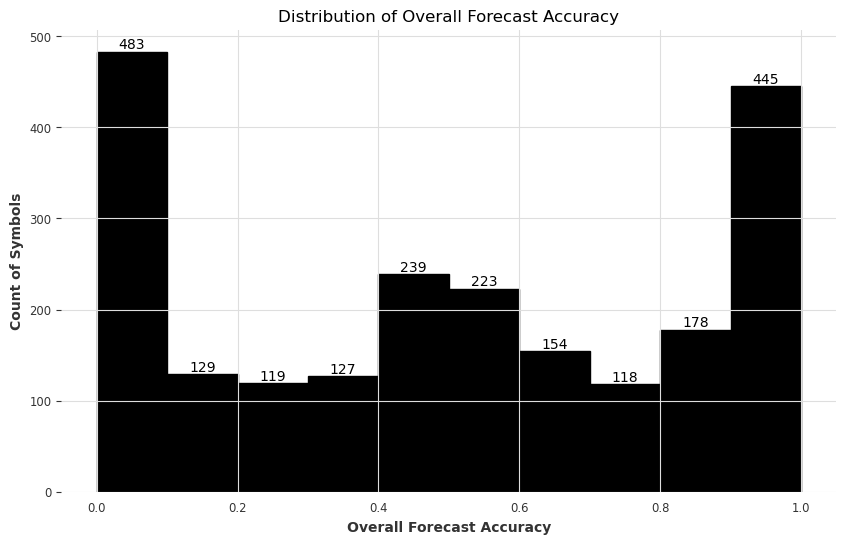

In [197]:
plt.figure(figsize=(10, 6))
bin_size = 0.1
bins = np.arange(0, 1.1, bin_size)  # Create bins from 0 to 1 (inclusive) with the specified bin size
n, _, patches = plt.hist(accuracy_df['overall_accuracy'], bins=bins, edgecolor='black')

plt.xlabel('Overall Forecast Accuracy')
plt.ylabel('Count of Symbols')
plt.title('Distribution of Overall Forecast Accuracy')
plt.grid(True)

# Add count labels to each bin
for count, bin, patch in zip(n, bins, patches):
    bin_center = bin + bin_size / 2  # Calculate the center of the bin
    plt.text(bin_center, count, str(int(count)), ha='center', va='bottom')

plt.show()

**Observations:**
- The overall forecast accuracy distribution has peaks at both ends (483 counts of <=0.1 overall forecast accuracy and 445 counts of >=0.9 overall forecast accuracy)

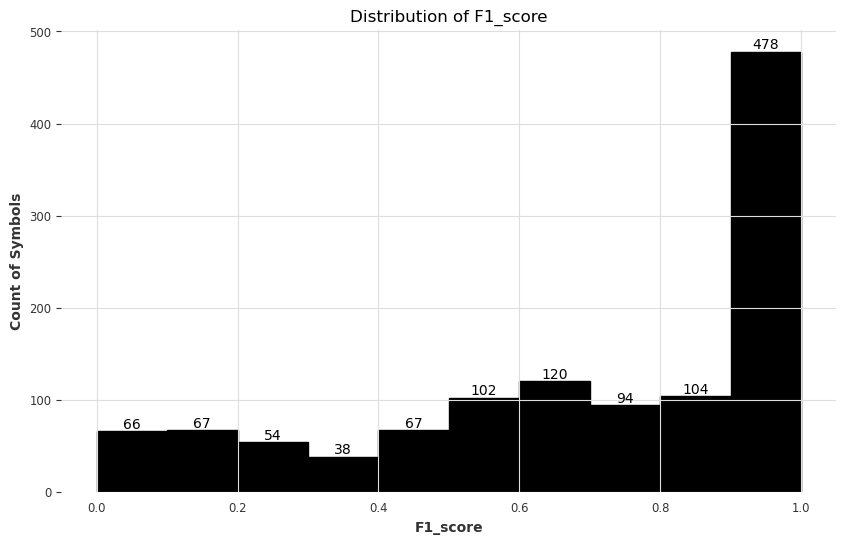

In [198]:
plt.figure(figsize=(10, 6))
bin_size = 0.1
bins = np.arange(0, 1.1, bin_size)  # Create bins from 0 to 1 (inclusive) with the specified bin size
n, _, patches = plt.hist(accuracy_df['F1_score'], bins=bins, edgecolor='black')

plt.xlabel('F1_score')
plt.ylabel('Count of Symbols')
plt.title('Distribution of F1_score')
plt.grid(True)

# Add count labels to each bin
for count, bin, patch in zip(n, bins, patches):
    bin_center = bin + bin_size / 2  # Calculate the center of the bin
    plt.text(bin_center, count, str(int(count)), ha='center', va='bottom')

plt.show()

**Observations:**
- The F1-score distribution is skewed towards left. 478 of the symbols have very good F1_score.

### 4.8.2 Analyze the stock profile of the 478 symbols with good F1_score (>=0.9)

In [199]:
# create a dataframe for these 478 symbols
symbols_good_f1_score_df = accuracy_df.loc[accuracy_df['F1_score']>=0.9]

In [200]:
symbols_good_f1_score_df.head(3)

,symbol,overall_accuracy,no_of_buy_recommendation,no_of_not_to_buy_recommendation,true_negative,false_positive,false_negative,true_positive,TP_percent,FP_percent,TN_percent,FN_percent,F1_score,overall_mape,overall_rmse,overall_bias
3,AAON,0.828571,35,0,0,6,0,29,0.83,0.17,NaN,NaN,0.91,0.15,13.11,-4.53
4,AAPL,0.942857,35,0,0,2,0,33,0.94,0.06,NaN,NaN,0.97,0.08,14.95,2.74
5,ABCB,0.914286,31,4,1,0,3,31,1.00,0.00,0.25,0.75,0.95,0.39,19.83,-18.13


In [201]:
ticker_info_df.head()

,symbol,name,sector,industry,description,type,CEO,country
0,AACG,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AACIW,Armada Acquisition Corp. I,NaN,NaN,NaN,Common Stock,NaN,US
2,AADI,"Aadi Bioscience, Inc.",Healthcare,Biotechnology,"Aadi Bioscience, Inc., a clinical-stage biopha...",Common Stock,Mr. Scott M. Giacobello CPA,US
3,AADR,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AAL,American Airlines Group Inc,Industrials,Airlines,"American Airlines Group Inc., through its subs...",Common Stock,Mr. Robert D. Isom Jr.,US


In [202]:
# Copy the column 'symbol' as index
symbols_good_f1_score_v2_df = symbols_good_f1_score_df.set_index('symbol').copy()

In [203]:
symbols_good_f1_score_v2_df.head()

,overall_accuracy,no_of_buy_recommendation,no_of_not_to_buy_recommendation,true_negative,false_positive,false_negative,true_positive,TP_percent,FP_percent,TN_percent,FN_percent,F1_score,overall_mape,overall_rmse,overall_bias
symbol,,,,,,,,,,,,,,,
AAON,0.828571,35,0,0,6,0,29,0.83,0.17,NaN,NaN,0.91,0.15,13.11,-4.53
AAPL,0.942857,35,0,0,2,0,33,0.94,0.06,NaN,NaN,0.97,0.08,14.95,2.74
ABCB,0.914286,31,4,1,0,3,31,1.00,0.00,0.25,0.75,0.95,0.39,19.83,-18.13
ACGL,0.914286,35,0,0,3,0,32,0.91,0.09,NaN,NaN,0.96,0.21,16.89,-11.70
ACLS,0.942857,35,0,0,2,0,33,0.94,0.06,NaN,NaN,0.97,0.51,59.04,-42.82


In [204]:
# Copy the column 'symbol' as index
ticker_info_v2_df = ticker_info_df.set_index('symbol').copy()

In [205]:
# Concatenate the DataFrames along axis=1 using the index and perform a left join
symbols_good_f1_score_final_df = pd.concat([symbols_good_f1_score_v2_df, ticker_info_v2_df], axis=1, join='outer')
symbols_good_f1_score_final_df.head()

,overall_accuracy,no_of_buy_recommendation,no_of_not_to_buy_recommendation,true_negative,false_positive,false_negative,true_positive,TP_percent,FP_percent,TN_percent,FN_percent,F1_score,overall_mape,overall_rmse,overall_bias,name,sector,industry,description,type,CEO,country
symbol,,,,,,,,,,,,,,,,,,,,,,
AAON,0.828571,35.0,0.0,0.0,6.0,0.0,29.0,0.83,0.17,NaN,NaN,0.91,0.15,13.11,-4.53,AAON Inc,Industrials,Building Products & Equipment,"AAON, Inc., together with its subsidiaries, en...",Common Stock,Mr. Gary D. Fields,US
AAPL,0.942857,35.0,0.0,0.0,2.0,0.0,33.0,0.94,0.06,NaN,NaN,0.97,0.08,14.95,2.74,Apple Inc,Technology,Consumer Electronics,"Apple Inc. designs, manufactures, and markets ...",Common Stock,Mr. Timothy D. Cook,US
ABCB,0.914286,31.0,4.0,1.0,0.0,3.0,31.0,1.00,0.00,0.25,0.75,0.95,0.39,19.83,-18.13,Ameris Bancorp,Financial Services,Banks—Regional,Ameris Bancorp operates as the bank holding co...,Common Stock,Mr. H. Palmer Proctor Jr.,US
ACGL,0.914286,35.0,0.0,0.0,3.0,0.0,32.0,0.91,0.09,NaN,NaN,0.96,0.21,16.89,-11.70,Arch Capital Group Ltd,Financial Services,Insurance—Diversified,"Arch Capital Group Ltd., together with its sub...",Common Stock,Mr. Marc Grandisson,US
ACLS,0.942857,35.0,0.0,0.0,2.0,0.0,33.0,0.94,0.06,NaN,NaN,0.97,0.51,59.04,-42.82,Axcelis Technologies Inc,Technology,Semiconductor Equipment & Materials,"Axcelis Technologies, Inc. designs, manufactur...",Common Stock,Dr. Russell J. Low Ph.D.,US


In [206]:
# Drop rows with NaN values in the 'overall_accuracy' column
symbols_good_f1_score_final_df.dropna(subset=['overall_accuracy'], inplace=True)

In [207]:
len(symbols_good_f1_score_final_df)

478

In [208]:
symbols_good_f1_score_final_df.to_pickle("./Data/best_fit_stocks_recommendation.pkl")